# The Iris Dataset

An straighforward ML exercise.

## 1. Loading Modules

### Basic

In [5]:
import numpy as np
import inspect
import os.path

from math import pi
from operator import itemgetter

# from scipy import stats
# from scipy.interpolate import interp1d
# from scipy.optimize import curve_fit, brentq
# from scipy.integrate import quad, simps

### Data Handling and Cleaning

In [6]:
import pandas as pd

# import datetime as dt
# import charset_normalizer
# import fuzzywuzzy as fwz

### Data Visualization and Analysis

In [7]:
import matplotlib.pyplot as plt
import seaborn as sns

from dataprep.eda import create_report

In [8]:
# %matplotlib inline

In [9]:
sns.set_style("whitegrid")

In [10]:
# plt.rcParams['font.family'] = 'Times New Roman'
# plt.rcParams['mathtext.fontset'] = 'stix'#['dejavusans', 'dejavuserif', 'cm', 'stix', 'stixsans', 'custom']
# font = {'family': 'Times New Roman',
#         #'color':  'black',
#         'weight': 'normal',
#         'size': 14,
#         }

# aesthetic definitions for the plots
# font = {'size'   : 16, 'family':'STIXGeneral'}
# axislabelfontsize='large'
# matplotlib.rc('font', **font)
# matplotlib.mathtext.rcParams['legend.fontsize']='medium'
# plt.rcParams["figure.figsize"] = [8.0,6.0]

# %config InlineBackend.figure_format = "retina"
# plt.rcParams['figure.figsize'] = (13, 8)
# plt.rcParams['font.family'] = 'STIXGeneral'
# matplotlib.mathtext.rcParams['legend.fontsize']='medium'
# plt.rcParams['font.serif'] = ['New Times Roman']
# plt.rc('text', usetex=True)

## 2. Loading data 

We will prepare the dataset

In [11]:
# sklearn already has the iris dataset
from sklearn.datasets import load_iris

In [12]:
# defining path to data file
file_path = "./data/iris_dataset.csv"

# checking if dataset exists
data_exists = os.path.exists(file_path)
print(data_exists)

True


In [13]:
# defining the dataset: raw_data

if data_exists:
    raw_data = pd.read_csv(file_path, index_col=0)

else:
    # loading the data as a pandas DataFrame
    sk_data = load_iris(as_frame=True)

    # the data is split into the actual physical data of the flowers (features), the species in code (target), and the species names
    print(sk_data['data'])
    print(sk_data['target'])
    print(sk_data['target_names'])

    # we define a new DataFrame that has all the information we need:
    raw_data = sk_data['data'].copy()
    raw_data['species'] = sk_data['target'].apply(lambda species_code: sk_data['target_names'][species_code])

    # saving the dataset to the folder
    raw_data.to_csv(file_path)

In [14]:
raw_data

,sepal length (cm),sepal width (cm),petal length (cm),petal width (cm),species
0,5.1,3.5,1.4,0.2,setosa
1,4.9,3.0,1.4,0.2,setosa
2,4.7,3.2,1.3,0.2,setosa
3,4.6,3.1,1.5,0.2,setosa
4,5.0,3.6,1.4,0.2,setosa
...,...,...,...,...,...
145,6.7,3.0,5.2,2.3,virginica
146,6.3,2.5,5.0,1.9,virginica
147,6.5,3.0,5.2,2.0,virginica
148,6.2,3.4,5.4,2.3,virginica


## 3. Data Cleaning

It's a bit hard to manipulate the data with these names. Let us clean them up!

In [15]:
# copying the original data so we can manipulate it
data = raw_data.copy()

In [16]:
def new_name(col_name):
    
    words = col_name.split(' ') # split along spaces
    if len(words) > 1:
        new_col_name = words[0] + '_' + words[1] # new name
    else:
        new_col_name = col_name

    return new_col_name

In [17]:
new_names = {col:new_name(col) for col in data.columns}
print(new_names)

{'sepal length (cm)': 'sepal_length', 'sepal width (cm)': 'sepal_width', 'petal length (cm)': 'petal_length', 'petal width (cm)': 'petal_width', 'species': 'species'}


In [18]:
data = data.rename(columns = new_names)

## 4. Exploratory Data Analysis

Let us create a report on the dataset

In [230]:
report1 = create_report(data, title='Iris Dataset')
# report1.show_browser()

  0%|                                                                                                         …

/home/mbuenabad/anaconda3/lib/python3.11/site-packages/dask/core.py:127: RuntimeWarning: invalid value encountered in divide
  return func(*(_execute_task(a, cache) for a in args))


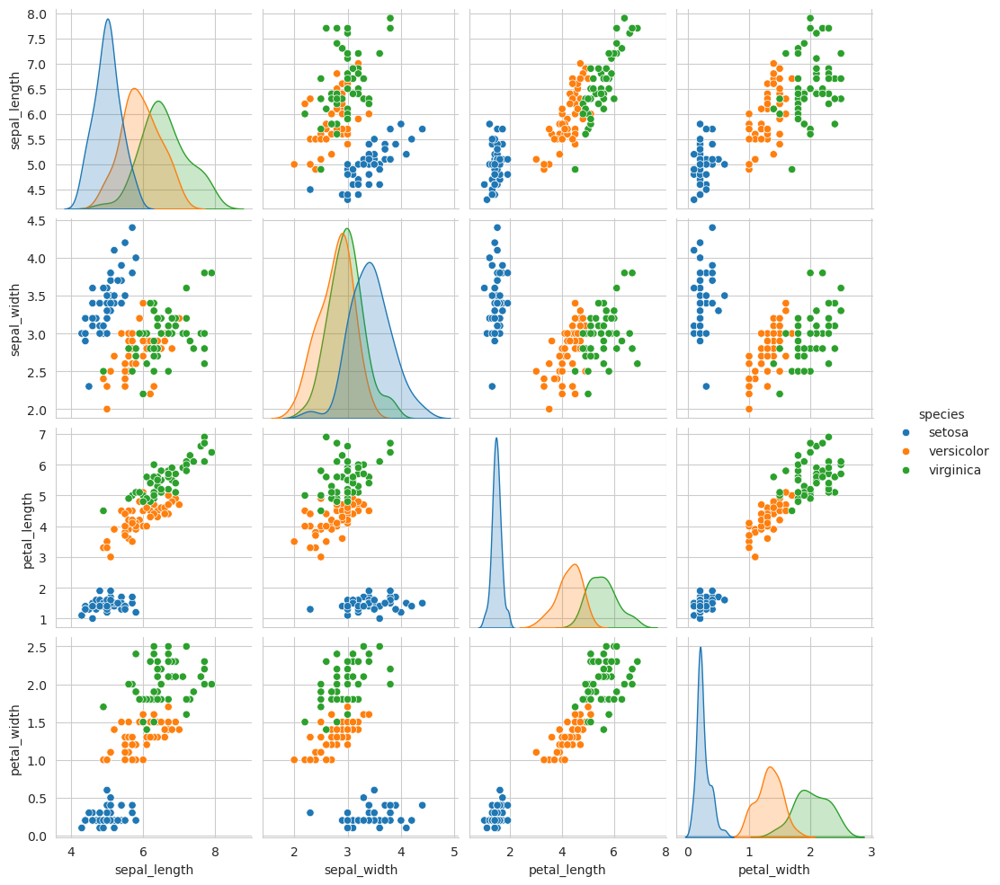

In [231]:
sns.pairplot(data, hue='species')

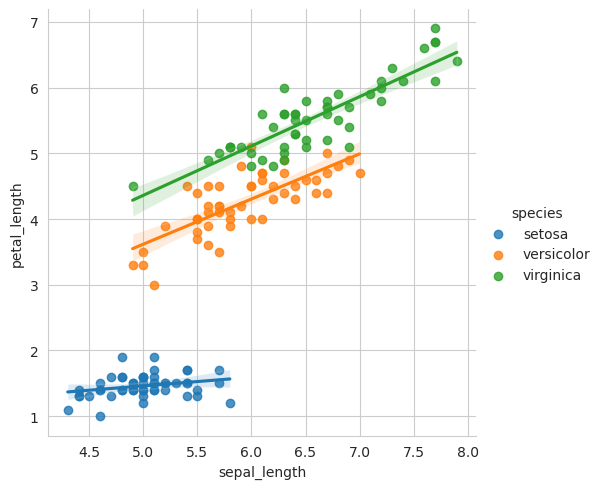

In [21]:
sns.lmplot(data, x='sepal_length', y='petal_length', hue='species')

## 5. Preprocessing

### Importing modules

In [33]:
from sklearn import set_config

from sklearn.pipeline import Pipeline

from sklearn.base import BaseEstimator, TransformerMixin
# from sklearn.utils.validation import validate_data

from sklearn.compose import ColumnTransformer

from sklearn.preprocessing import LabelEncoder, MinMaxScaler, PowerTransformer, StandardScaler

from sklearn.model_selection import train_test_split

# from sklearn.preprocessing import MinMaxScaler
# from scipy.stats import boxcox
# from sklearn.model_selection import cross_val_score

from sklearn.feature_selection import mutual_info_classif, SelectKBest, RFE, RFECV

Ensuring 

In [34]:
set_config(transform_output="pandas") # globally!

### Feature Engineering

It may be useful to consider additional features, such as the area of the petals and sepals, and their elongation. It may also prove useful to compare the ratio of the petal and sepal areas. We will make a new copy of the data for that.

In [35]:
# function for new features
def new_iris_features(dataset):
    """
    Computes the area and elongation of each part of the irist flower in the iris dataset.
    """

    new_features = {}

    for part in ['sepal', 'petal']:
        new_features[part+'_area'] = dataset[part+'_length']*dataset[part+'_width'] # compute area
        new_features[part+'_elongation'] = dataset[part+'_length']/dataset[part+'_width'] # compute elongation

    new_features['petal_to_sepal_ratio'] = new_features['petal_area']/new_features['sepal_area']

    new_features = pd.DataFrame(new_features, index=dataset.index)

    return new_features

In [36]:
engineered_data = data.copy() # making copy

# applying the function
engineered_data = pd.concat([engineered_data, new_iris_features(engineered_data)], axis=1)

In [37]:
engineered_data.columns

Index(['sepal_length', 'sepal_width', 'petal_length', 'petal_width', 'species',
       'sepal_area', 'sepal_elongation', 'petal_area', 'petal_elongation',
       'petal_to_sepal_ratio'],
      dtype='object')

In [38]:
report2 = create_report(engineered_data, title='Iris Dataset (new features)')
# report2.show_browser()

  0%|                                                                                                         …

/home/mbuenabad/anaconda3/lib/python3.11/site-packages/dask/core.py:127: RuntimeWarning: invalid value encountered in divide
  return func(*(_execute_task(a, cache) for a in args))


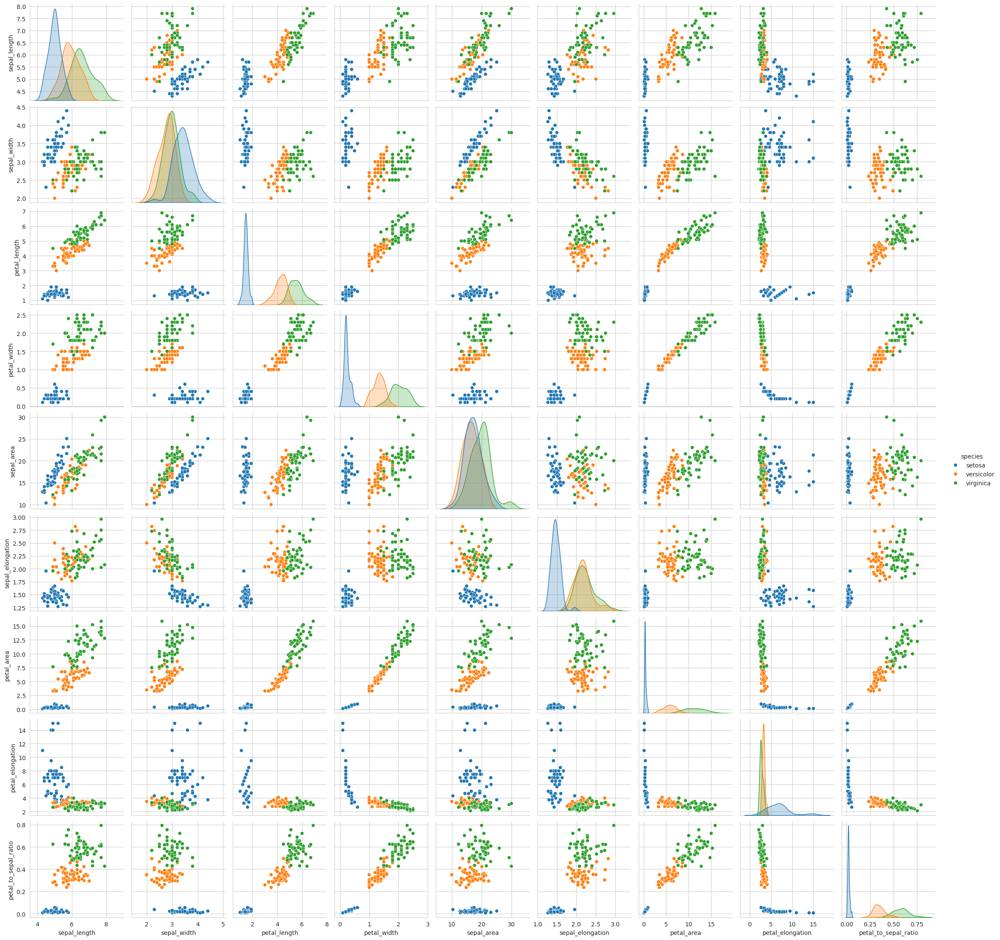

In [39]:
sns.pairplot(engineered_data, hue='species')

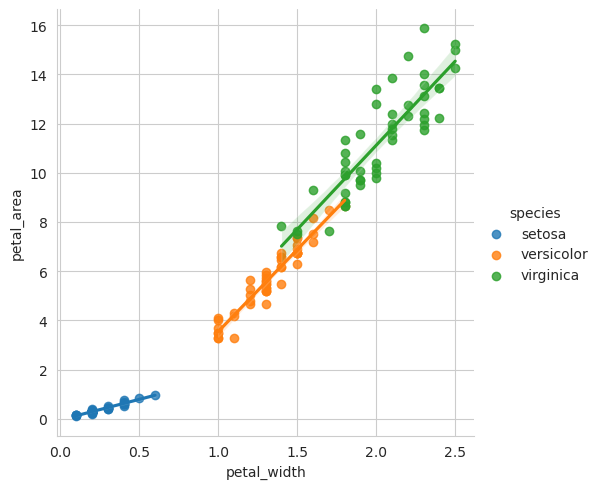

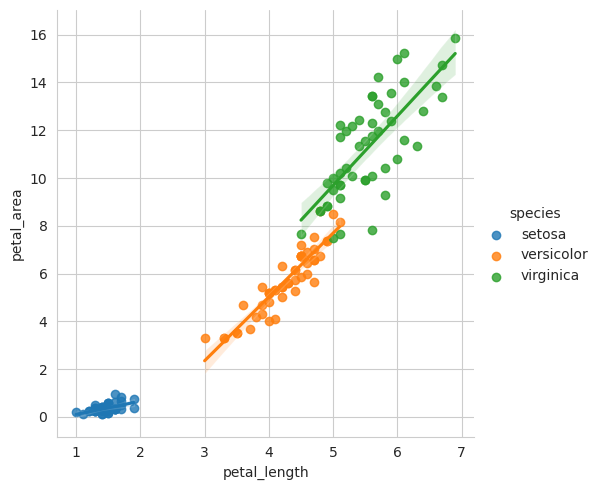

In [40]:
sns.lmplot(engineered_data, x='petal_width', y='petal_area', hue='species')
sns.lmplot(engineered_data, x='petal_length', y='petal_area', hue='species')

Are the new features we devised useful? Let us consider, for example, their mutual information.

In [41]:
data_features = data[[col for col in data.columns if col != 'species']]
data_target = data['species']

dict(zip(data_features.columns, mutual_info_classif(data_features, data_target, random_state=0)))

{'sepal_length': 0.4738732342805525,
 'sepal_width': 0.28607227699171767,
 'petal_length': 0.9895851732491787,
 'petal_width': 0.9749379656705233}

In [42]:
engineered_features = engineered_data[[col for col in engineered_data.columns if col != 'species']]
engineered_target = engineered_data['species']

dict(zip(engineered_features.columns, mutual_info_classif(engineered_features, engineered_target, random_state=0)))

{'sepal_length': 0.4850117009760031,
 'sepal_width': 0.22574931765737527,
 'petal_length': 0.9965609419312291,
 'petal_width': 0.9858585665368909,
 'sepal_area': 0.013982564694461797,
 'sepal_elongation': 0.6117017809512086,
 'petal_area': 1.0385466048858074,
 'petal_elongation': 0.6357535657274056,
 'petal_to_sepal_ratio': 1.0038937920124062}

So let us define our Feature Engineering class to include in our future pipeline:

In [43]:
class FeatureEngineer(BaseEstimator, TransformerMixin):
    """
    A scikit-learn compatible transformer that applies a feature engineering function
    to a pandas DataFrame X and returns an expanded DataFrame including new features.
    """
    def __init__(self, func):
        """
        Parameters
        ----------
        func : callable
            A function that takes a pandas DataFrame X and returns a pandas DataFrame
            of new features (with the same index as X) or an empty DataFrame.
        """
        self.func = func

    def fit(self, X, y=None):

        # No fitting necessary
        
        return self

    def transform(self, X):
        
        # 1. Check we got a DataFrame
        if not isinstance(X, pd.DataFrame):
            raise ValueError("FeatureAdder.transform input must be a pandas DataFrame")

        # 2. Compute new features
        X_new = self.func(X.copy())

        if not isinstance(X_new, pd.DataFrame):
            raise ValueError("func must return a pandas DataFrame")

        # 3. Ensure no name collisions:
        overlap = set(X.columns).intersection(X_new.columns)
        if overlap:
            raise ValueError(f"Naming collision between original and new features: {overlap}")
            # return X

        # 4. Concatenate side by side
        X_out = pd.concat([X.reset_index(drop=True),
                           X_new.reset_index(drop=True)],
                          axis=1)

        return X_out

#### Deprecated

In [211]:
# from sklearn.base import BaseEstimator, TransformerMixin

# class FeatureEngineer(BaseEstimator, TransformerMixin):
#     """
#     A scikit-learn compatible transformer that applies a feature engineering function
#     to a pandas DataFrame X and returns an expanded DataFrame including new features.
#     """
#     def __init__(self, func):
#         """
#         Parameters
#         ----------
#         func : callable
#             A function that takes a pandas DataFrame X and returns a pandas DataFrame
#             of new features (with the same index as X) or an empty DataFrame.
#         """
#         self.func = func

#     def fit(self, X, y=None):
        
#         # This registers the input feature names for later use
#         # X = validate_data(self, X, reset=True)

#         self._input_features = list(X.columns)

#         new_df = self.func(X)
#         self._new_features = list(new_df.columns)

#         # No fitting necessary
        
#         return self

#     def transform(self, X):
#         """
#         Apply the feature engineering function and concatenate new features.

#         If any of the new feature columns collide with existing columns in X,
#         the original X is returned unchanged.

#         Parameters
#         ----------
#         X : pandas.DataFrame
#             Input data.

#         Returns
#         -------
#         pandas.DataFrame
#             Original DataFrame with new features appended if no collisions,
#             otherwise the original DataFrame.
#         """
#         # Ensure pandas DataFrame
#         if not isinstance(X, pd.DataFrame):
#             X = pd.DataFrame(X, columns=self._input_features)

#         # making this custom transformer compatible
#         # X = validate_data(self, X, reset=False)

#         # Generate new feature DataFrame
#         new_df = self.func(X)
#         if not isinstance(new_df, pd.DataFrame):
#             raise ValueError("Feature function must return a pandas DataFrame of new features")

#         # Check index alignment
#         if not new_df.index.equals(X.index):
#             raise ValueError("Index of new features does not match input DataFrame index")

#         # Detect collisions
#         # collisions = set(new_df.columns) & set(X.columns)
#         collisions = set(self._input_features) & set(self._new_features)
#         if collisions:
#             # If there's any collision, skip and return X unchanged
#             return X

#         # Concatenate new features
#         X_out = pd.concat([X, new_df], axis=1)
#         return X_out

#     def get_feature_names_out(self, input_features=None):
#         # return np.array(validate_data(self, pd.DataFrame(), reset=False).columns)
#         return np.array(self._input_features + self._new_features, dtype=object)

#     # # def _more_tags(self):
#     # #     return {"feature_names_out": "passthrough"}
#     # def __sklearn_tags__(self):
#     #     return {"feature_names_out": "passthrough"}

### Splitting: Features v. Target

In [44]:
# features vs. target
X = data.select_dtypes(exclude=['object']) # features
y = data['species'] # target

In [45]:
classes = np.unique(y) # finding the unique values of the species, sorted
print("sorted out species/classes:", classes)

sorted out species/classes: ['setosa' 'versicolor' 'virginica']


### Encoding Target data

We begin by label-encoding the targets:

In [46]:
le = LabelEncoder() # defining label encoder

y_encoded = le.fit_transform(y) # fitting and transforming validation data
y_encoded = pd.Series(y_encoded, name='encoded_'+y.name) # turning it into pandas Series 

In [47]:
print("Disagreements between original data and its encoding: ", (le.inverse_transform(y_encoded) != y).any())

Disagreements between original data and its encoding:  False


### Splitting: Training vs. Validation

The data is to be split once, and then used in all models.

In [48]:
# training vs. validation
X_train, X_val, y_train, y_val = train_test_split(X, y_encoded, test_size=0.25, random_state=1)

In [49]:
print("X_train.head():\n"+"."*20+"\n", X_train.head())
print("-"*50)
print("y_train.head():\n"+"."*20+"\n", y_train.head())
print("-"*50)
print("y_train.value_counts():\n"+"."*20+"\n", y_train.value_counts())

X_train.head():
....................
      sepal_length  sepal_width  petal_length  petal_width
54            6.5          2.8           4.6          1.5
108           6.7          2.5           5.8          1.8
112           6.8          3.0           5.5          2.1
17            5.1          3.5           1.4          0.3
119           6.0          2.2           5.0          1.5
--------------------------------------------------
y_train.head():
....................
 54     1
108    2
112    2
17     0
119    2
Name: encoded_species, dtype: int64
--------------------------------------------------
y_train.value_counts():
....................
 2    41
0    37
1    34
Name: encoded_species, dtype: int64


### Scaling

For this model, it's best if we scale the features:

In [50]:
# my_scaler = MinMaxScaler() # defining the scaler: MinMx
boxcox_scaler = PowerTransformer(method='box-cox', standardize=True) # defining the scaler: Box-Cox; note that I use this instead of scipy.stats.boxcox because the latter would require me to rescale the X data before splitting...
z_scaler = StandardScaler()

In [51]:
X_train_scaled = boxcox_scaler.fit_transform(X_train) # fitting and transforming training data
X_train_scaled = z_scaler.fit_transform(X_train_scaled)
X_val_scaled = z_scaler.transform(boxcox_scaler.transform(X_val)) # transforming validation data

Let us then include our scalers into several Column Transformers that will be part of a single pipeline. We better make sure we include all columns!

In [52]:
def scaling_preprocessor():

    # box-cox transformer. Note that the other columns are just passed through, and that we are NOT changing the names of the columns with the 'verbose' feature (which prepends the name of the transformer to the column)
    boxcox_trans = ColumnTransformer(transformers=[('box-cox', boxcox_scaler, slice(0, None))], remainder="passthrough", verbose_feature_names_out=False)

    # z_scaler transformer. Note that the other columns are just passed through, and that we are NOT changing the names of the columns with the 'verbose' feature (which prepends the name of the transformer to the column)
    zscaler_trans = ColumnTransformer(transformers=[('z_scaler', z_scaler, slice(0, None))], remainder="passthrough", verbose_feature_names_out=False)

    # NOTE: ColumnTransformers act IN PARALLEL, NOT SEQUENTIALLY. In other words, had we put each scaler into a single ColumnTransformer (transformers=[(...box-cox...), (...z_scaler...)]), then we would be applying each transformer on the original data *independently instead of sequentially* of the other, and then putting all the columns together!

    # To apply them in sequence instead, we need to use a Pipeline:
    preproc = Pipeline(steps=[('box-cox', boxcox_trans),
                              ('z_scaler', zscaler_trans)]).set_output(transform="pandas")

    # N.B.: with the method .set_output(transform="pandas") we ensure that the output is still a pd.DataFrame, so we can call the ColumnTransformers with the column names!
    
    return preproc

### Selector

Adding so many engineered features, while useful, leads to a much higher dimensionality space, which may be detrimental to a model's performace. In order to avoid this, we must select the most promising features.

We do this with our own selector

In [53]:
import numpy as np
import pandas as pd
from sklearn.base import BaseEstimator, TransformerMixin
from sklearn.feature_selection import mutual_info_classif

class RedundancyFilteredSelector(BaseEstimator, TransformerMixin):
    """Select features by mutual information with y, 
       dropping features correlated above `corr_threshold`."""
    
    def __init__(self, n_features=None, corr_threshold=0.9, random_state=None):
        """
        Parameters
        ----------
        n_features : int or None
            Maximum number of features to select. If None, selects until no candidates remain.
        corr_threshold : float
            Absolute Pearson correlation threshold above which a feature is considered redundant.
        random_state : int or None
            For mutual_info_classif sampling reproducibility.
        """
        self.n_features = n_features
        self.corr_threshold = corr_threshold
        self.random_state = random_state
        
    def fit(self, X, y):
        """
        Fit the selector: compute MI scores and select a nonredundant subset.
        
        Parameters
        ----------
        X : array-like, shape (n_samples, n_features)
        y : array-like, shape (n_samples,)
        """
        X = pd.DataFrame(X)  # ensures column indexing
        self.feature_names_ = X.columns.tolist()
        
        # 1. Compute mutual information for each feature
        mi = mutual_info_classif(X, y, random_state=self.random_state)
        mi_series = pd.Series(mi, index=self.feature_names_)
        
        # 2. Sort features by descending MI
        candidates = mi_series.sort_values(ascending=False).index.tolist()
        
        # 3. Compute full correlation matrix once
        corr_matrix = X.corr().abs()
        
        selected = []
        for feat in candidates:
            # Stop if reached n_features
            if (self.n_features is not None) and (len(selected) >= self.n_features):
                break
            
            # Skip if too correlated with any already selected
            if any(corr_matrix.loc[feat, sel] >= self.corr_threshold 
                   for sel in selected):
                continue
            
            selected.append(feat)
        
        self.selected_features_ = selected
        return self
    
    def transform(self, X):
        """
        Reduce X to the selected features.
        
        Parameters
        ----------
        X : array-like, shape (n_samples, n_features)
        """
        X = pd.DataFrame(X)
        return X[self.selected_features_].values
    
    def get_support(self):
        """Mask of selected features (boolean array)."""
        mask = [f in self.selected_features_ for f in self.feature_names_]
        return np.array(mask)
    
    def get_feature_names_out(self, input_features=None):
        """Names of the selected features."""
        return np.array(self.selected_features_)


In [155]:
# selector = SelectKBest(score_func=mutual_info_classif)
# selector = RFE(estimator=SVC(kernel='linear'), n_features_to_select=2, step=1)
# selector = RFECV(estimator=SVC(kernel='linear'), cv=5, min_features_to_select=2, scoring='f1_macro')
selector = RedundancyFilteredSelector(random_state=0)

### Final Preprocessing Pipelines

Putting together the preprocessing steps into a single pipeline:

In [156]:
final_preproc = {'raw':Pipeline(steps=[('scaler', scaling_preprocessor())]),
                 'eng':Pipeline(steps=[('feature_engineer', FeatureEngineer(func=new_iris_features)),
                                       ('scaler', scaling_preprocessor()),
                                       ('selector', selector)])}

In [157]:
new_eng_data = final_preproc['eng'].fit_transform(X_train, y_train)
print(new_eng_data.head())

del new_eng_data

   petal_area  petal_elongation  sepal_elongation  sepal_length  sepal_width  \
0    0.467093         -0.416932          0.877250      0.827422    -0.516181   
1    0.924227         -0.243357          1.689682      1.042462    -1.278671   
2    1.047708         -1.059416          0.749518      1.147882    -0.028405   
3   -1.244014          0.731853         -1.285426     -0.864845     1.129990   
4    0.553161         -0.131281          1.793937      0.263340    -2.084111   

   sepal_area  
0    0.234568  
1   -0.212289  
2    0.877554  
3    0.128506  
4   -1.402685  


## 6. Pipelines

### Importing Modules

In [277]:
# cross-validation
from sklearn.model_selection import GridSearchCV, RandomizedSearchCV, RepeatedStratifiedKFold

# scoring and evaluation
from sklearn.metrics import confusion_matrix, accuracy_score, precision_score, recall_score, f1_score, classification_report

# checking if model is fitted
from sklearn.utils.validation import check_is_fitted
from sklearn.exceptions import NotFittedError

# ML explainability
import shap
from sklearn.inspection import permutation_importance, partial_dependence
from scipy.stats import gaussian_kde
from sklearn.tree import plot_tree
from xgboost import plot_tree as xgb_plot_tree

# MODELS
# tree-based
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier
from xgboost import XGBClassifier
# need scaling, or at least it doesn't hurt
from sklearn.linear_model import LogisticRegression
from sklearn.neighbors import KNeighborsClassifier, NearestNeighbors
from sklearn.svm import SVC
from sklearn.naive_bayes import GaussianNB
from sklearn.neural_network import MLPClassifier

### Useful Definitions

We begin by defining a verbosity function:

In [60]:
# verbosity function
def verbosity(verbose, message):
    """
    A function that helps us print a message only when asked.
    """
    if verbose:
        print(message)
    else:
        pass

Now, some important dictionaries that we will fill during model evaluation:

In [61]:
# defining some important dictionaries, whose keys are the models we will study

pipe = {} # dictionary of model pipelines

# for cross-validation (CV):
param_grid = {} # dictionary of model hyperparameter grids

search = {} # dictionary of model CV searches

best_cv = {} # dictionary of model with best CV performance

Finally, the score dataframe which we will fill up:

In [62]:
# Create a score dataframe
scorecard = pd.DataFrame(index = ['Precision Train', 'Precision Validation',
                                  'Recall Train', 'Recall Validation',
                                  'Accuracy Train', 'Accuracy Validation',
                                  'F1 Train', 'F1 Validation'])

### Evaluation

We will do cross-validation, and also perform some basic hyperparameter optimization. For that, we need to define a function that defines the pipeline, evaluates the model with cross-validation, computes the metrics, spits out some plots (_e.g._, the confussion matrix), and allocates results to a dictionary. Must take a model/pipeline for argument, the hyperparameter grid, and the CV arguments and such. Also flags for if we want plots, SHAP, permutation importance, etc.

**TODO:**

1. Finish evaluation_model function
2. Finish explainer (for all models, including SVC; include trees and equivalents, SHAP, etc)
3. Include Naive Bayes, MLP in models; SVC(probability=True)
4. Evaluate them, explain them, select them!
5. Clean everything up

In [209]:
def model_evaluation(model_name, Xytv, avg='macro', perform_cv_randomized=(False,False), scoring='f1_macro', verbose=False, plots=False, random_state=0, **kwargs):
    """
    A function that evaluates a given model. Pass the model name and data, it will read out its pipeline (and param grid, if CV), and perform the model_name evaluation according to the scoring requested. May also show plots.
    """

    # splitting the datasets
    Xt, Xv, yt, yv = Xytv

    # splitting the CV and randomized flags
    perform_cv, randomized = perform_cv_randomized

    # the validation key
    val_key = '_cv' if perform_cv else '_no_cv'

    #-------------------------------------------
    # no cross-validation
    if not perform_cv:
        verbosity(verbose, (":"*70) + f"\nWe will evaluate model={model_name} with standard validation.\n" + ":"*70)

        # checking if model is fitted:
        try:
            check_is_fitted(pipe[model_name])
            verbosity(verbose, "\n -> Model is already fitted!")

        # if not, fit:
        except NotFittedError:
            verbosity(verbose, "\n -> Fitting the model")
            pipe[model_name].fit(Xt, yt)
            verbosity(verbose, "......Done!")

        # predictions
        verbosity(verbose, " -> Making predictions")
        
        yt_pred = pipe[model_name].predict(Xt)
        yv_pred = pipe[model_name].predict(Xv)
        
        verbosity(verbose, "......Done!")

    #-------------------------------------------
    # cross-validation
    else:
        verbosity(verbose, f"We will evaluate {model_name} with cross-validation.")

        # RSKF
        verbosity(verbose, "\n -> Creating instance of `RepeatedStratifiedKFold`")

        sig = inspect.signature(RepeatedStratifiedKFold)
        default_rskf_kwargs = [k for k, v in sig.parameters.items() if v.default is not inspect._empty] # keyword arguments of RepeatedStratifiedKFold
        rskf_kwargs = {k:v for k, v in kwargs.items() if k in default_rskf_kwargs} # picking arguments in kwargs that are meant for RepeatedStratifiedKFold
        rskf = RepeatedStratifiedKFold(random_state=random_state, **rskf_kwargs)
        
        verbosity(verbose, "......Done!")

        # creating the CV search
        verbosity(verbose, " -> Creating the CV search")
        
        # randomized search
        if randomized:
            sig = inspect.signature(RandomizedSearchCV)
            default_cvsearch_kwargs = [k for k, v in sig.parameters.items() if v.default is not inspect._empty] # keyword arguments of RandomizedSearchCV
            cvsearch_kwargs = {k:v for k, v in kwargs.items() if k in default_cv_search_kwargs} # picking arguments in kwargs that are meant for RandomizedSearchCV

            search[model_name] = RandomizedSearchCV(pipe[model_name],
                                               param_grid=param_grid[model_name],
                                               cv=rskf,
                                               scoring=scoring,
                                               n_jobs=-1,
                                               random_state=random_state,
                                               # error_score="raise",
                                               **cvsearch_kwargs)

        # grid search
        else:
            search[model_name] = GridSearchCV(pipe[model_name],
                                         param_grid=param_grid[model_name],
                                         cv=rskf,
                                         scoring=scoring,
                                         # error_score="raise",
                                         n_jobs=-1)

        verbosity(verbose, "......Done!")

        # checking if model is fitted:
        try:
            check_is_fitted(search[model_name])
            verbosity(verbose, "\n -> Model is already fitted!")

        # if not, fit:
        except NotFittedError:
            verbosity(verbose, "\n -> Fitting the model")
            search[model_name].fit(Xt, yt)
            verbosity(verbose, "......Done!")

        # picking the best from CV
        best_cv[model_name] = {}
        best_cv[model_name]['pipe'] = search[model_name].best_estimator_
        best_cv[model_name]['model'] = best_cv[model_name]['pipe'].named_steps['model']
        best_cv[model_name]['score'] = search[model_name].best_score_
        best_cv[model_name]['params'] = search[model_name].best_params_

        if verbose:
            print(" -> CV Results:")
            print(f"\t\tbest {scoring}: {best_cv[model_name]['score']}")
            print(f"\t\tbest params: {best_cv[model_name]['params']}")
            # print("\n")
            # print("."*100)
            # for score, std, params in zip(search[model_name].cv_results_['mean_test_score'], search[model_name].cv_results_['std_test_score'], search[model_name].cv_results_['params']):
            #     print(f"mean CV {scoring} score: {score:.4f} +- {std:.4e} --> {params}")
            verbosity(verbose, "......Done!")

        # predictions
        verbosity(verbose, " -> Making predictions")
        
        yt_pred = best_cv[model_name]['pipe'].predict(Xt)
        yv_pred = best_cv[model_name]['pipe'].predict(Xv)
        
        verbosity(verbose, "......Done!")


    #-------------------------------------------
    # classification report
    verbosity(verbose, " -> Creating Classification Reports")
    
    cr_train = classification_report(y_true=yt, y_pred=yt_pred, output_dict=True)
    cr_val = classification_report(y_true=yv, y_pred=yv_pred, output_dict=True)
    
    verbosity(verbose, "......Done!")

    # printing classification reports
    if verbose:
        print("\n")
        cr_train2 = pd.DataFrame(cr_train).T
        print("Classification Report: Training\n"+"."*50)
        print(cr_train2.to_markdown())
        print("\n")
        cr_val2 = pd.DataFrame(cr_val).T
        print("Classification Report: Validation\n"+"."*50)
        print(cr_val2.to_markdown())

    #-------------------------------------------
    # computing scores:
    verbosity(verbose, "\n -> Computing Scores")
        
    precision_train = cr_train[avg+' avg']['precision']
    precision_val = cr_val[avg+' avg']['precision']

    recall_train = cr_train[avg+' avg']['recall']
    recall_val = cr_val[avg+' avg']['recall']

    acc_train = accuracy_score(y_true=yt, y_pred=yt_pred)
    acc_val = accuracy_score(y_true=yv, y_pred=yv_pred)

    F1_train = cr_train[avg+' avg']['f1-score']
    F1_val = cr_val[avg+' avg']['f1-score']

    model_score = [precision_train, precision_val, recall_train, recall_val, acc_train, acc_val, F1_train, F1_val]
        
    verbosity(verbose, "......Done!")

    #-------------------------------------------
    # compare more f1's
    if verbose:
        print("\n"+"*"*50 + "\nDetailed Validation F1 scores:")
        print("."*50)
        for species, f1 in zip(classes, f1_score(yv, yv_pred, average=None)):
            print(species+" f1 score:\t", f1) # compute F1 for each class
        print("."*50)
        for method in ['micro', 'macro', 'weighted']:
            print(method+":", f1_score(y_true=yv, y_pred=yv_pred, average=method)) # compute F1 for each different kind of average

    #-------------------------------------------
    if plots:
        # calculate confusion matrix
        cm_train = confusion_matrix(yt, yt_pred)
        cm_val = confusion_matrix(yv, yv_pred)

        fig, ax = plt.subplots(1, 2, figsize=(11,4))

        print("*"*50 + "\nConfusion Matrices:")
        sns.heatmap(cm_train, annot=True, xticklabels=classes, yticklabels=classes, cmap="Reds", fmt='.4g', ax=ax[0])
        ax[0].set_xlabel("Predicted Label")
        ax[0].set_ylabel("True Label")
        ax[0].set_title("Training Confusion Matrix")

        sns.heatmap(cm_val, annot=True, xticklabels=classes, yticklabels=classes, cmap="Greens", fmt='.4g', ax=ax[1])
        ax[1].set_xlabel("Predicted Label")
        ax[1].set_ylabel("True Label")
        ax[1].set_title("Validation Confusion Matrix")

        plt.tight_layout()
        plt.show()

    #-------------------------------------------
    # updating scorecard
    scorecard[model_name+val_key] = model_score

    #-------------------------------------------
    # returning the model's score

    return model_score 

### Explanation

We begin by defining a function that helps us visualize a model, by plotting some useful figures:

In [ ]:
def model_visualization(fitted_pipeline, Xytv,
                        feature_names, target_names,
                        selected_features=None, tree_idx=0):
    """
    Visualize various diagnostics for classification models.

    Parameters:
    - model: trained classifier
    - Xt, y_train: training data arrays
    - X_val, y_val: validation data arrays
    - feature_names: list or Index of feature names
    - target_names: list or Index of target class names
    - selected_features: optional tuple of two feature names for 2D plots
    """

    # splitting the pipeline into preprocessing steps and the actual model
    preproc = fitted_pipeline[:-1] # preprocessing
    model = fitted_pipeline[-1] # model

    # splitting the datasets
    Xt, Xv, yt, yv = Xytv

    # processing the features with the fitted pipeline
    Xt = preproc.transform(Xt)
    Xv = preproc.transform(Xv)
    
    # Ensure feature_names and target_names are list
    if isinstance(feature_names, (pd.Index, np.ndarray)):
        feature_names = list(feature_names)
    if isinstance(target_names, (pd.Index, np.ndarray)):
        target_names = list(target_names)

    # Determine which plots apply
    plots = []
    if isinstance(model, DecisionTreeClassifier):
        plots += ['tree', 'pdp']
    elif isinstance(model, RandomForestClassifier):
        plots += ['rf_tree', 'pdp']
    elif isinstance(model, XGBClassifier):
        plots += ['xgb_tree', 'pdp']
    elif isinstance(model, LogisticRegression):
        # plots += ['coef_bar', 'coef_heatmap', 'pdp']
        plots += ['coef_heatmap', 'pdp']
    elif isinstance(model, SVC):
        plots += ['svm_sv', 'pdp']
    elif isinstance(model, KNeighborsClassifier):
        plots += ['knn_dist', 'pdp']
    elif isinstance(model, GaussianNB):
        plots += ['nb_kde', 'pdp']
    elif isinstance(model, MLPClassifier):
        plots += ['mlp_arch', 'mlp_heatmap', 'pdp']

    # Setup grid
    nplots = len(plots)
    ncols = 2
    nrows = int(np.ceil(nplots / ncols))
    fig, axes = plt.subplots(nrows, ncols, figsize=(6*ncols, 5*nrows))
    axes = axes.flatten()

    # Plot loop
    for ax, ptype in zip(axes, plots):
        if ptype == 'tree':
            plot_tree(model, filled=True, feature_names=feature_names,
                      class_names=target_names, ax=ax)
            ax.set_title('Decision Tree')

        elif ptype == 'rf_tree':
            plot_tree(model.estimators_[tree_idx], filled=True,
                      feature_names=feature_names, class_names=target_names,
                      ax=ax)
            ax.set_title('RandomForest First Tree')

        elif ptype == 'xgb_tree':
            xgb_plot_tree(model, num_trees=tree_idx, ax=ax)
            ax.set_title('XGBoost First Tree')

        # elif ptype == 'coef_bar':
        #     coefs = model.coef_.ravel()
        #     y_pos = np.arange(len(feature_names))
        #     print(coefs)
        #     print(y_pos)
        #     sns.barplot(x=coefs, y=y_pos, ax=ax)
        #     # ax.barh(y_pos, coefs)
        #     ax.set_yticks(y_pos)
        #     ax.set_yticklabels(feature_names)
        #     ax.set_title('LogReg Coefficients')

        elif ptype == 'coef_heatmap':
            coef_mat = model.coef_
            # im = ax.imshow(coef_mat, aspect='auto')
            sns.heatmap(coef_mat, xticklabels=feature_names, yticklabels=target_names, annot=True, ax=ax)
            # ax.set_xticks(np.arange(len(feature_names)))
            # ax.set_xticklabels(feature_names, rotation=90)
            # ax.set_yticks(np.arange(len(target_names)))
            # ax.set_yticklabels(target_names)
            ax.set_title('LogReg Coef Heatmap')
            # fig.colorbar(im, ax=ax)

        elif ptype == 'svm_sv':
            sv = model.support_vectors_
            first_feat_idx = Xt.columns.get_loc(selected_features[0])
            second_feat_idx = Xt.columns.get_loc(selected_features[1])            
            sns.scatterplot(x=Xt[selected_features[0]], y=Xt[selected_features[1]], ax=ax)
            sns.scatterplot(x=sv[:,first_feat_idx], y=sv[:,second_feat_idx], marker='s', s=50, ax=ax)
            ax.set_xlabel(selected_features[0])
            ax.set_ylabel(selected_features[1])
            ax.set_title('SVM Support Vectors')

        elif ptype == 'knn_dist':
            nbrs = NearestNeighbors(n_neighbors=model.n_neighbors).fit(Xt)
            dists, _ = nbrs.kneighbors(Xt)
            kth = dists[:, -1]
            sns.histplot(kth, bins=20, ax=ax)
            ax.set_title(f'KNN Distances (k={model.n_neighbors})')
            ax.set_xlabel('Distance to k-th neighbor')

        elif ptype == 'nb_kde':
            sel = selected_features or feature_names[:2]
            for feat in sel:
                xi = feature_names.index(feat)
                for cls in np.unique(y_train):
                    vals = Xt[y_train == cls, xi]
                    kde = gaussian_kde(vals)
                    xs = np.linspace(vals.min(), vals.max(), 200)
                    ax.plot(xs, kde(xs), label=f'{feat} (class {cls})')
            ax.legend(fontsize='small')
            ax.set_title('NB Feature KDE')

        elif ptype == 'mlp_arch':
            ax.axis('off')
            arch = [Xt.shape[1]] + list(model.hidden_layer_sizes) + [len(target_names)]
            txt = '\n'.join(f'Layer {i}: {n} neurons' for i, n in enumerate(arch))
            ax.text(0.1, 0.5, txt, fontsize=12)
            ax.set_title('MLP Architecture')

        elif ptype == 'mlp_heatmap':
            weights = []
            for w in model.coefs_:
                weights.append(w.flatten())
            all_w = np.concatenate(weights)
            ax.imshow(all_w[np.newaxis, :], aspect='auto')
            ax.set_yticks([])
            ax.set_title('MLP Weights Heatmap')
            ax.set_xlabel('Flattened weights')

        elif ptype == 'pdp':

            feature_name = selected_features[0] # pick only the most important feature

            pdp_results = partial_dependence(model, Xv, [feature_name],
                                             feature_names=[feature_name],
                                             kind='average', grid_resolution=100)
            

            grid_values   = pdp_results['grid_values'][0] # pick 1D array of feature values
            averages = pdp_results['average'] # shape = (n_classes, len(grid))

            for i, class_idx in enumerate(list(le.transform(classes))):

                class_name = le.inverse_transform(np.array([class_idx]))[0]

                ax.plot(grid_values, averages[i], label=str(class_idx)+ f" ({class_name})")

            ax.legend(title='Target class')
            ax.set_title(f'PDP of "{feature_name}" for each class')
            ax.set_xlabel(feature_name)
            ax.set_ylabel('Partial dependence')

    # Remove unused axes
    for j in range(len(plots), len(axes)):
        axes[j].axis('off')

    fig.tight_layout()
    plt.show()

Now, defining a function to explain the model

In [274]:
def explain_model(model_name, fitted_pipeline, Xytv, tree_idx=0, selected_features=None, random_state=0):
    """
    """

    # splitting the pipeline into preprocessing steps and the actual model
    preproc = fitted_pipeline[:-1] # preprocessing
    model = fitted_pipeline[-1] # model

    # splitting the datasets
    Xt, Xv, yt, yv = Xytv

    # processing the features with the fitted pipeline
    Xt_processed = preproc.transform(Xt)
    # Xt = Xt_processed
    Xv_processed = preproc.transform(Xv)

    # Permutation Importance
    print("*"*100 + "\nPerforming Permutation Importance:\n" + "."*50)

    # computing importances
    perm_import = permutation_importance(model, Xv_processed, yv, random_state=random_state)

    # zipping feature names and the means and stds of the importances
    feat_import = zip(Xv_processed.columns, perm_import['importances_mean'], perm_import['importances_std'])

    # sorting from highest to lowest means
    feat_import = sorted(feat_import, key=itemgetter(1), reverse=True)

    # printing
    print("The model's features are:\n")
    print([feat for feat, _, _ in feat_import])
    print("The most important features are:\n")
    for feat, mean, std in feat_import:
        print("\t"+feat+":", mean, "+-", std)
    print("\n" + ("*"*100) + "\n")

    # preparing for the explanatory plots
    # selecting the two most important features
    important_features = [column for column, importance, _ in feat_import][:2]

    feats_to_plot = important_features if selected_features == None else selected_features

    model_visualization(fitted_pipeline, Xytv,
                        Xv_processed.columns, classes,
                        selected_features=feats_to_plot, tree_idx=tree_idx)
    

    # SHAP
    tree_model = any([isinstance(model, DecisionTreeClassifier), isinstance(model, RandomForestClassifier), isinstance(model, XGBClassifier)])
    
    if tree_model:
        explainer = shap.TreeExplainer(model)
        shap_values = explainer.shap_values(Xv_processed)
    elif 'logreg' in model_name:
        explainer = shap.LinearExplainer(model, Xt_processed)
        shap_values = explainer.shap_values(Xv_processed)
    elif 'svc' in model_name:
        smaller_Xt = shap.sample(Xt_processed, 50)
        explainer = shap.KernelExplainer(model.predict_proba, smaller_Xt, link='logit')
        shap_values = explainer.shap_values(Xv_processed)
    elif 'knn' in model_name:
        smaller_Xt = shap.sample(Xt_processed, 50)
        explainer = shap.KernelExplainer(model.predict_proba, smaller_Xt, link='logit')
        shap_values = explainer.shap_values(Xv_processed)
    else:
        explainer = shap.KernelExplainer(model, Xt_processed)
        shap_values = explainer.shap_values(Xv_processed)

    # fig, ax = plt.subplots(1, len(classes), figsize=(11,4))

    for i in range(len(classes)):
        plt.figure()
        shap.summary_plot(shap_values[:,:,i], Xv_processed, show=False)
        plt.title('Class: '+f'{le.transform([classes[i]])[0]} ('+classes[i]+')')
        plt.tight_layout()
        plt.show()

    pass

## 7. Models

### Model 1: `DecisionTreeClassifier`

Defining the pipelines and hyperparameter grids:

In [158]:
model = 'dtc'

for pp in ['raw', 'eng']:

    model_name = model+'_'+pp # full model name

    preproc_pipe = final_preproc[pp] # preprocessing  pipeline

    pipe[model_name] = Pipeline(steps=[('preprocessor', preproc_pipe),
                                       ('model', DecisionTreeClassifier(random_state=0))])

    num_features_range = 4+1 if pp=='raw' else 9+1

    # defining the hyperparameter grid
    if pp == 'raw':
        param_grid[model_name] = {'model__max_leaf_nodes': [None] + list(range(2, 11)),
                                  'model__max_depth': [None] + list(range(1,11))}
    else:
        param_grid[model_name] = {'model__max_leaf_nodes': [None] + list(range(2, 11)),
                                  'model__max_depth': [None] + list(range(1,11)),
                                  'preprocessor__selector__n_features': [None, len(X.columns)],
                                  'preprocessor__selector__corr_threshold': [0.5, 0.7, 0.9]}

Performing the evaluation and explanation of the model:

***************************************************************************
dtc_raw , 	CV: False 

***************************************************************************
::::::::::::::::::::::::::::::::::::::::::::::::::::::::::::::::::::::
We will evaluate model=dtc_raw with standard validation.
::::::::::::::::::::::::::::::::::::::::::::::::::::::::::::::::::::::

 -> Fitting the model
......Done!
 -> Making predictions
......Done!
 -> Creating Classification Reports
......Done!


Classification Report: Training
..................................................
|              |   precision |   recall |   f1-score |   support |
|:-------------|------------:|---------:|-----------:|----------:|
| 0            |           1 |        1 |          1 |        37 |
| 1            |           1 |        1 |          1 |        34 |
| 2            |           1 |        1 |          1 |        41 |
| accuracy     |           1 |        1 |          1 |         1 |
| macro avg    |     

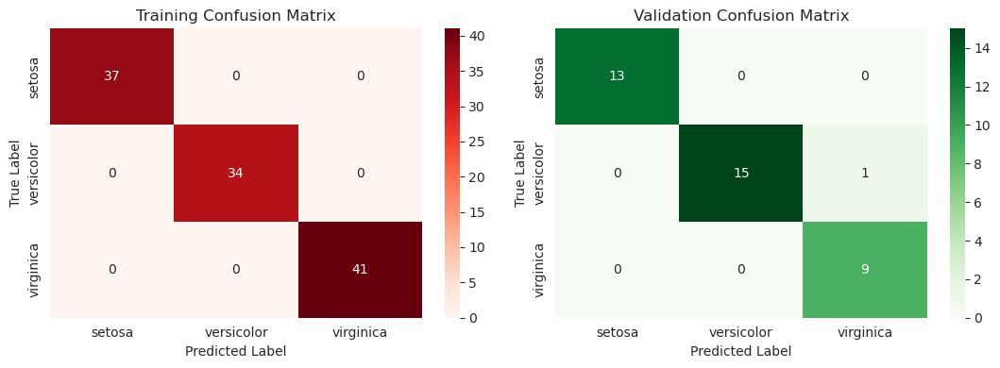






***************************************************************************
dtc_raw , 	CV: True 

***************************************************************************
We will evaluate dtc_raw with cross-validation.

 -> Creating instance of `RepeatedStratifiedKFold`
......Done!
 -> Creating the CV search
......Done!
 -> Fitting the model
......Done!
 -> CV Results:
		best f1_macro: 0.9600661970373013
		best params: {'model__max_depth': None, 'model__max_leaf_nodes': 4}
......Done!
 -> Making predictions
......Done!
 -> Creating Classification Reports
......Done!


Classification Report: Training
..................................................
|              |   precision |   recall |   f1-score |    support |
|:-------------|------------:|---------:|-----------:|-----------:|
| 0            |    1        | 1        |   1        |  37        |
| 1            |    1        | 0.941176 |   0.969697 |  34        |
| 2            |    0.953488 | 1        |   0.97619  |  41    

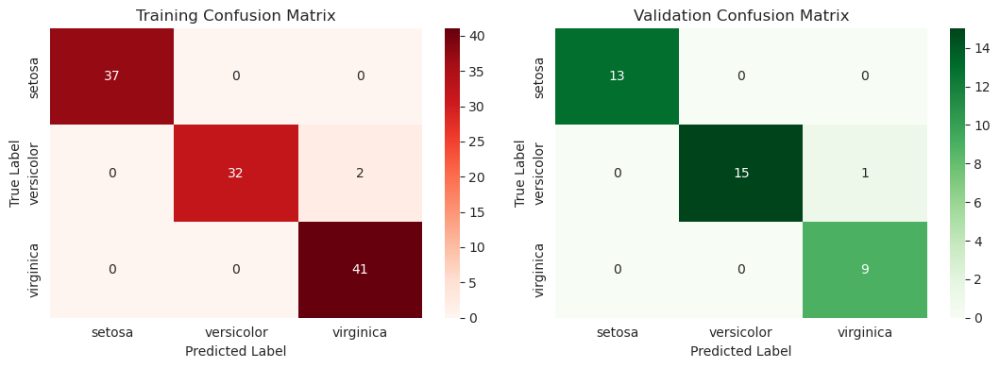



****************************************************************************************************
Performing Permutation Importance:
..................................................
The most important features are:

	petal_width: 0.5263157894736843 +- 0.06446025638903098
	petal_length: 0.11578947368421058 +- 0.035696473595396155
	sepal_length: 0.0 +- 0.0
	sepal_width: 0.0 +- 0.0

****************************************************************************************************



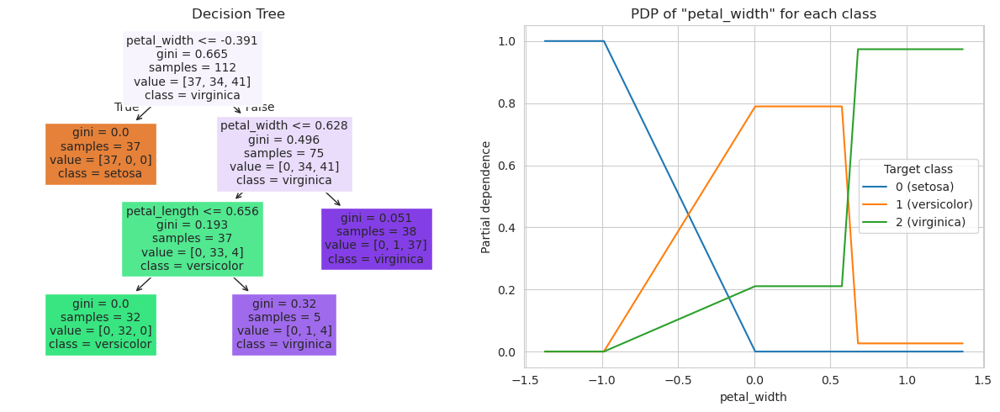

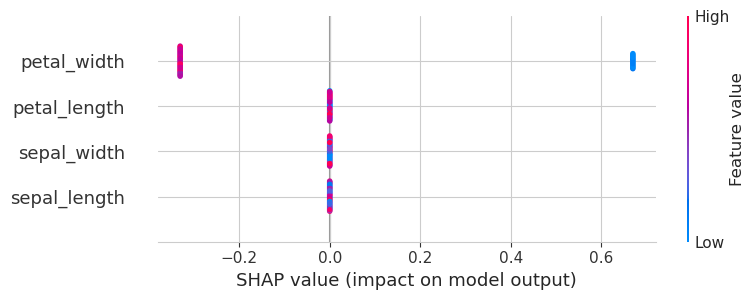

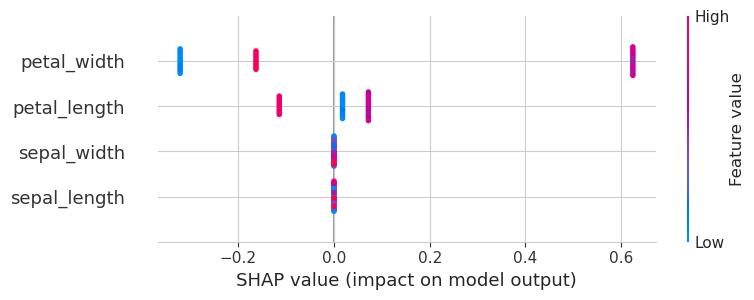

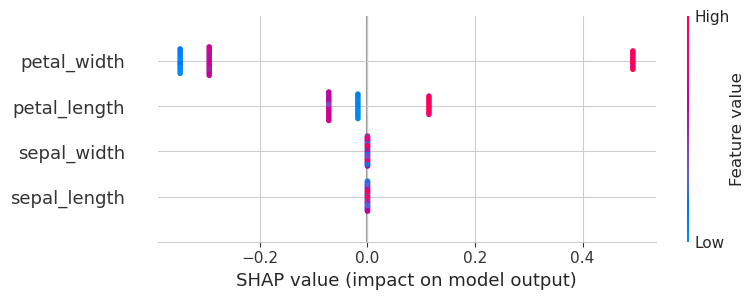




***************************************************************************
dtc_eng , 	CV: False 

***************************************************************************
::::::::::::::::::::::::::::::::::::::::::::::::::::::::::::::::::::::
We will evaluate model=dtc_eng with standard validation.
::::::::::::::::::::::::::::::::::::::::::::::::::::::::::::::::::::::

 -> Fitting the model
......Done!
 -> Making predictions
......Done!
 -> Creating Classification Reports
......Done!


Classification Report: Training
..................................................
|              |   precision |   recall |   f1-score |   support |
|:-------------|------------:|---------:|-----------:|----------:|
| 0            |           1 |        1 |          1 |        37 |
| 1            |           1 |        1 |          1 |        34 |
| 2            |           1 |        1 |          1 |        41 |
| accuracy     |           1 |        1 |          1 |         1 |
| macro avg    |  

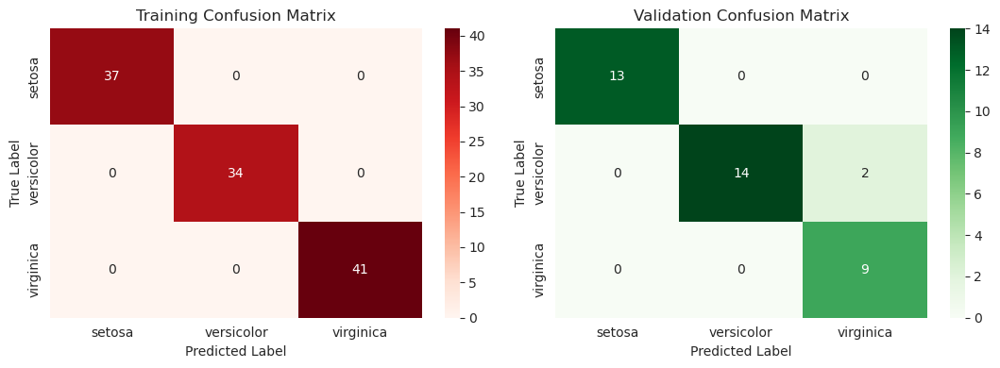






***************************************************************************
dtc_eng , 	CV: True 

***************************************************************************
We will evaluate dtc_eng with cross-validation.

 -> Creating instance of `RepeatedStratifiedKFold`
......Done!
 -> Creating the CV search
......Done!
 -> Fitting the model
......Done!
 -> CV Results:
		best f1_macro: 0.9485659751707225
		best params: {'model__max_depth': None, 'model__max_leaf_nodes': 3, 'preprocessor__selector__corr_threshold': 0.5, 'preprocessor__selector__n_features': None}
......Done!
 -> Making predictions
......Done!
 -> Creating Classification Reports
......Done!


Classification Report: Training
..................................................
|              |   precision |   recall |   f1-score |    support |
|:-------------|------------:|---------:|-----------:|-----------:|
| 0            |    1        | 1        |   1        |  37        |
| 1            |    1        | 0.941176

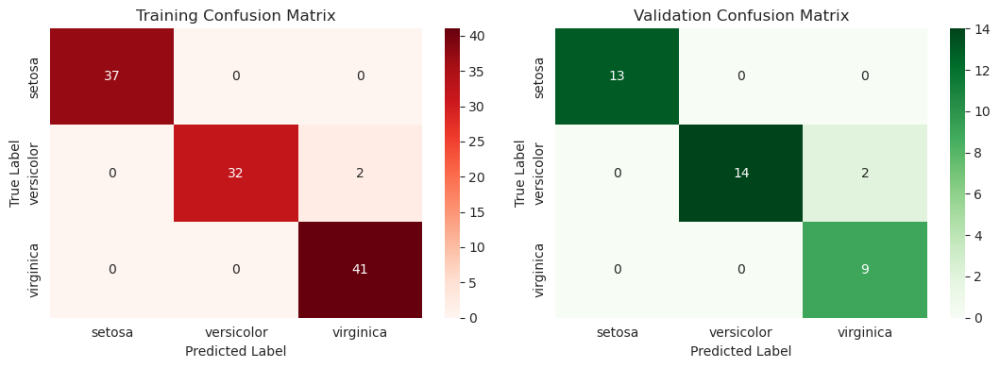



****************************************************************************************************
Performing Permutation Importance:
..................................................
The most important features are:

	petal_area: 0.5894736842105261 +- 0.0736842105263158
	sepal_width: 0.0 +- 0.0

****************************************************************************************************



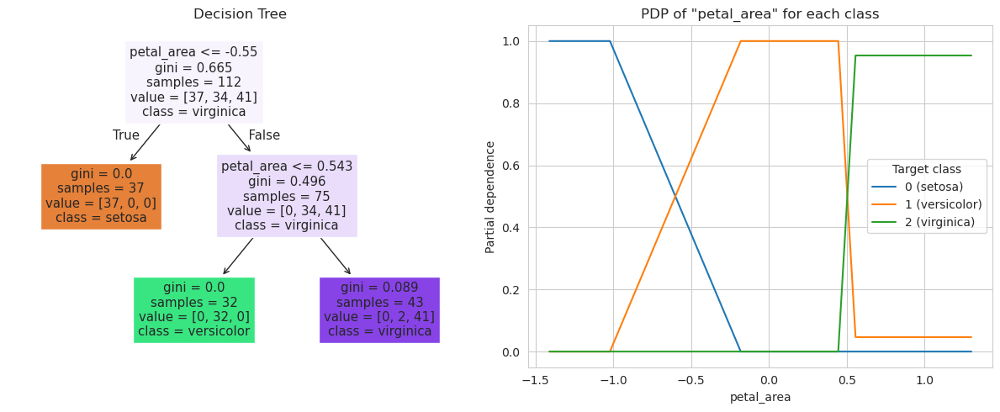

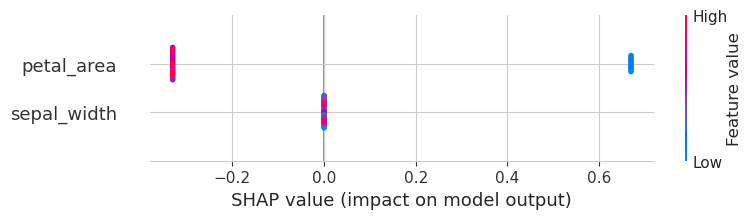

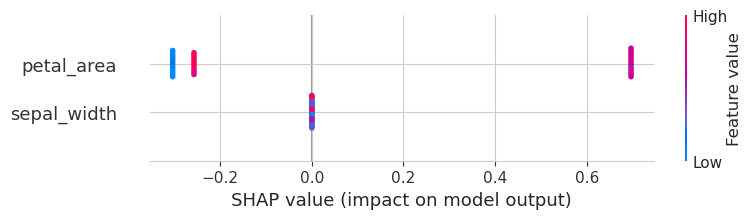

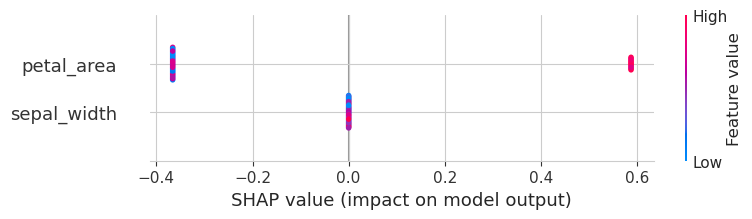

In [159]:
for pp in ['raw', 'eng']:
    for cvQ in [False, True]:

        model_name = model+'_'+pp # full model name

        print("*"*75)
        print(model_name, ", \tCV:", cvQ, "\n")
        print("*"*75)
        
        model_evaluation(model_name, (X_train, X_val, y_train, y_val),
                         perform_cv_randomized=(cvQ, False),
                         n_splits=5, n_repeats=3,
                         verbose=True, plots=True)

        print("\n")

        if cvQ:
            explain_model(model_name, best_cv[model_name]['pipe'], (X_train, X_val, y_train, y_val), tree_idx=0, random_state=0)

        print("\n\n")

In [160]:
best_cv['dtc_eng']['pipe'][:-1].transform(X_train)

,petal_area,sepal_width
0,0.467093,-0.516181
1,0.924227,-1.278671
2,1.047708,-0.028405
3,-1.244014,1.129990
4,0.553161,-2.084111
...,...,...
107,0.574026,-0.516181
108,0.861292,0.209923
109,0.532044,-1.278671
110,1.242508,0.209923


In [161]:
scorecard

,dtc_raw_no_cv,dtc_raw_cv,dtc_eng_no_cv,dtc_eng_cv,rfc_raw_no_cv,rfc_raw_cv,rfc_eng_no_cv,rfc_eng_cv,xgbc_raw_no_cv,xgbc_raw_cv,xgbc_eng_no_cv,xgbc_eng_cv
Precision Train,1.000000,0.984496,1.000000,0.984496,1.000000,1.000000,1.000000,0.984496,1.000000,0.984496,1.000000,1.000000
Precision Validation,0.966667,0.966667,0.939394,0.939394,0.966667,0.966667,0.939394,0.939394,0.942857,0.942857,0.939394,0.939394
Recall Train,1.000000,0.980392,1.000000,0.980392,1.000000,1.000000,1.000000,0.980392,1.000000,0.980392,1.000000,1.000000
Recall Validation,0.979167,0.979167,0.958333,0.958333,0.979167,0.979167,0.958333,0.958333,0.958333,0.958333,0.958333,0.958333
Accuracy Train,1.000000,0.982143,1.000000,0.982143,1.000000,1.000000,1.000000,0.982143,1.000000,0.982143,1.000000,1.000000
Accuracy Validation,0.973684,0.973684,0.947368,0.947368,0.973684,0.973684,0.947368,0.947368,0.947368,0.947368,0.947368,0.947368
F1 Train,1.000000,0.981962,1.000000,0.981962,1.000000,1.000000,1.000000,0.981962,1.000000,0.981962,1.000000,1.000000
F1 Validation,0.971703,0.971703,0.944444,0.944444,0.971703,0.971703,0.944444,0.944444,0.947888,0.947888,0.944444,0.944444


### Model 2: `RandomForestClassifier`

In [162]:
model = 'rfc'

for pp in ['raw', 'eng']:

    model_name = model+'_'+pp # full model name

    preproc_pipe = final_preproc[pp] # preprocessing  pipeline

    pipe[model_name] = Pipeline(steps=[('preprocessor', preproc_pipe),
                                       ('model', RandomForestClassifier(random_state=0))])

    # defining the hyperparameter grid
    if pp == 'raw':
        param_grid[model_name] = {'model__n_estimators': [100*i for i in range(1, 11)],
                                  'model__max_depth': [None] + [i for i in range(1, 6)]}
    else:
        param_grid[model_name] = {'model__n_estimators': [100*i for i in range(1, 11)],
                                  'model__max_depth': [None] + [i for i in range(1, 6)],
                                  'preprocessor__selector__n_features': [None, len(X.columns)],
                                  'preprocessor__selector__corr_threshold': [0.5, 0.7, 0.9]}

***************************************************************************
rfc_raw , 	CV: False 

***************************************************************************
::::::::::::::::::::::::::::::::::::::::::::::::::::::::::::::::::::::
We will evaluate model=rfc_raw with standard validation.
::::::::::::::::::::::::::::::::::::::::::::::::::::::::::::::::::::::

 -> Fitting the model
......Done!
 -> Making predictions
......Done!
 -> Creating Classification Reports
......Done!


Classification Report: Training
..................................................
|              |   precision |   recall |   f1-score |   support |
|:-------------|------------:|---------:|-----------:|----------:|
| 0            |           1 |        1 |          1 |        37 |
| 1            |           1 |        1 |          1 |        34 |
| 2            |           1 |        1 |          1 |        41 |
| accuracy     |           1 |        1 |          1 |         1 |
| macro avg    |     

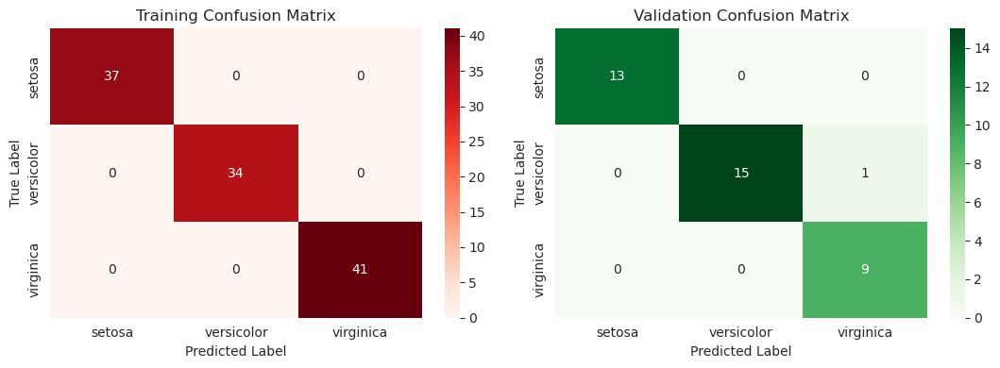






***************************************************************************
rfc_raw , 	CV: True 

***************************************************************************
We will evaluate rfc_raw with cross-validation.

 -> Creating instance of `RepeatedStratifiedKFold`
......Done!
 -> Creating the CV search
......Done!
 -> Fitting the model
......Done!
 -> CV Results:
		best f1_macro: 0.9461523298778203
		best params: {'model__max_depth': None, 'model__n_estimators': 400}
......Done!
 -> Making predictions
......Done!
 -> Creating Classification Reports
......Done!


Classification Report: Training
..................................................
|              |   precision |   recall |   f1-score |   support |
|:-------------|------------:|---------:|-----------:|----------:|
| 0            |           1 |        1 |          1 |        37 |
| 1            |           1 |        1 |          1 |        34 |
| 2            |           1 |        1 |          1 |        41 |

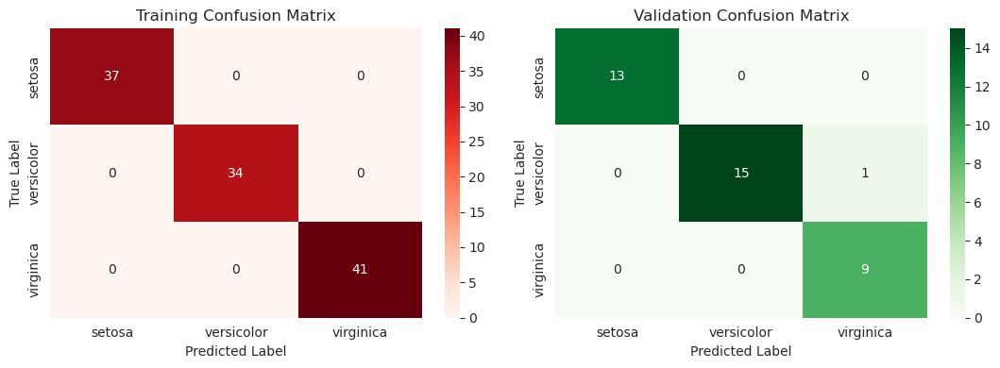



****************************************************************************************************
Performing Permutation Importance:
..................................................
The most important features are:

	petal_width: 0.1631578947368421 +- 0.042105263157894715
	petal_length: 0.15789473684210528 +- 0.04403473823863553
	sepal_length: 0.0 +- 0.0
	sepal_width: 0.0 +- 0.0

****************************************************************************************************



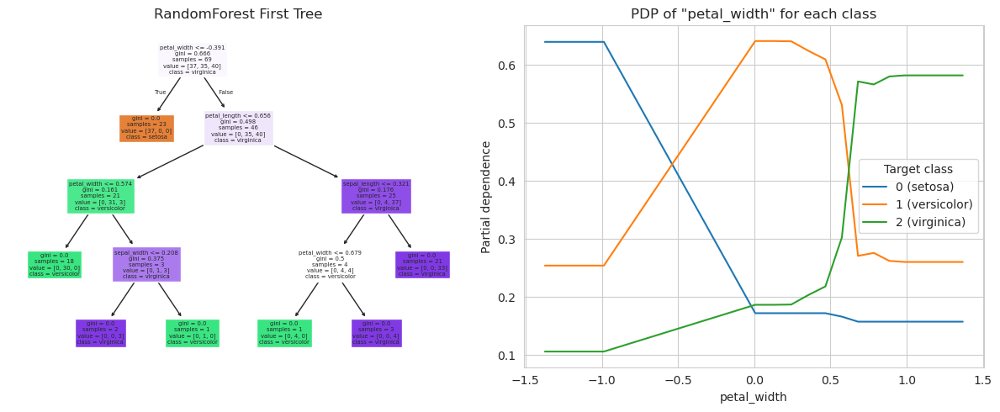

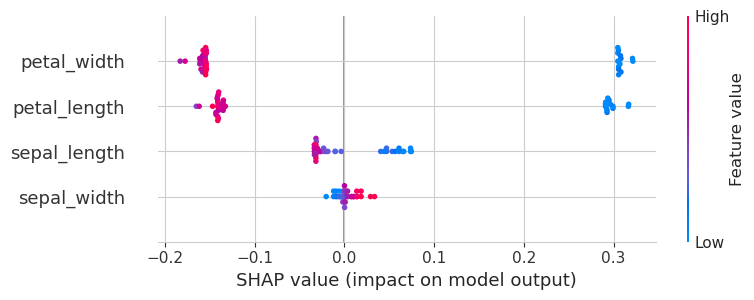

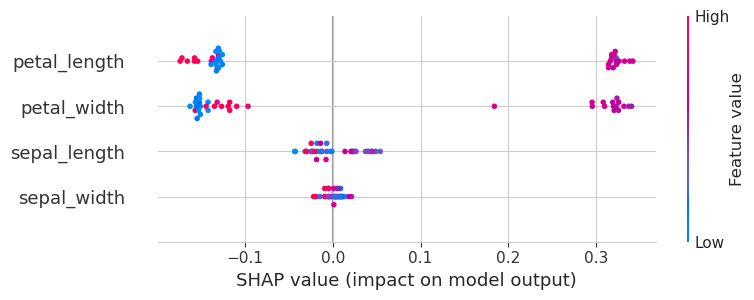

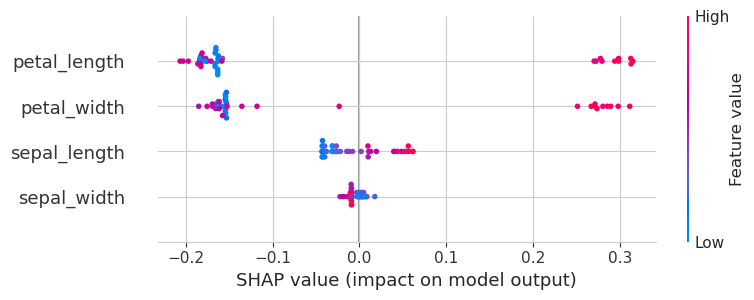




***************************************************************************
rfc_eng , 	CV: False 

***************************************************************************
::::::::::::::::::::::::::::::::::::::::::::::::::::::::::::::::::::::
We will evaluate model=rfc_eng with standard validation.
::::::::::::::::::::::::::::::::::::::::::::::::::::::::::::::::::::::

 -> Fitting the model
......Done!
 -> Making predictions
......Done!
 -> Creating Classification Reports
......Done!


Classification Report: Training
..................................................
|              |   precision |   recall |   f1-score |   support |
|:-------------|------------:|---------:|-----------:|----------:|
| 0            |           1 |        1 |          1 |        37 |
| 1            |           1 |        1 |          1 |        34 |
| 2            |           1 |        1 |          1 |        41 |
| accuracy     |           1 |        1 |          1 |         1 |
| macro avg    |  

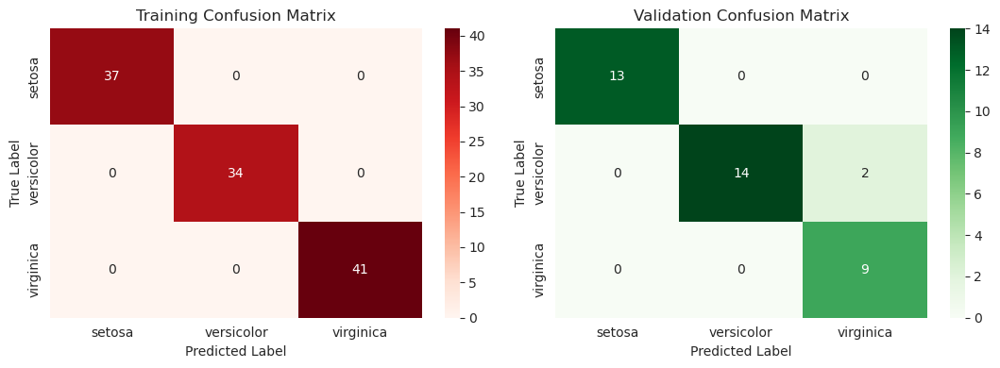






***************************************************************************
rfc_eng , 	CV: True 

***************************************************************************
We will evaluate rfc_eng with cross-validation.

 -> Creating instance of `RepeatedStratifiedKFold`
......Done!
 -> Creating the CV search
......Done!
 -> Fitting the model
......Done!
 -> CV Results:
		best f1_macro: 0.9417487714288542
		best params: {'model__max_depth': 1, 'model__n_estimators': 300, 'preprocessor__selector__corr_threshold': 0.9, 'preprocessor__selector__n_features': 4}
......Done!
 -> Making predictions
......Done!
 -> Creating Classification Reports
......Done!


Classification Report: Training
..................................................
|              |   precision |   recall |   f1-score |    support |
|:-------------|------------:|---------:|-----------:|-----------:|
| 0            |    1        | 1        |   1        |  37        |
| 1            |    1        | 0.941176 |   0

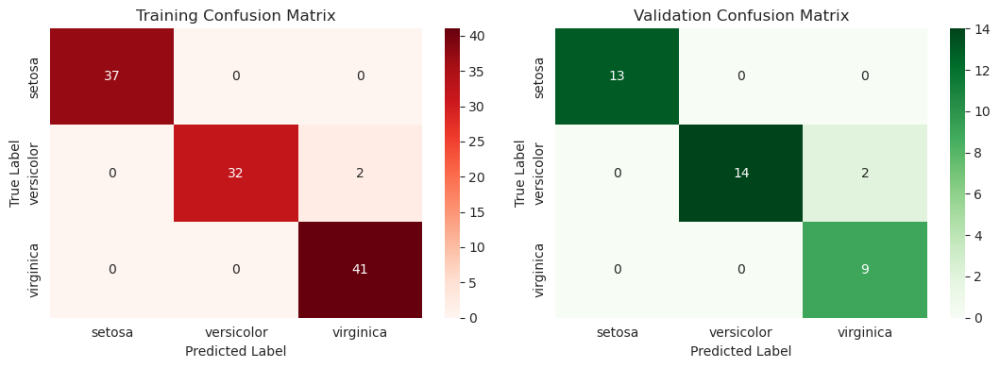



****************************************************************************************************
Performing Permutation Importance:
..................................................
The most important features are:

	petal_area: 0.3789473684210526 +- 0.04275809686650504
	sepal_elongation: 0.1263157894736842 +- 0.030689220499185755
	petal_elongation: 0.0 +- 0.0
	sepal_length: 0.0 +- 0.0

****************************************************************************************************



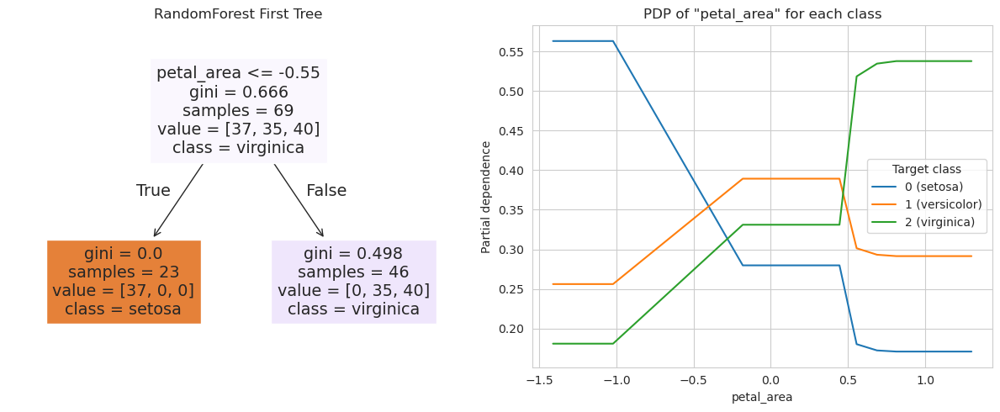

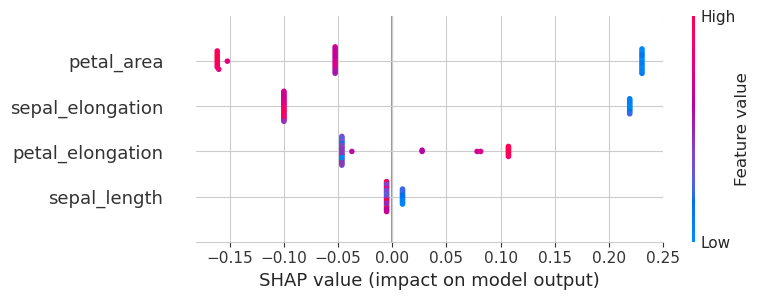

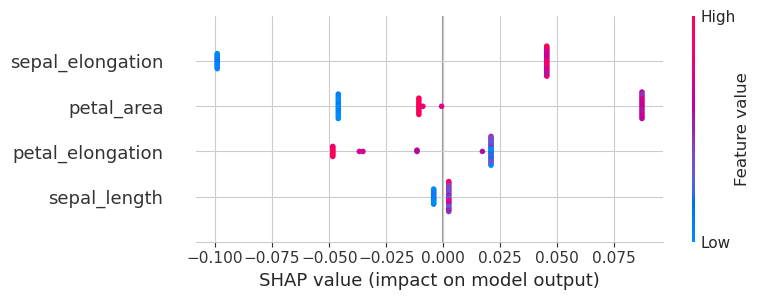

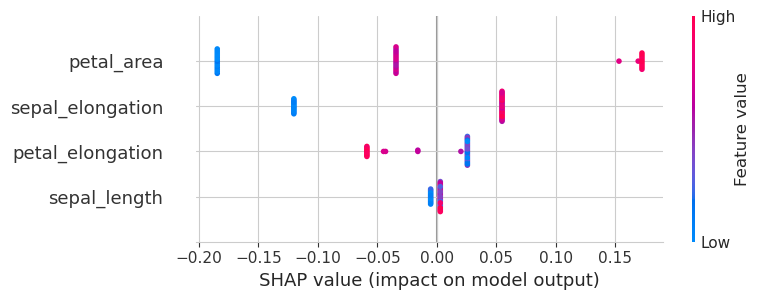

In [163]:
for pp in ['raw', 'eng']:
    for cvQ in [False, True]:

        model_name = model+'_'+pp # full model name

        print("*"*75)
        print(model_name, ", \tCV:", cvQ, "\n")
        print("*"*75)
        
        model_evaluation(model_name, (X_train, X_val, y_train, y_val),
                         n_splits=5, n_repeats=3,
                         perform_cv_randomized=(cvQ, False),
                         verbose=True, plots=True)

        print("\n")

        if cvQ:
            explain_model(model_name, best_cv[model_name]['pipe'], (X_train, X_val, y_train, y_val), tree_idx=0, random_state=0)

        print("\n\n")

In [164]:
scorecard

,dtc_raw_no_cv,dtc_raw_cv,dtc_eng_no_cv,dtc_eng_cv,rfc_raw_no_cv,rfc_raw_cv,rfc_eng_no_cv,rfc_eng_cv,xgbc_raw_no_cv,xgbc_raw_cv,xgbc_eng_no_cv,xgbc_eng_cv
Precision Train,1.000000,0.984496,1.000000,0.984496,1.000000,1.000000,1.000000,0.984496,1.000000,0.984496,1.000000,1.000000
Precision Validation,0.966667,0.966667,0.939394,0.939394,0.966667,0.966667,0.939394,0.939394,0.942857,0.942857,0.939394,0.939394
Recall Train,1.000000,0.980392,1.000000,0.980392,1.000000,1.000000,1.000000,0.980392,1.000000,0.980392,1.000000,1.000000
Recall Validation,0.979167,0.979167,0.958333,0.958333,0.979167,0.979167,0.958333,0.958333,0.958333,0.958333,0.958333,0.958333
Accuracy Train,1.000000,0.982143,1.000000,0.982143,1.000000,1.000000,1.000000,0.982143,1.000000,0.982143,1.000000,1.000000
Accuracy Validation,0.973684,0.973684,0.947368,0.947368,0.973684,0.973684,0.947368,0.947368,0.947368,0.947368,0.947368,0.947368
F1 Train,1.000000,0.981962,1.000000,0.981962,1.000000,1.000000,1.000000,0.981962,1.000000,0.981962,1.000000,1.000000
F1 Validation,0.971703,0.971703,0.944444,0.944444,0.971703,0.971703,0.944444,0.944444,0.947888,0.947888,0.944444,0.944444


### Model 3: `XGBClassifier`

In [165]:
model = 'xgbc'

for pp in ['raw', 'eng']:

    model_name = model+'_'+pp # full model name

    preproc_pipe = final_preproc[pp] # preprocessing  pipeline

    pipe[model_name] = Pipeline(steps=[('preprocessor', preproc_pipe),
                                       ('model', XGBClassifier(random_state=0))])

    # defining the hyperparameter grid
    if pp == 'raw':
        param_grid[model_name] = {'model__n_estimators': [100*i for i in range(1, 21)],
                                  'model__learning_rate': [0.01*i for i in range(1,5)]+[0.05*i for i in range(1,11)]}
    else:
        param_grid[model_name] = {'model__n_estimators': [100*i for i in range(1, 21)],
                                  'model__learning_rate': [0.01*i for i in range(1,5)]+[0.05*i for i in range(1,11)],
                                  'preprocessor__selector__n_features': [None, len(X.columns)],
                                  'preprocessor__selector__corr_threshold': [0.5, 0.7, 0.9]}

***************************************************************************
xgbc_raw , 	CV: False 

***************************************************************************
::::::::::::::::::::::::::::::::::::::::::::::::::::::::::::::::::::::
We will evaluate model=xgbc_raw with standard validation.
::::::::::::::::::::::::::::::::::::::::::::::::::::::::::::::::::::::

 -> Fitting the model
......Done!
 -> Making predictions
......Done!
 -> Creating Classification Reports
......Done!


Classification Report: Training
..................................................
|              |   precision |   recall |   f1-score |   support |
|:-------------|------------:|---------:|-----------:|----------:|
| 0            |           1 |        1 |          1 |        37 |
| 1            |           1 |        1 |          1 |        34 |
| 2            |           1 |        1 |          1 |        41 |
| accuracy     |           1 |        1 |          1 |         1 |
| macro avg    |   

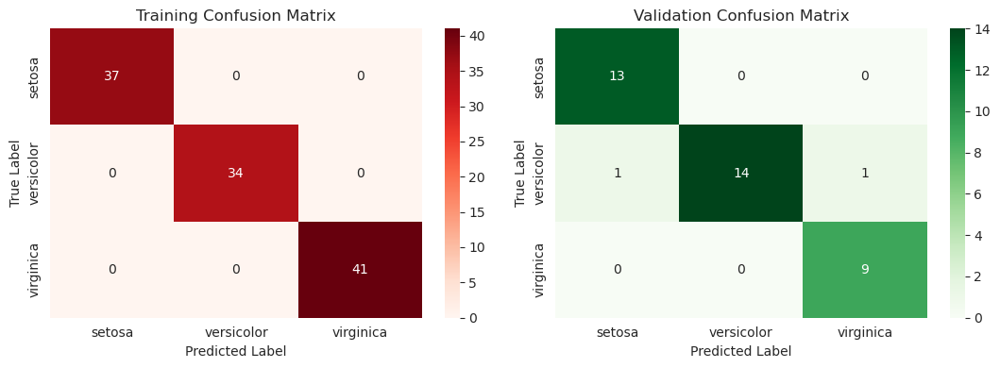






***************************************************************************
xgbc_raw , 	CV: True 

***************************************************************************
We will evaluate xgbc_raw with cross-validation.

 -> Creating instance of `RepeatedStratifiedKFold`
......Done!
 -> Creating the CV search
......Done!
 -> Fitting the model


/home/mbuenabad/anaconda3/lib/python3.11/site-packages/xgboost/core.py:377: FutureWarning: Your system has an old version of glibc (< 2.28). We will stop supporting Linux distros with glibc older than 2.28 after **May 31, 2025**. Please upgrade to a recent Linux distro (with glibc >= 2.28) to use future versions of XGBoost.
Note: You have installed the 'manylinux2014' variant of XGBoost. Certain features such as GPU algorithms or federated learning are not available. To use these features, please upgrade to a recent Linux distro with glibc 2.28+, and install the 'manylinux_2_28' variant.
  warnings.warn(
/home/mbuenabad/anaconda3/lib/python3.11/site-packages/xgboost/core.py:377: FutureWarning: Your system has an old version of glibc (< 2.28). We will stop supporting Linux distros with glibc older than 2.28 after **May 31, 2025**. Please upgrade to a recent Linux distro (with glibc >= 2.28) to use future versions of XGBoost.
Note: You have installed the 'manylinux2014' variant of XGBoos

......Done!
 -> CV Results:
		best f1_macro: 0.9547943051864622
		best params: {'model__learning_rate': 0.03, 'model__n_estimators': 100}
......Done!
 -> Making predictions
......Done!
 -> Creating Classification Reports
......Done!


Classification Report: Training
..................................................
|              |   precision |   recall |   f1-score |    support |
|:-------------|------------:|---------:|-----------:|-----------:|
| 0            |    1        | 1        |   1        |  37        |
| 1            |    1        | 0.941176 |   0.969697 |  34        |
| 2            |    0.953488 | 1        |   0.97619  |  41        |
| accuracy     |    0.982143 | 0.982143 |   0.982143 |   0.982143 |
| macro avg    |    0.984496 | 0.980392 |   0.981962 | 112        |
| weighted avg |    0.982973 | 0.982143 |   0.982085 | 112        |


Classification Report: Validation
..................................................
|              |   precision |   recall |   f1-scor

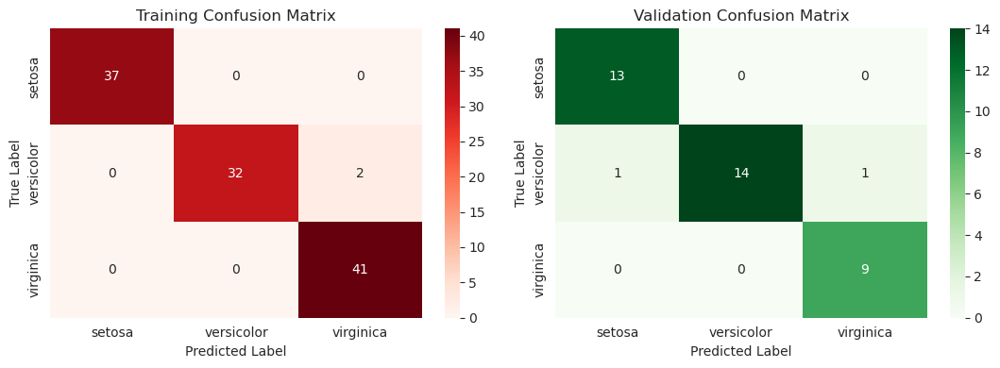



****************************************************************************************************
Performing Permutation Importance:
..................................................
The most important features are:

	petal_length: 0.5052631578947367 +- 0.05102820902543507
	petal_width: 0.09999999999999995 +- 0.030689220499185807
	sepal_length: 0.0 +- 0.0
	sepal_width: 0.0 +- 0.0

****************************************************************************************************



/home/mbuenabad/anaconda3/lib/python3.11/site-packages/xgboost/plotting.py:267: FutureWarning: The `num_trees` parameter is deprecated, use `tree_idx` insetad. 
  warnings.warn(


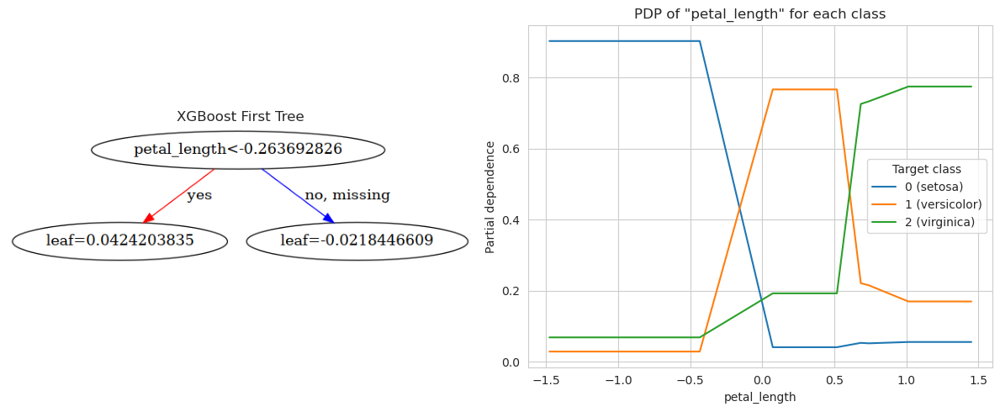

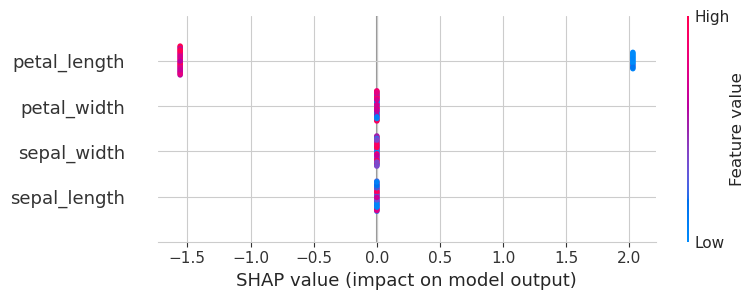

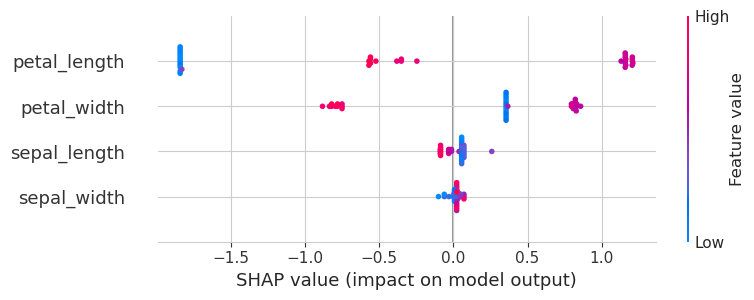

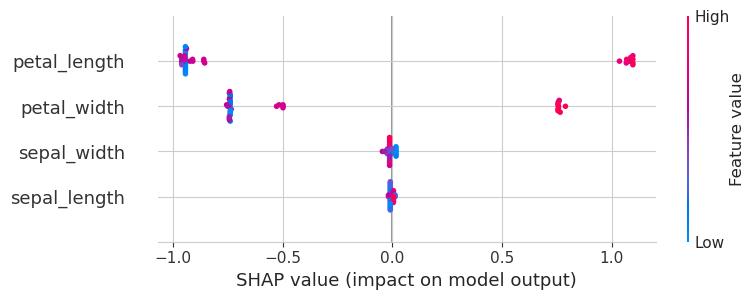




***************************************************************************
xgbc_eng , 	CV: False 

***************************************************************************
::::::::::::::::::::::::::::::::::::::::::::::::::::::::::::::::::::::
We will evaluate model=xgbc_eng with standard validation.
::::::::::::::::::::::::::::::::::::::::::::::::::::::::::::::::::::::

 -> Fitting the model
......Done!
 -> Making predictions
......Done!
 -> Creating Classification Reports
......Done!


Classification Report: Training
..................................................
|              |   precision |   recall |   f1-score |   support |
|:-------------|------------:|---------:|-----------:|----------:|
| 0            |           1 |        1 |          1 |        37 |
| 1            |           1 |        1 |          1 |        34 |
| 2            |           1 |        1 |          1 |        41 |
| accuracy     |           1 |        1 |          1 |         1 |
| macro avg    |

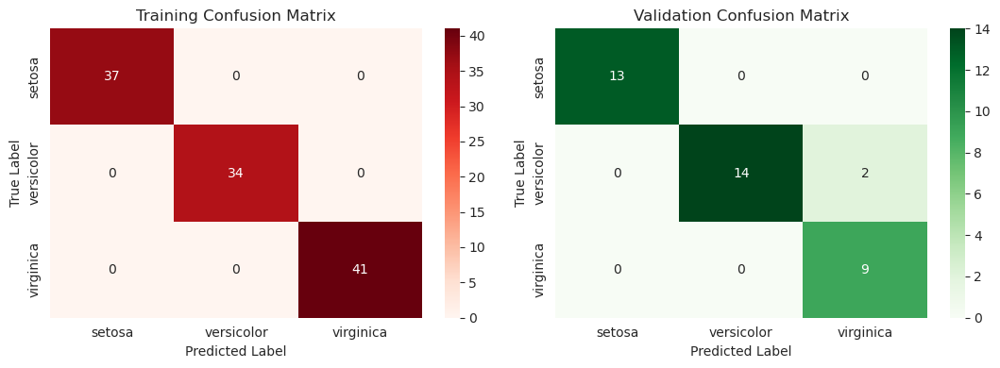






***************************************************************************
xgbc_eng , 	CV: True 

***************************************************************************
We will evaluate xgbc_eng with cross-validation.

 -> Creating instance of `RepeatedStratifiedKFold`
......Done!
 -> Creating the CV search
......Done!
 -> Fitting the model
......Done!
 -> CV Results:
		best f1_macro: 0.948954407974016
		best params: {'model__learning_rate': 0.25, 'model__n_estimators': 1600, 'preprocessor__selector__corr_threshold': 0.9, 'preprocessor__selector__n_features': 4}
......Done!
 -> Making predictions
......Done!
 -> Creating Classification Reports
......Done!


Classification Report: Training
..................................................
|              |   precision |   recall |   f1-score |   support |
|:-------------|------------:|---------:|-----------:|----------:|
| 0            |           1 |        1 |          1 |        37 |
| 1            |           1 |        1

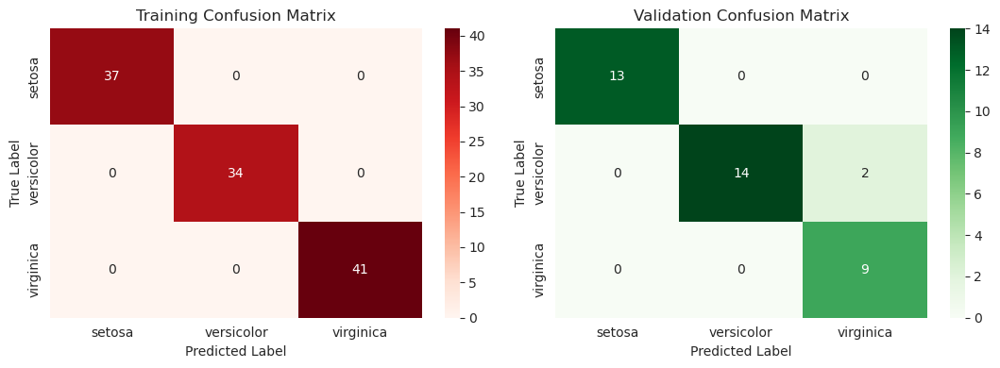



****************************************************************************************************
Performing Permutation Importance:
..................................................
The most important features are:

	petal_area: 0.5842105263157894 +- 0.07330730672202168
	sepal_elongation: 0.0 +- 0.0
	petal_elongation: -0.0052631578947368585 +- 0.010526315789473717
	sepal_length: -0.021052631578947434 +- 0.010526315789473717

****************************************************************************************************



/home/mbuenabad/anaconda3/lib/python3.11/site-packages/xgboost/plotting.py:267: FutureWarning: The `num_trees` parameter is deprecated, use `tree_idx` insetad. 
  warnings.warn(


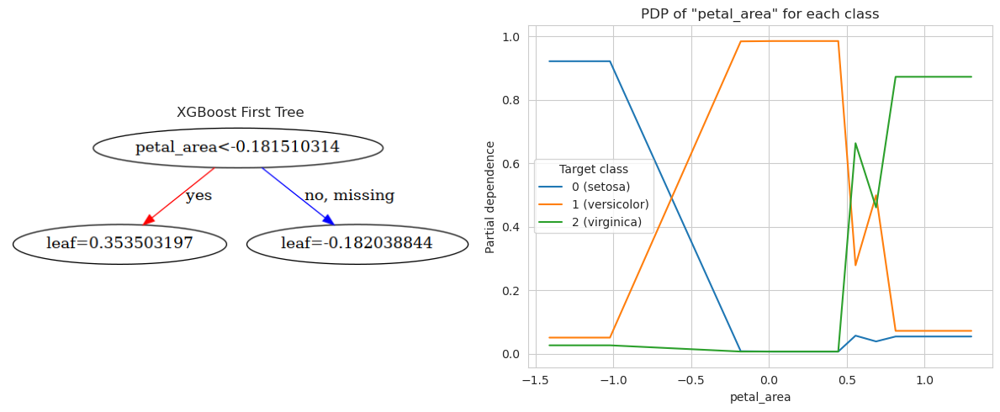

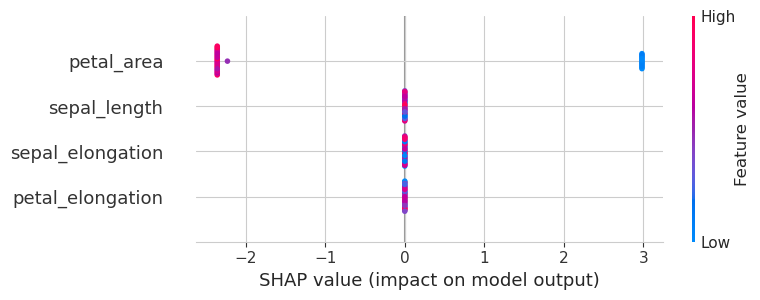

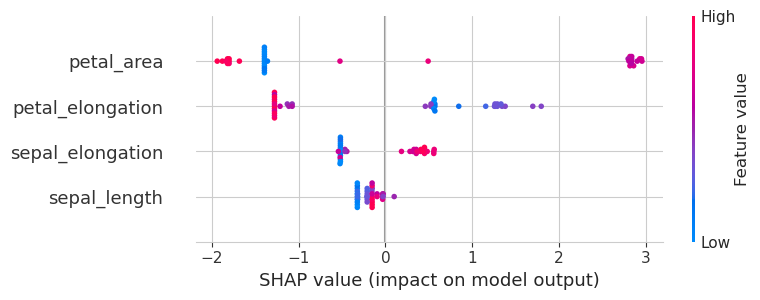

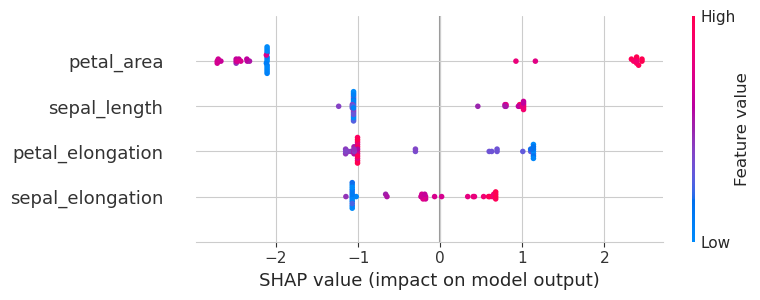

In [166]:
for pp in ['raw', 'eng']:
    for cvQ in [False, True]:

        model_name = model+'_'+pp # full model name

        print("*"*75)
        print(model_name, ", \tCV:", cvQ, "\n")
        print("*"*75)
        
        model_evaluation(model_name, (X_train, X_val, y_train, y_val),
                         n_splits=5, n_repeats=3,
                         perform_cv_randomized=(cvQ, False),
                         verbose=True, plots=True)

        print("\n")

        if cvQ:
            explain_model(model_name, best_cv[model_name]['pipe'], (X_train, X_val, y_train, y_val), tree_idx=0, random_state=0)

        print("\n\n")

In [167]:
scorecard

,dtc_raw_no_cv,dtc_raw_cv,dtc_eng_no_cv,dtc_eng_cv,rfc_raw_no_cv,rfc_raw_cv,rfc_eng_no_cv,rfc_eng_cv,xgbc_raw_no_cv,xgbc_raw_cv,xgbc_eng_no_cv,xgbc_eng_cv
Precision Train,1.000000,0.984496,1.000000,0.984496,1.000000,1.000000,1.000000,0.984496,1.000000,0.984496,1.000000,1.000000
Precision Validation,0.966667,0.966667,0.939394,0.939394,0.966667,0.966667,0.939394,0.939394,0.942857,0.942857,0.939394,0.939394
Recall Train,1.000000,0.980392,1.000000,0.980392,1.000000,1.000000,1.000000,0.980392,1.000000,0.980392,1.000000,1.000000
Recall Validation,0.979167,0.979167,0.958333,0.958333,0.979167,0.979167,0.958333,0.958333,0.958333,0.958333,0.958333,0.958333
Accuracy Train,1.000000,0.982143,1.000000,0.982143,1.000000,1.000000,1.000000,0.982143,1.000000,0.982143,1.000000,1.000000
Accuracy Validation,0.973684,0.973684,0.947368,0.947368,0.973684,0.973684,0.947368,0.947368,0.947368,0.947368,0.947368,0.947368
F1 Train,1.000000,0.981962,1.000000,0.981962,1.000000,1.000000,1.000000,0.981962,1.000000,0.981962,1.000000,1.000000
F1 Validation,0.971703,0.971703,0.944444,0.944444,0.971703,0.971703,0.944444,0.944444,0.947888,0.947888,0.944444,0.944444


### Model 4: `LogisticRegression`

In [269]:
model = 'logreg'

for pp in ['raw', 'eng']:

    model_name = model+'_'+pp # full model name

    preproc_pipe = final_preproc[pp] # preprocessing  pipeline

    pipe[model_name] = Pipeline(steps=[('preprocessor', preproc_pipe),
                                       ('model', LogisticRegression(fit_intercept=True, max_iter=10000))])

    # defining the hyperparameter grid
    if pp == 'raw':
        param_grid[model_name] = {'model__C': [0.5*i for i in range(1,21)],
                                  'model__solver': ['lbfgs', 'saga'],
                                  'model__penalty': ['l2', 'l1']}
    else:
        param_grid[model_name] = {'model__C': [0.5*i for i in range(1,21)],
                                  'model__solver': ['lbfgs', 'saga'],
                                  'model__penalty': ['l2', 'l1'],
                                  'preprocessor__selector__n_features': [None, len(X.columns)],
                                  'preprocessor__selector__corr_threshold': [0.5, 0.7, 0.9]}

***************************************************************************
logreg_raw , 	CV: False 

***************************************************************************
::::::::::::::::::::::::::::::::::::::::::::::::::::::::::::::::::::::
We will evaluate model=logreg_raw with standard validation.
::::::::::::::::::::::::::::::::::::::::::::::::::::::::::::::::::::::

 -> Fitting the model
......Done!
 -> Making predictions
......Done!
 -> Creating Classification Reports
......Done!


Classification Report: Training
..................................................
|              |   precision |   recall |   f1-score |    support |
|:-------------|------------:|---------:|-----------:|-----------:|
| 0            |    1        | 1        |   1        |  37        |
| 1            |    1        | 0.941176 |   0.969697 |  34        |
| 2            |    0.953488 | 1        |   0.97619  |  41        |
| accuracy     |    0.982143 | 0.982143 |   0.982143 |   0.982143 |
| macro a

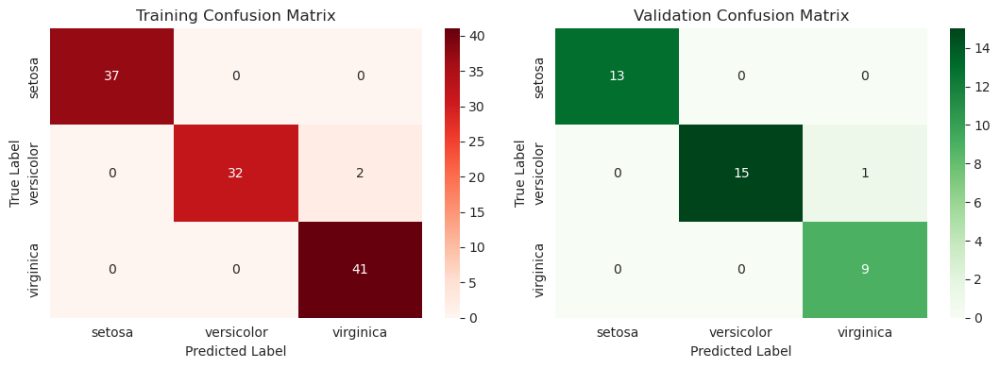






***************************************************************************
logreg_raw , 	CV: True 

***************************************************************************
We will evaluate logreg_raw with cross-validation.

 -> Creating instance of `RepeatedStratifiedKFold`
......Done!
 -> Creating the CV search
......Done!

 -> Fitting the model


/home/mbuenabad/anaconda3/lib/python3.11/site-packages/sklearn/model_selection/_validation.py:528: FitFailedWarning: 
300 fits failed out of a total of 1200.
The score on these train-test partitions for these parameters will be set to nan.
If these failures are not expected, you can try to debug them by setting error_score='raise'.

Below are more details about the failures:
--------------------------------------------------------------------------------
300 fits failed with the following error:
Traceback (most recent call last):
  File "/home/mbuenabad/anaconda3/lib/python3.11/site-packages/sklearn/model_selection/_validation.py", line 866, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/home/mbuenabad/anaconda3/lib/python3.11/site-packages/sklearn/base.py", line 1389, in wrapper
    return fit_method(estimator, *args, **kwargs)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/home/mbuenabad/anaconda3/lib/python3.11/site-packages/sklearn/pipeline

......Done!
 -> CV Results:
		best f1_macro: 0.9578097524537154
		best params: {'model__C': 1.5, 'model__penalty': 'l2', 'model__solver': 'lbfgs'}
......Done!
 -> Making predictions
......Done!
 -> Creating Classification Reports
......Done!


Classification Report: Training
..................................................
|              |   precision |   recall |   f1-score |    support |
|:-------------|------------:|---------:|-----------:|-----------:|
| 0            |    1        | 1        |   1        |  37        |
| 1            |    1        | 0.941176 |   0.969697 |  34        |
| 2            |    0.953488 | 1        |   0.97619  |  41        |
| accuracy     |    0.982143 | 0.982143 |   0.982143 |   0.982143 |
| macro avg    |    0.984496 | 0.980392 |   0.981962 | 112        |
| weighted avg |    0.982973 | 0.982143 |   0.982085 | 112        |


Classification Report: Validation
..................................................
|              |   precision |   recall | 

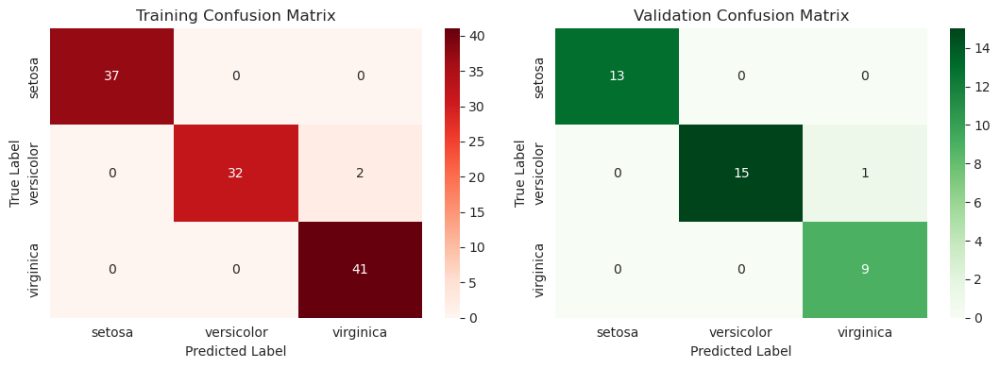



****************************************************************************************************
Performing Permutation Importance:
..................................................
The model's features are:

['petal_width', 'petal_length', 'sepal_width', 'sepal_length']
The most important features are:

	petal_width: 0.2 +- 0.02683694480838308
	petal_length: 0.19473684210526318 +- 0.031578947368421054
	sepal_width: 0.07894736842105265 +- 0.03328713326493027
	sepal_length: 0.047368421052631615 +- 0.03491183989847788

****************************************************************************************************



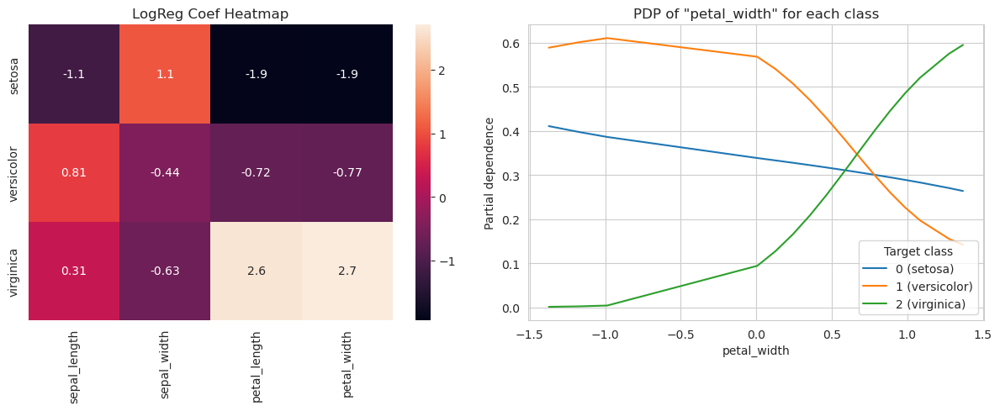

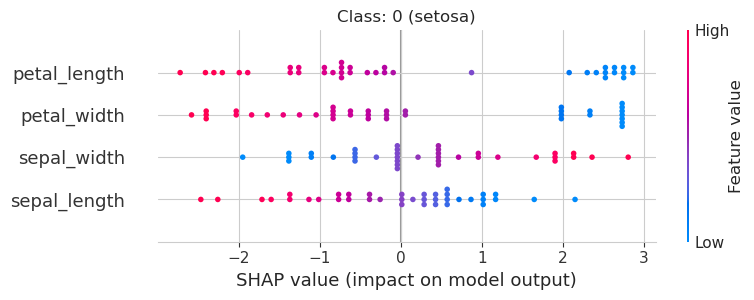

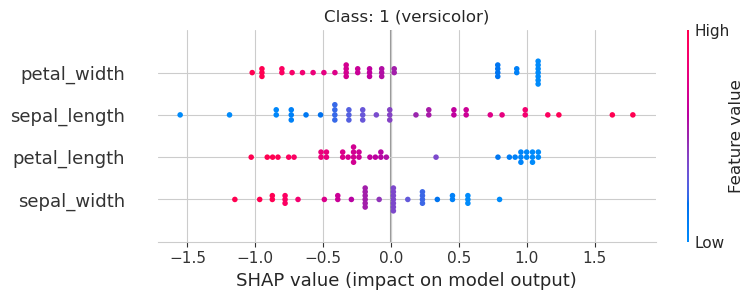

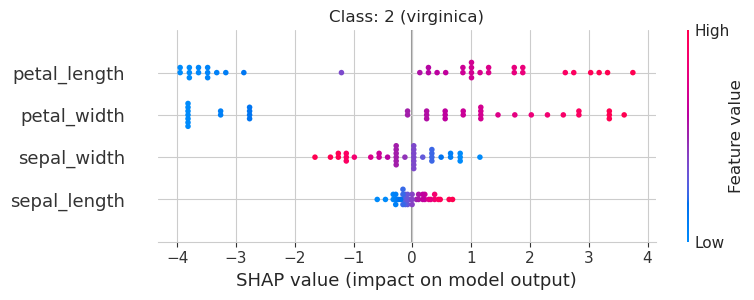




***************************************************************************
logreg_eng , 	CV: False 

***************************************************************************
::::::::::::::::::::::::::::::::::::::::::::::::::::::::::::::::::::::
We will evaluate model=logreg_eng with standard validation.
::::::::::::::::::::::::::::::::::::::::::::::::::::::::::::::::::::::

 -> Fitting the model
......Done!
 -> Making predictions
......Done!
 -> Creating Classification Reports
......Done!


Classification Report: Training
..................................................
|              |   precision |   recall |   f1-score |    support |
|:-------------|------------:|---------:|-----------:|-----------:|
| 0            |    1        | 1        |   1        |  37        |
| 1            |    0.914286 | 0.941176 |   0.927536 |  34        |
| 2            |    0.95     | 0.926829 |   0.938272 |  41        |
| accuracy     |    0.955357 | 0.955357 |   0.955357 |   0.955357 |
| macr

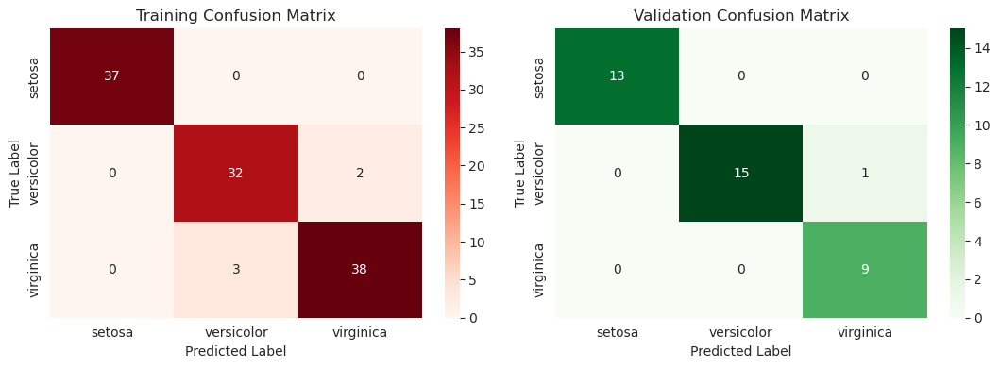






***************************************************************************
logreg_eng , 	CV: True 

***************************************************************************
We will evaluate logreg_eng with cross-validation.

 -> Creating instance of `RepeatedStratifiedKFold`
......Done!
 -> Creating the CV search
......Done!

 -> Fitting the model


/home/mbuenabad/anaconda3/lib/python3.11/site-packages/sklearn/model_selection/_validation.py:528: FitFailedWarning: 
1800 fits failed out of a total of 7200.
The score on these train-test partitions for these parameters will be set to nan.
If these failures are not expected, you can try to debug them by setting error_score='raise'.

Below are more details about the failures:
--------------------------------------------------------------------------------
1800 fits failed with the following error:
Traceback (most recent call last):
  File "/home/mbuenabad/anaconda3/lib/python3.11/site-packages/sklearn/model_selection/_validation.py", line 866, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/home/mbuenabad/anaconda3/lib/python3.11/site-packages/sklearn/base.py", line 1389, in wrapper
    return fit_method(estimator, *args, **kwargs)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/home/mbuenabad/anaconda3/lib/python3.11/site-packages/sklearn/pipeli

......Done!
 -> CV Results:
		best f1_macro: 0.942775197321121
		best params: {'model__C': 2.5, 'model__penalty': 'l1', 'model__solver': 'saga', 'preprocessor__selector__corr_threshold': 0.7, 'preprocessor__selector__n_features': None}
......Done!
 -> Making predictions
......Done!
 -> Creating Classification Reports
......Done!


Classification Report: Training
..................................................
|              |   precision |   recall |   f1-score |    support |
|:-------------|------------:|---------:|-----------:|-----------:|
| 0            |    1        | 1        |   1        |  37        |
| 1            |    0.969697 | 0.941176 |   0.955224 |  34        |
| 2            |    0.952381 | 0.97561  |   0.963855 |  41        |
| accuracy     |    0.973214 | 0.973214 |   0.973214 |   0.973214 |
| macro avg    |    0.974026 | 0.972262 |   0.973026 | 112        |
| weighted avg |    0.973369 | 0.973214 |   0.973176 | 112        |


Classification Report: Validation
....

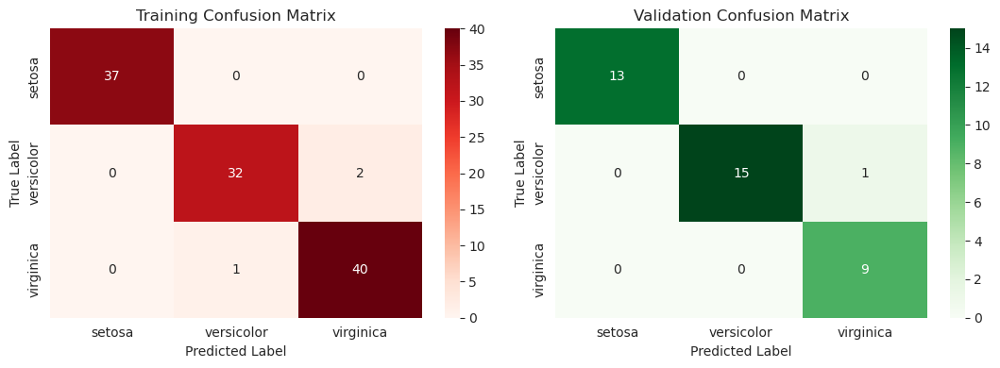



****************************************************************************************************
Performing Permutation Importance:
..................................................
The model's features are:

['petal_area', 'sepal_width', 'sepal_area']
The most important features are:

	petal_area: 0.6263157894736843 +- 0.07699336230698839
	sepal_width: -0.005263157894736836 +- 0.010526315789473672
	sepal_area: -0.005263157894736836 +- 0.010526315789473672

****************************************************************************************************



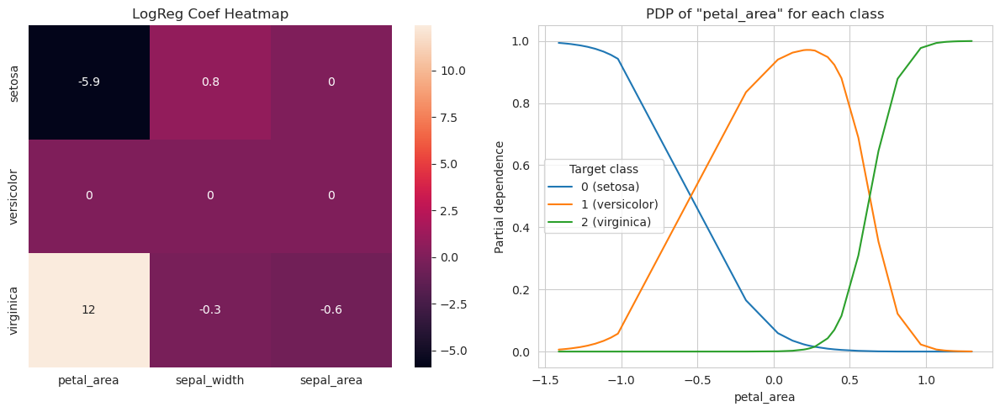

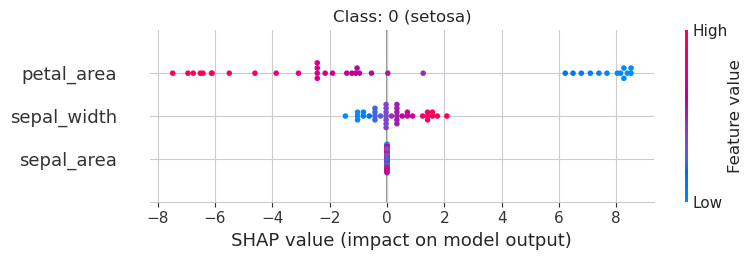

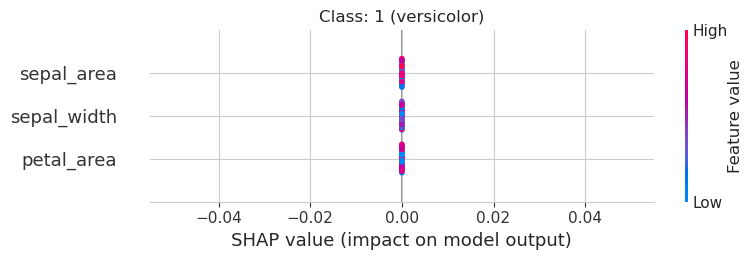

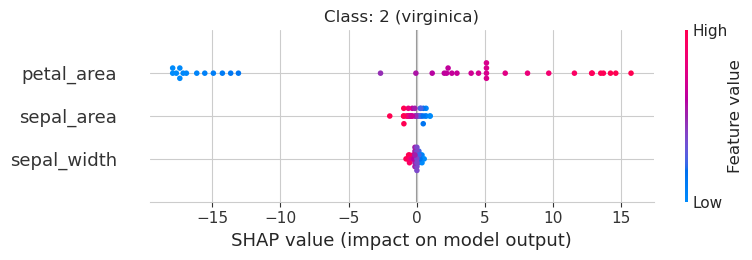

In [270]:
for pp in ['raw', 'eng']:
    for cvQ in [False, True]:

        model_name = model+'_'+pp # full model name

        print("*"*75)
        print(model_name, ", \tCV:", cvQ, "\n")
        print("*"*75)
        
        model_evaluation(model_name, (X_train, X_val, y_train, y_val),
                         n_splits=5, n_repeats=3,
                         perform_cv_randomized=(cvQ, False),
                         verbose=True, plots=True)

        print("\n")

        if cvQ:
            explain_model(model_name, best_cv[model_name]['pipe'], (X_train, X_val, y_train, y_val), tree_idx=0, random_state=0)

        print("\n\n")

In [212]:
scorecard

,dtc_raw_no_cv,dtc_raw_cv,dtc_eng_no_cv,dtc_eng_cv,rfc_raw_no_cv,rfc_raw_cv,rfc_eng_no_cv,rfc_eng_cv,xgbc_raw_no_cv,xgbc_raw_cv,xgbc_eng_no_cv,xgbc_eng_cv,logreg_raw_no_cv,logreg_raw_cv,logreg_eng_no_cv,logreg_eng_cv
Precision Train,1.000000,0.984496,1.000000,0.984496,1.000000,1.000000,1.000000,0.984496,1.000000,0.984496,1.000000,1.000000,0.984496,0.984496,0.954762,0.974026
Precision Validation,0.966667,0.966667,0.939394,0.939394,0.966667,0.966667,0.939394,0.939394,0.942857,0.942857,0.939394,0.939394,0.966667,0.966667,0.966667,0.966667
Recall Train,1.000000,0.980392,1.000000,0.980392,1.000000,1.000000,1.000000,0.980392,1.000000,0.980392,1.000000,1.000000,0.980392,0.980392,0.956002,0.972262
Recall Validation,0.979167,0.979167,0.958333,0.958333,0.979167,0.979167,0.958333,0.958333,0.958333,0.958333,0.958333,0.958333,0.979167,0.979167,0.979167,0.979167
Accuracy Train,1.000000,0.982143,1.000000,0.982143,1.000000,1.000000,1.000000,0.982143,1.000000,0.982143,1.000000,1.000000,0.982143,0.982143,0.955357,0.973214
Accuracy Validation,0.973684,0.973684,0.947368,0.947368,0.973684,0.973684,0.947368,0.947368,0.947368,0.947368,0.947368,0.947368,0.973684,0.973684,0.973684,0.973684
F1 Train,1.000000,0.981962,1.000000,0.981962,1.000000,1.000000,1.000000,0.981962,1.000000,0.981962,1.000000,1.000000,0.981962,0.981962,0.955269,0.973026
F1 Validation,0.971703,0.971703,0.944444,0.944444,0.971703,0.971703,0.944444,0.944444,0.947888,0.947888,0.944444,0.944444,0.971703,0.971703,0.971703,0.971703


### Model 5: `SVC`

In [265]:
model = 'svc'

for pp in ['raw', 'eng']:

    model_name = model+'_'+pp # full model name

    preproc_pipe = final_preproc[pp] # preprocessing  pipeline

    pipe[model_name] = Pipeline(steps=[('preprocessor', preproc_pipe),
                                       ('model', SVC(random_state=0, probability=True))])

    # defining the hyperparameter grid
    if pp == 'raw':
        param_grid[model_name] = {'model__C': [0.5*i for i in range(1,21)],
                                  'model__kernel': ['rbf', 'linear'],
                                  'model__gamma': ['scale', 'auto']}
    else:
        param_grid[model_name] = {'model__C': [0.5*i for i in range(1,21)],
                                  'model__kernel': ['rbf', 'linear'],
                                  'model__gamma': ['scale', 'auto'],
                                  'preprocessor__selector__n_features': [None, len(X.columns)],
                                  'preprocessor__selector__corr_threshold': [0.5, 0.7, 0.9]}

***************************************************************************
svc_raw , 	CV: False 

***************************************************************************
::::::::::::::::::::::::::::::::::::::::::::::::::::::::::::::::::::::
We will evaluate model=svc_raw with standard validation.
::::::::::::::::::::::::::::::::::::::::::::::::::::::::::::::::::::::

 -> Model is already fitted!
 -> Making predictions
......Done!
 -> Creating Classification Reports
......Done!


Classification Report: Training
..................................................
|              |   precision |   recall |   f1-score |    support |
|:-------------|------------:|---------:|-----------:|-----------:|
| 0            |    1        | 1        |   1        |  37        |
| 1            |    0.969697 | 0.941176 |   0.955224 |  34        |
| 2            |    0.952381 | 0.97561  |   0.963855 |  41        |
| accuracy     |    0.973214 | 0.973214 |   0.973214 |   0.973214 |
| macro avg    |    

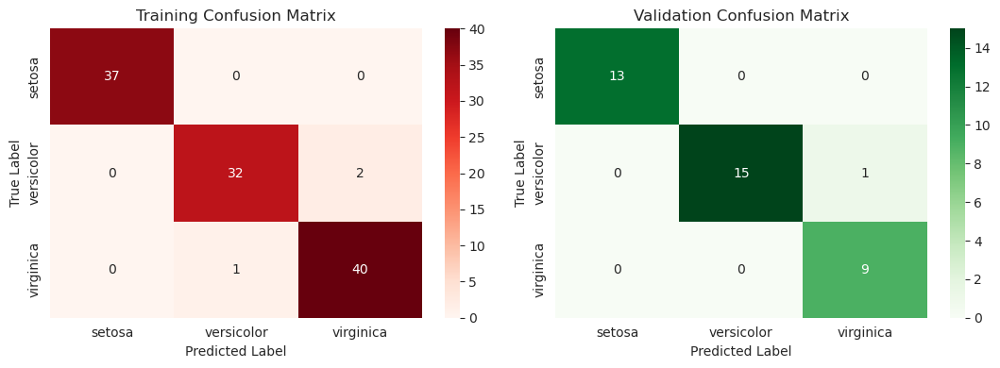






***************************************************************************
svc_raw , 	CV: True 

***************************************************************************
We will evaluate svc_raw with cross-validation.

 -> Creating instance of `RepeatedStratifiedKFold`
......Done!
 -> Creating the CV search
......Done!

 -> Fitting the model
......Done!
 -> CV Results:
		best f1_macro: 0.9636224764036943
		best params: {'model__C': 0.5, 'model__gamma': 'scale', 'model__kernel': 'linear'}
......Done!
 -> Making predictions
......Done!
 -> Creating Classification Reports
......Done!


Classification Report: Training
..................................................
|              |   precision |   recall |   f1-score |    support |
|:-------------|------------:|---------:|-----------:|-----------:|
| 0            |    1        | 1        |   1        |  37        |
| 1            |    1        | 0.941176 |   0.969697 |  34        |
| 2            |    0.953488 | 1        |   0.

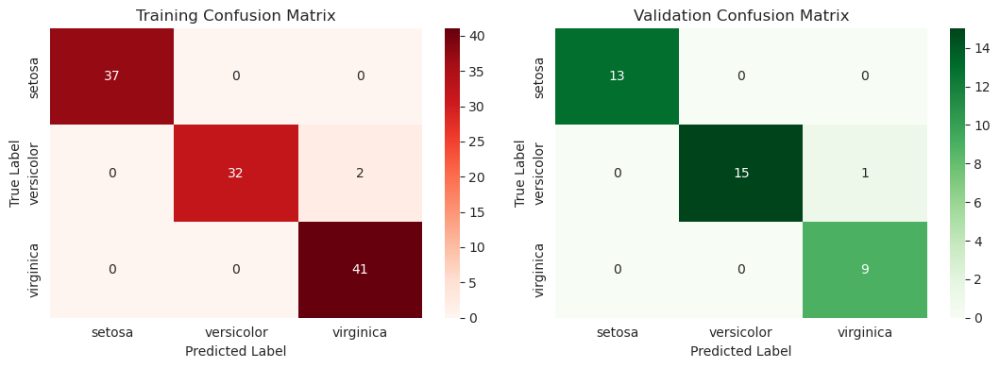



****************************************************************************************************
Performing Permutation Importance:
..................................................
The model's features are:

['petal_length', 'petal_width', 'sepal_width', 'sepal_length']
The most important features are:

	petal_length: 0.26315789473684215 +- 0.03328713326493027
	petal_width: 0.24210526315789477 +- 0.03491183989847789
	sepal_width: 0.005263157894736881 +- 0.019692933614599718
	sepal_length: 0.0 +- 0.0

****************************************************************************************************



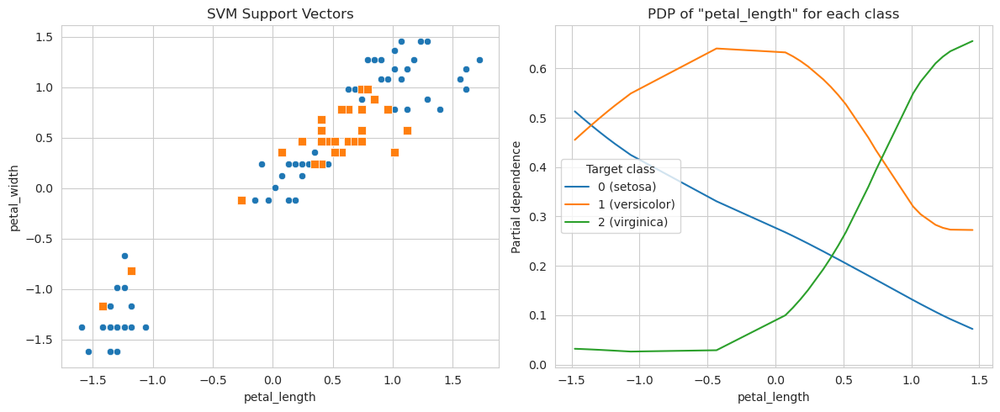

  0%|          | 0/38 [00:00<?, ?it/s]

num_full_subsets = 2
np.sum(w_aug) = 3.999999999999999
np.sum(self.kernelWeights) = 0.9999999999999998
phi = array([0.11540538, 0.99874009, 1.97280558, 1.690265  ])
np.sum(w_aug) = 3.999999999999999
np.sum(self.kernelWeights) = 0.9999999999999998
phi = array([-0.19252273, -1.11570547, -1.33078912, -0.98086157])
np.sum(w_aug) = 3.999999999999999
np.sum(self.kernelWeights) = 0.9999999999999998
phi = array([ 0.09630848, -0.14238743, -2.2252359 , -2.4766527 ])
num_full_subsets = 2
np.sum(w_aug) = 3.999999999999999
np.sum(self.kernelWeights) = 0.9999999999999998
phi = array([ 0.16166404, -0.80885577, -0.4235791 , -0.67253084])
np.sum(w_aug) = 3.999999999999999
np.sum(self.kernelWeights) = 0.9999999999999998
phi = array([-0.38657899,  0.72253564,  1.59431018,  1.22601679])
np.sum(w_aug) = 3.999999999999999
np.sum(self.kernelWeights) = 0.9999999999999998
phi = array([ 0.50405689, -0.23344846, -2.44082749, -1.08149729])
num_full_subsets = 2
np.sum(w_aug) = 3.999999999999999
np.sum(self.kernelW

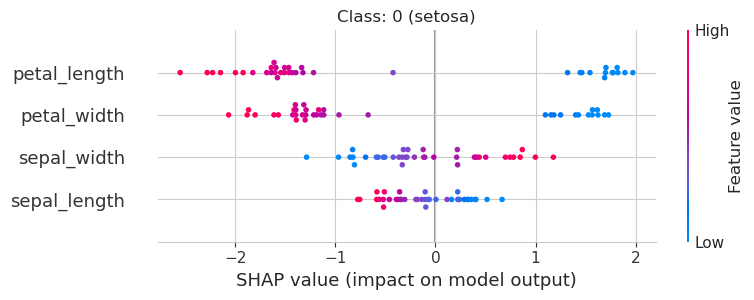

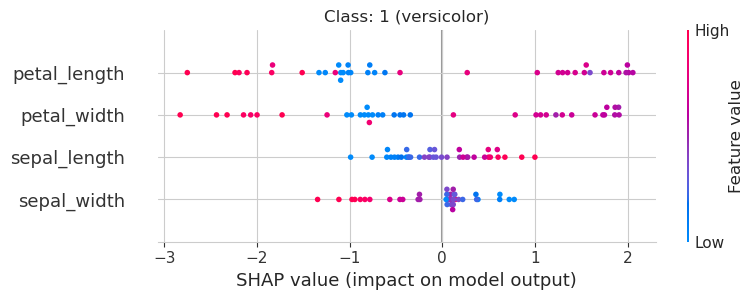

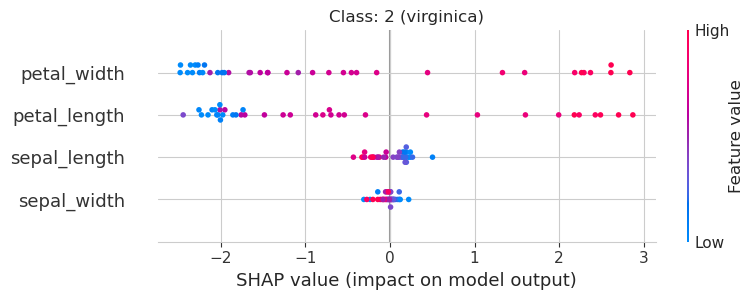




***************************************************************************
svc_eng , 	CV: False 

***************************************************************************
::::::::::::::::::::::::::::::::::::::::::::::::::::::::::::::::::::::
We will evaluate model=svc_eng with standard validation.
::::::::::::::::::::::::::::::::::::::::::::::::::::::::::::::::::::::

 -> Model is already fitted!
 -> Making predictions
......Done!
 -> Creating Classification Reports
......Done!


Classification Report: Training
..................................................
|              |   precision |   recall |   f1-score |    support |
|:-------------|------------:|---------:|-----------:|-----------:|
| 0            |    1        | 1        |   1        |  37        |
| 1            |    0.916667 | 0.970588 |   0.942857 |  34        |
| 2            |    0.974359 | 0.926829 |   0.95     |  41        |
| accuracy     |    0.964286 | 0.964286 |   0.964286 |   0.964286 |
| macro avg    | 

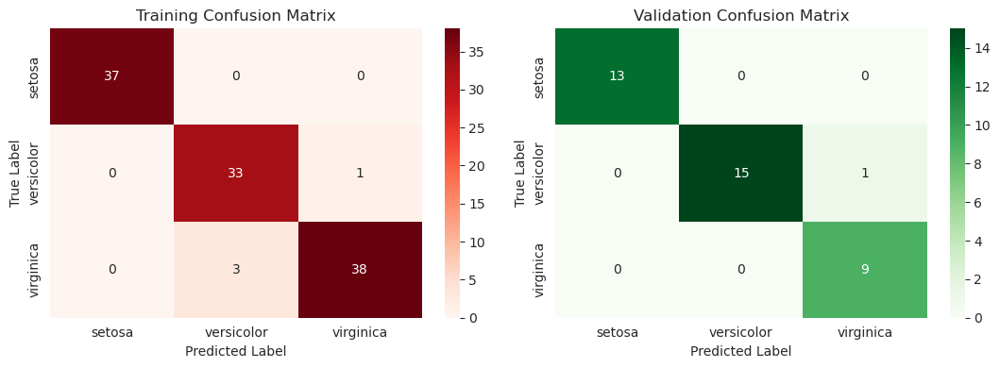






***************************************************************************
svc_eng , 	CV: True 

***************************************************************************
We will evaluate svc_eng with cross-validation.

 -> Creating instance of `RepeatedStratifiedKFold`
......Done!
 -> Creating the CV search
......Done!

 -> Fitting the model
......Done!
 -> CV Results:
		best f1_macro: 0.9518167911666365
		best params: {'model__C': 1.5, 'model__gamma': 'scale', 'model__kernel': 'rbf', 'preprocessor__selector__corr_threshold': 0.5, 'preprocessor__selector__n_features': None}
......Done!
 -> Making predictions
......Done!
 -> Creating Classification Reports
......Done!


Classification Report: Training
..................................................
|              |   precision |   recall |   f1-score |    support |
|:-------------|------------:|---------:|-----------:|-----------:|
| 0            |    1        | 1        |   1        |  37        |
| 1            |    0.9696

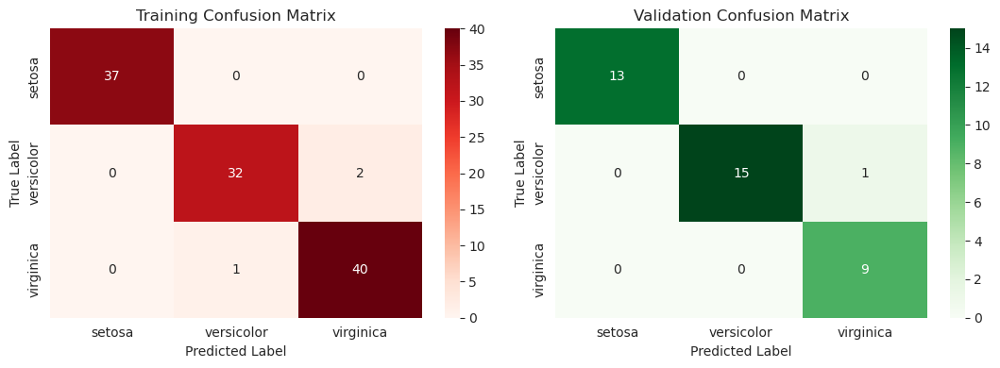



****************************************************************************************************
Performing Permutation Importance:
..................................................
The model's features are:

['petal_area', 'sepal_width']
The most important features are:

	petal_area: 0.5894736842105264 +- 0.05418752705782629
	sepal_width: 0.03157894736842111 +- 0.019692933614599707

****************************************************************************************************



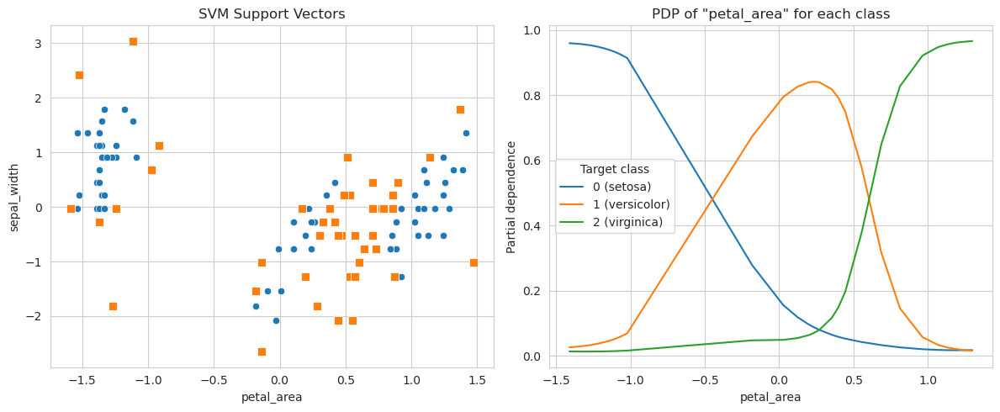

  0%|          | 0/38 [00:00<?, ?it/s]

num_full_subsets = 1
np.sum(w_aug) = 2.0
np.sum(self.kernelWeights) = 1.0
phi = array([3.41284255, 0.08010091])
np.sum(w_aug) = 2.0
np.sum(self.kernelWeights) = 1.0
phi = array([-1.98879637, -0.36414438])
np.sum(w_aug) = 2.0
np.sum(self.kernelWeights) = 1.0
phi = array([-3.70179692,  0.27469164])
num_full_subsets = 1
np.sum(w_aug) = 2.0
np.sum(self.kernelWeights) = 1.0
phi = array([-1.60760343, -1.10052716])
np.sum(w_aug) = 2.0
np.sum(self.kernelWeights) = 1.0
phi = array([3.13344238, 1.02361876])
np.sum(w_aug) = 2.0
np.sum(self.kernelWeights) = 1.0
phi = array([-3.37358346, -0.59359147])
num_full_subsets = 1
np.sum(w_aug) = 2.0
np.sum(self.kernelWeights) = 1.0
phi = array([-2.99077611, -0.45332681])
np.sum(w_aug) = 2.0
np.sum(self.kernelWeights) = 1.0
phi = array([3.58113222, 0.45127629])
np.sum(w_aug) = 2.0
np.sum(self.kernelWeights) = 1.0
phi = array([-2.39428158, -0.40976037])
num_full_subsets = 1
np.sum(w_aug) = 2.0
np.sum(self.kernelWeights) = 1.0
phi = array([3.31670986, 0.29543

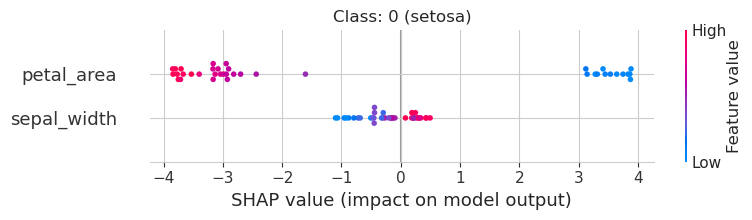

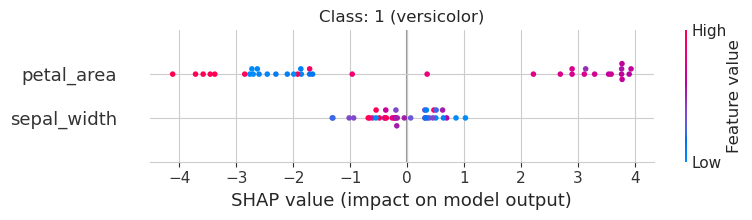

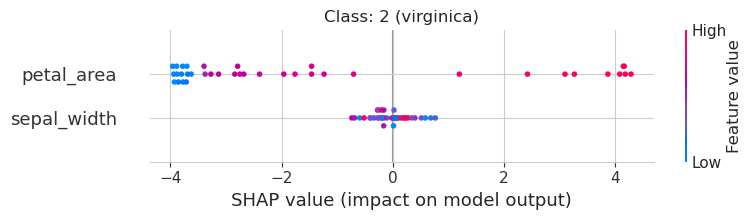

In [268]:
for pp in ['raw', 'eng']:
    for cvQ in [False, True]:

        model_name = model+'_'+pp # full model name

        print("*"*75)
        print(model_name, ", \tCV:", cvQ, "\n")
        print("*"*75)
        
        model_evaluation(model_name, (X_train, X_val, y_train, y_val),
                         n_splits=5, n_repeats=3,
                         perform_cv_randomized=(cvQ, False),
                         verbose=True, plots=True)

        print("\n")

        if cvQ:
            explain_model(model_name, best_cv[model_name]['pipe'], (X_train, X_val, y_train, y_val), tree_idx=0, random_state=0)

        print("\n\n")

In [263]:
scorecard

,dtc_raw_no_cv,dtc_raw_cv,dtc_eng_no_cv,dtc_eng_cv,rfc_raw_no_cv,rfc_raw_cv,rfc_eng_no_cv,rfc_eng_cv,xgbc_raw_no_cv,xgbc_raw_cv,xgbc_eng_no_cv,xgbc_eng_cv,logreg_raw_no_cv,logreg_raw_cv,logreg_eng_no_cv,logreg_eng_cv,svc_raw_no_cv,svc_raw_cv,svc_eng_no_cv,svc_eng_cv
Precision Train,1.000000,0.984496,1.000000,0.984496,1.000000,1.000000,1.000000,0.984496,1.000000,0.984496,1.000000,1.000000,0.984496,0.984496,0.954762,0.974026,0.974026,0.984496,0.963675,0.974026
Precision Validation,0.966667,0.966667,0.939394,0.939394,0.966667,0.966667,0.939394,0.939394,0.942857,0.942857,0.939394,0.939394,0.966667,0.966667,0.966667,0.966667,0.966667,0.966667,0.966667,0.966667
Recall Train,1.000000,0.980392,1.000000,0.980392,1.000000,1.000000,1.000000,0.980392,1.000000,0.980392,1.000000,1.000000,0.980392,0.980392,0.956002,0.972262,0.972262,0.980392,0.965806,0.972262
Recall Validation,0.979167,0.979167,0.958333,0.958333,0.979167,0.979167,0.958333,0.958333,0.958333,0.958333,0.958333,0.958333,0.979167,0.979167,0.979167,0.979167,0.979167,0.979167,0.979167,0.979167
Accuracy Train,1.000000,0.982143,1.000000,0.982143,1.000000,1.000000,1.000000,0.982143,1.000000,0.982143,1.000000,1.000000,0.982143,0.982143,0.955357,0.973214,0.973214,0.982143,0.964286,0.973214
Accuracy Validation,0.973684,0.973684,0.947368,0.947368,0.973684,0.973684,0.947368,0.947368,0.947368,0.947368,0.947368,0.947368,0.973684,0.973684,0.973684,0.973684,0.973684,0.973684,0.973684,0.973684
F1 Train,1.000000,0.981962,1.000000,0.981962,1.000000,1.000000,1.000000,0.981962,1.000000,0.981962,1.000000,1.000000,0.981962,0.981962,0.955269,0.973026,0.973026,0.981962,0.964286,0.973026
F1 Validation,0.971703,0.971703,0.944444,0.944444,0.971703,0.971703,0.944444,0.944444,0.947888,0.947888,0.944444,0.944444,0.971703,0.971703,0.971703,0.971703,0.971703,0.971703,0.971703,0.971703


In [366]:
model = 'svc'

Pipeline:

In [367]:
# ?SVC

In [368]:
# defining the pipeline
pipe[model] = Pipeline(steps=[('box-cox', boxcox_scaler),
                              ('z-scaler', z_scaler),
                              ('model', SVC(random_state=0))])

Hyperparameters to optimize:

In [369]:
# defining the hyperparameter grid
param_grid[model] = {
    'model__C': [0.5*i for i in range(1,21)],
    'model__kernel': ['rbf', 'linear', 'poly', 'sigmoid', 'precomputed'],
    'model__degree': [1, 2, 3, 4, 5],
    'model__gamma': ['scale', 'auto'],
    'model__probability': [False, True]
    }

Grid:

In [370]:
# putting everything together
grid[model] = GridSearchCV(pipe[model],
                    param_grid=param_grid[model],
                    scoring='f1_macro',
                    cv=5,
                    n_jobs=-1)# 

Fitting the grid-pipeline to the data:

In [371]:
grid[model].fit(X_train, y_train_label)

/home/mbuenabad/anaconda3/lib/python3.11/site-packages/sklearn/model_selection/_validation.py:528: FitFailedWarning: 
2000 fits failed out of a total of 10000.
The score on these train-test partitions for these parameters will be set to nan.
If these failures are not expected, you can try to debug them by setting error_score='raise'.

Below are more details about the failures:
--------------------------------------------------------------------------------
2000 fits failed with the following error:
Traceback (most recent call last):
  File "/home/mbuenabad/anaconda3/lib/python3.11/site-packages/sklearn/model_selection/_validation.py", line 866, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/home/mbuenabad/anaconda3/lib/python3.11/site-packages/sklearn/base.py", line 1389, in wrapper
    return fit_method(estimator, *args, **kwargs)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/home/mbuenabad/anaconda3/lib/python3.11/site-packages/sklearn/pipel

GridSearchCV(cv=5,
             estimator=Pipeline(steps=[('box-cox',
                                        PowerTransformer(method='box-cox')),
                                       ('z-scaler', StandardScaler()),
                                       ('model', SVC(random_state=0))]),
             n_jobs=-1,
             param_grid={'model__C': [0.5, 1.0, 1.5, 2.0, 2.5, 3.0, 3.5, 4.0,
                                      4.5, 5.0, 5.5, 6.0, 6.5, 7.0, 7.5, 8.0,
                                      8.5, 9.0, 9.5, 10.0],
                         'model__degree': [1, 2, 3, 4, 5],
                         'model__gamma': ['scale', 'auto'],
                         'model__kernel': ['rbf', 'linear', 'poly', 'sigmoid',
                                           'precomputed'],
                         'model__probability': [False, True]},
             scoring='f1_macro')

In [372]:
print(model, "results:\n","."*100)
for score, std, params in zip(grid[model].cv_results_['mean_test_score'], grid[model].cv_results_['std_test_score'], grid[model].cv_results_['params']):
    print(f"mean CV f1-macro score: {score:.4f} +- {std:.4e} -> {params}")

svc results:
 ....................................................................................................
mean CV f1-macro score: 0.9321 +- 4.4390e-02 -> {'model__C': 0.5, 'model__degree': 1, 'model__gamma': 'scale', 'model__kernel': 'rbf', 'model__probability': False}
mean CV f1-macro score: 0.9321 +- 4.4390e-02 -> {'model__C': 0.5, 'model__degree': 1, 'model__gamma': 'scale', 'model__kernel': 'rbf', 'model__probability': True}
mean CV f1-macro score: 0.9330 +- 4.3297e-02 -> {'model__C': 0.5, 'model__degree': 1, 'model__gamma': 'scale', 'model__kernel': 'linear', 'model__probability': False}
mean CV f1-macro score: 0.9330 +- 4.3297e-02 -> {'model__C': 0.5, 'model__degree': 1, 'model__gamma': 'scale', 'model__kernel': 'linear', 'model__probability': True}
mean CV f1-macro score: 0.9499 +- 3.1543e-02 -> {'model__C': 0.5, 'model__degree': 1, 'model__gamma': 'scale', 'model__kernel': 'poly', 'model__probability': False}
mean CV f1-macro score: 0.9499 +- 3.1543e-02 -> {'model__C':

Finding the best estimator and its properties:

In [373]:
best['pipe'][model] = grid[model].best_estimator_
best['model'][model] = best['pipe'][model].named_steps['model']
best['score'][model] = grid[model].best_score_
best['params'][model] = grid[model].best_params_

print("best f1-macro:", best['score'][model])
print("best params:", best['params'][model])

best f1-macro: 0.9503250521981172
best params: {'model__C': 2.0, 'model__degree': 1, 'model__gamma': 'scale', 'model__kernel': 'poly', 'model__probability': False}


Let us compute the F1 scores of the entire dataset in more detail:

In [374]:
y_preds = best['model'][model].predict(X_val_scaled) # compute predictions

for species, f1 in zip(classes, f1_score(y_val_label, y_preds, average=None)):
    print(species+" f1 score:\t", f1) # compute F1 for each class

print("*"*50)

for avg in ['micro', 'macro', 'weighted']:
    print(avg+":", f1_score(y_val_label, y_preds, average=avg)) # compute F1 for each different kind of average

val_score[model] = f1_score(y_val_label, y_preds, average='macro')

setosa f1 score:	 1.0
versicolor f1 score:	 0.9629629629629629
virginica f1 score:	 0.9090909090909091
**************************************************
micro: 0.9666666666666667
macro: 0.957351290684624
weighted: 0.9657687991021324


Let us consider now the permutation importance of the features used, to gain insight into what is being done by the tree:

In [375]:
print(permutation_importance(best['model'][model], X_val_scaled, y_val_label))
feat_import = dict(zip(X_val.columns, permutation_importance(best['model'][model], X_val_scaled, y_val_label, random_state=0)['importances_mean']))
feat_import

{'importances_mean': array([0.        , 0.00666667, 0.08666667, 0.07333333, 0.        ,
       0.        , 0.07333333, 0.02666667]), 'importances_std': array([0.        , 0.01333333, 0.01632993, 0.05333333, 0.        ,
       0.        , 0.05333333, 0.01333333]), 'importances': array([[0.        , 0.        , 0.        , 0.        , 0.        ],
       [0.        , 0.        , 0.        , 0.03333333, 0.        ],
       [0.1       , 0.06666667, 0.06666667, 0.1       , 0.1       ],
       [0.13333333, 0.13333333, 0.        , 0.06666667, 0.03333333],
       [0.        , 0.        , 0.        , 0.        , 0.        ],
       [0.        , 0.        , 0.        , 0.        , 0.        ],
       [0.13333333, 0.13333333, 0.        , 0.06666667, 0.03333333],
       [0.03333333, 0.03333333, 0.        , 0.03333333, 0.03333333]])}


{'sepal_length': 0.0,
 'sepal_width': 0.0,
 'petal_length': 0.08666666666666664,
 'petal_width': 0.06666666666666665,
 'sepal_area': 0.0,
 'sepal_elongation': 0.0,
 'petal_area': 0.06666666666666665,
 'petal_elongation': 0.02666666666666666}

So only three features are really being used:

In [376]:
{key:val for key, val in feat_import.items() if val > 0}

{'petal_length': 0.08666666666666664,
 'petal_width': 0.06666666666666665,
 'petal_area': 0.06666666666666665,
 'petal_elongation': 0.02666666666666666}

### Model 6: `KNeighborsClassifier`

In [271]:
model = 'knn'

for pp in ['raw', 'eng']:

    model_name = model+'_'+pp # full model name

    preproc_pipe = final_preproc[pp] # preprocessing  pipeline

    pipe[model_name] = Pipeline(steps=[('preprocessor', preproc_pipe),
                                       ('model', KNeighborsClassifier())])

    # defining the hyperparameter grid
    if pp == 'raw':
        param_grid[model_name] = {'model__n_neighbors': list(range(3, 11)),
                                  'model__weights': ['uniform', 'distance'],
                                  'model__algorithm': ['auto', 'ball_tree', 'kd_tree', 'brute'],
                                  'model__leaf_size': [5*i for i in range(1, 4)],
                                  'model__p': [1, 2]}
    else:
        param_grid[model_name] = {'model__n_neighbors': list(range(3, 11)),
                                  'model__weights': ['uniform', 'distance'],
                                  'model__algorithm': ['auto', 'ball_tree', 'kd_tree', 'brute'],
                                  'model__leaf_size': [5*i for i in range(1, 4)],
                                  'model__p': [1, 2],
                                  'preprocessor__selector__n_features': [None, len(X.columns)],
                                  'preprocessor__selector__corr_threshold': [0.5, 0.7, 0.9]}

***************************************************************************
knn_raw , 	CV: False 

***************************************************************************
::::::::::::::::::::::::::::::::::::::::::::::::::::::::::::::::::::::
We will evaluate model=knn_raw with standard validation.
::::::::::::::::::::::::::::::::::::::::::::::::::::::::::::::::::::::

 -> Model is already fitted!
 -> Making predictions
......Done!
 -> Creating Classification Reports
......Done!


Classification Report: Training
..................................................
|              |   precision |   recall |   f1-score |    support |
|:-------------|------------:|---------:|-----------:|-----------:|
| 0            |    1        | 1        |   1        |  37        |
| 1            |    0.941176 | 0.941176 |   0.941176 |  34        |
| 2            |    0.95122  | 0.95122  |   0.95122  |  41        |
| accuracy     |    0.964286 | 0.964286 |   0.964286 |   0.964286 |
| macro avg    |    

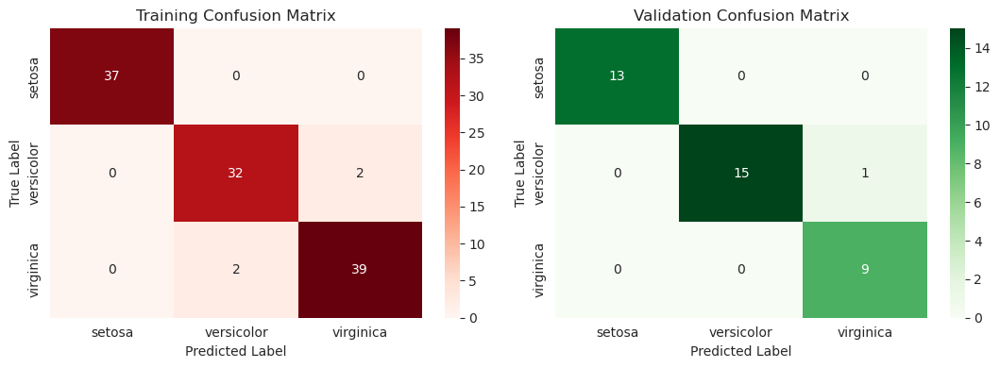






***************************************************************************
knn_raw , 	CV: True 

***************************************************************************
We will evaluate knn_raw with cross-validation.

 -> Creating instance of `RepeatedStratifiedKFold`
......Done!
 -> Creating the CV search
......Done!

 -> Fitting the model
......Done!
 -> CV Results:
		best f1_macro: 0.9546598753461499
		best params: {'model__algorithm': 'auto', 'model__leaf_size': 5, 'model__n_neighbors': 7, 'model__p': 1, 'model__weights': 'uniform'}
......Done!
 -> Making predictions
......Done!
 -> Creating Classification Reports
......Done!


Classification Report: Training
..................................................
|              |   precision |   recall |   f1-score |    support |
|:-------------|------------:|---------:|-----------:|-----------:|
| 0            |    1        | 1        |   1        |  37        |
| 1            |    0.911765 | 0.911765 |   0.911765 |  34     

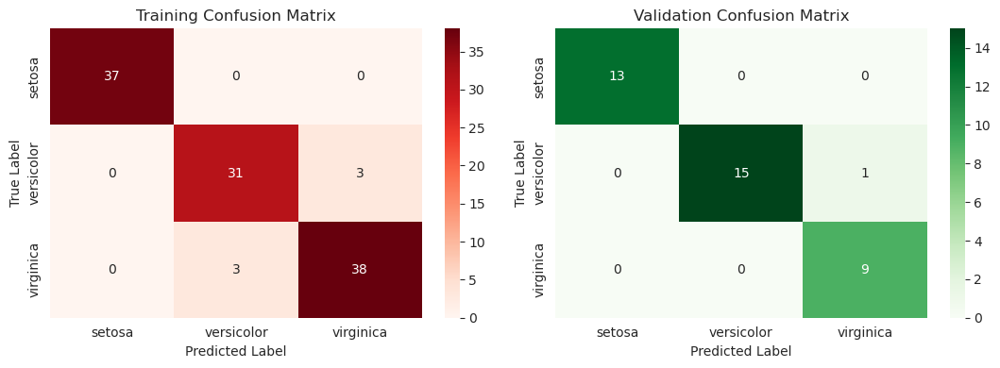



****************************************************************************************************
Performing Permutation Importance:
..................................................
The model's features are:

['petal_width', 'petal_length', 'sepal_width', 'sepal_length']
The most important features are:

	petal_width: 0.1315789473684211 +- 0.016643566632465173
	petal_length: 0.05789473684210531 +- 0.025784102555612372
	sepal_width: 0.005263157894736881 +- 0.030689220499185807
	sepal_length: 0.0 +- 0.0

****************************************************************************************************



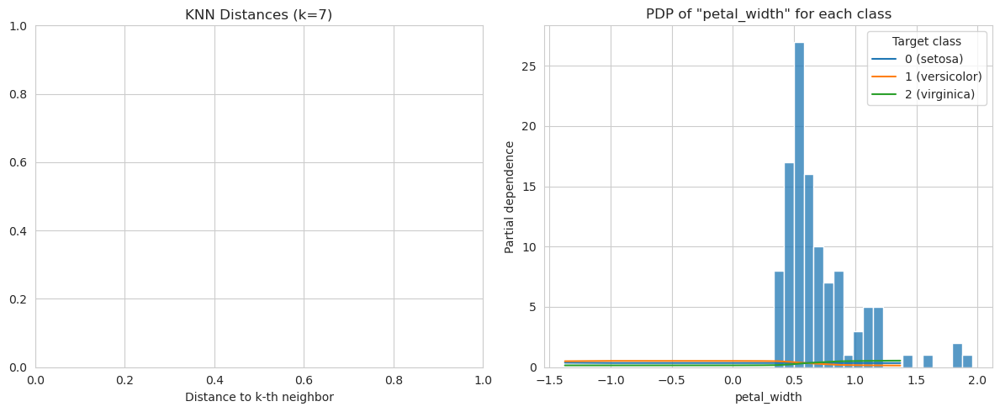

  0%|          | 0/38 [00:00<?, ?it/s]

num_full_subsets = 2
np.sum(w_aug) = 3.999999999999999
np.sum(self.kernelWeights) = 0.9999999999999998
phi = array([ 2.90581591, 13.31496401,  4.0588124 , 14.74953189])
np.sum(w_aug) = 3.999999999999999
np.sum(self.kernelWeights) = 0.9999999999999998
phi = array([ -2.62521567, -13.24986431,  -3.53194631, -13.91535479])
np.sum(w_aug) = 3.999999999999999
np.sum(self.kernelWeights) = 0.9999999999999998
phi = array([ -3.09898613,  -3.01248535,  -8.76761988, -19.21837379])
num_full_subsets = 2
np.sum(w_aug) = 3.999999999999999
np.sum(self.kernelWeights) = 0.9999999999999998
phi = array([ -2.60418757, -14.53463843,  -2.90046711, -14.00993507])
np.sum(w_aug) = 3.999999999999999
np.sum(self.kernelWeights) = 0.9999999999999998
phi = array([8.03171695, 9.157696  , 9.02029326, 9.5462651 ])
np.sum(w_aug) = 3.999999999999999
np.sum(self.kernelWeights) = 0.9999999999999998
phi = array([-10.65496234,   0.10873383, -11.68042442, -11.87081223])
num_full_subsets = 2
np.sum(w_aug) = 3.999999999999999
np.

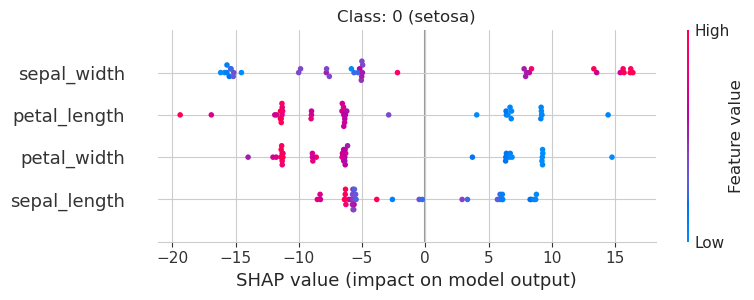

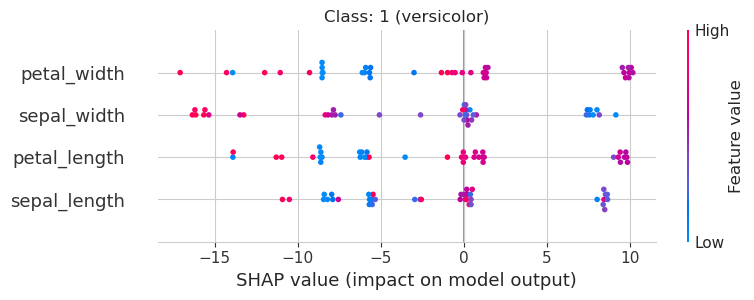

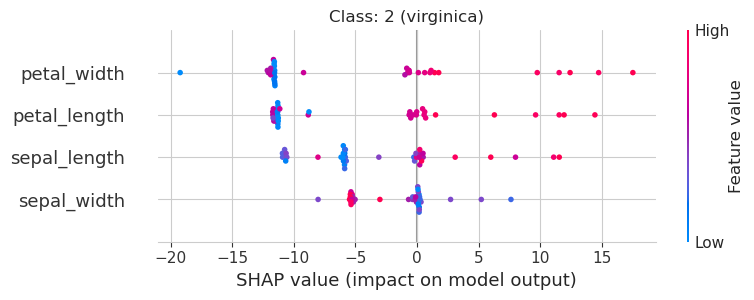




***************************************************************************
knn_eng , 	CV: False 

***************************************************************************
::::::::::::::::::::::::::::::::::::::::::::::::::::::::::::::::::::::
We will evaluate model=knn_eng with standard validation.
::::::::::::::::::::::::::::::::::::::::::::::::::::::::::::::::::::::

 -> Model is already fitted!
 -> Making predictions
......Done!
 -> Creating Classification Reports
......Done!


Classification Report: Training
..................................................
|              |   precision |   recall |   f1-score |    support |
|:-------------|------------:|---------:|-----------:|-----------:|
| 0            |    1        | 0.972973 |   0.986301 |  37        |
| 1            |    0.861111 | 0.911765 |   0.885714 |  34        |
| 2            |    0.925    | 0.902439 |   0.91358  |  41        |
| accuracy     |    0.928571 | 0.928571 |   0.928571 |   0.928571 |
| macro avg    | 

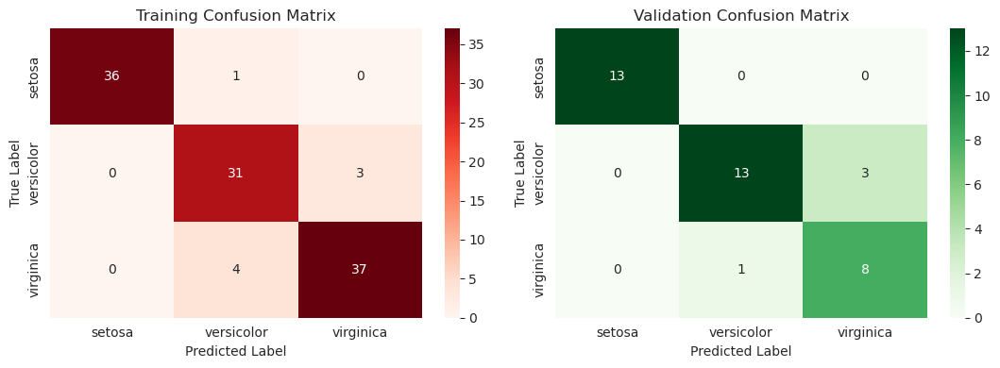






***************************************************************************
knn_eng , 	CV: True 

***************************************************************************
We will evaluate knn_eng with cross-validation.

 -> Creating instance of `RepeatedStratifiedKFold`
......Done!
 -> Creating the CV search
......Done!

 -> Fitting the model
......Done!
 -> CV Results:
		best f1_macro: 0.9431372680753488
		best params: {'model__algorithm': 'auto', 'model__leaf_size': 5, 'model__n_neighbors': 8, 'model__p': 2, 'model__weights': 'uniform', 'preprocessor__selector__corr_threshold': 0.5, 'preprocessor__selector__n_features': None}
......Done!
 -> Making predictions
......Done!
 -> Creating Classification Reports
......Done!


Classification Report: Training
..................................................
|              |   precision |   recall |   f1-score |    support |
|:-------------|------------:|---------:|-----------:|-----------:|
| 0            |    1        | 0.972973 

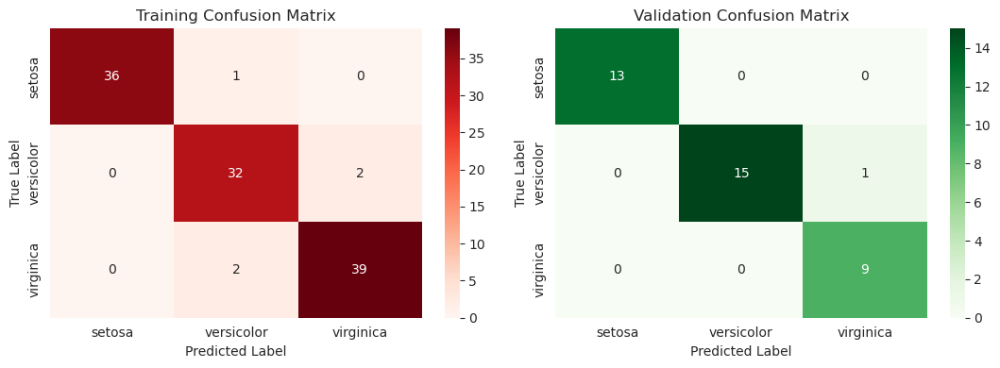



****************************************************************************************************
Performing Permutation Importance:
..................................................
The model's features are:

['petal_area', 'sepal_width']
The most important features are:

	petal_area: 0.5631578947368421 +- 0.054187527057826326
	sepal_width: 0.1 +- 0.010526315789473672

****************************************************************************************************



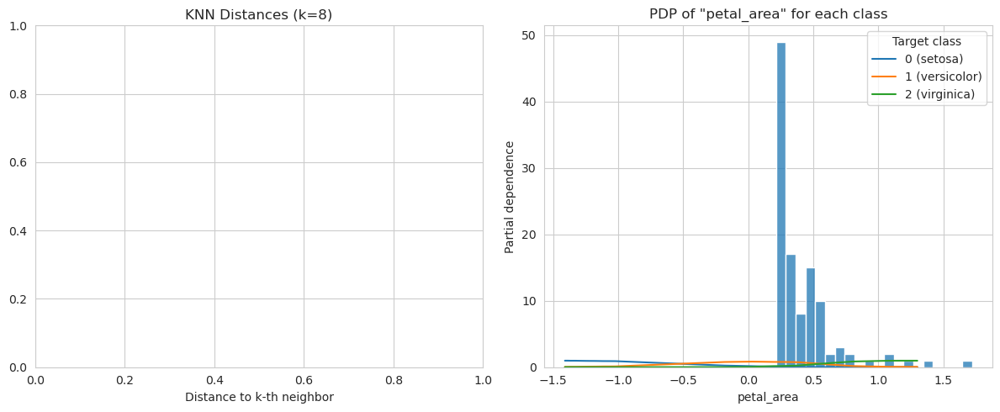

  0%|          | 0/38 [00:00<?, ?it/s]

num_full_subsets = 1
np.sum(w_aug) = 2.0
np.sum(self.kernelWeights) = 1.0
phi = array([19.54851451, 15.48060971])
np.sum(w_aug) = 2.0
np.sum(self.kernelWeights) = 1.0
phi = array([-17.45084536, -15.93525152])
np.sum(w_aug) = 2.0
np.sum(self.kernelWeights) = 1.0
phi = array([-34.16326243,   0.11403426])
num_full_subsets = 1
np.sum(w_aug) = 2.0
np.sum(self.kernelWeights) = 1.0
phi = array([-17.19610914, -16.85311902])
np.sum(w_aug) = 2.0
np.sum(self.kernelWeights) = 1.0
phi = array([18.91042814, 16.78182736])
np.sum(w_aug) = 2.0
np.sum(self.kernelWeights) = 1.0
phi = array([-19.8577081 , -14.19152007])
num_full_subsets = 1
np.sum(w_aug) = 2.0
np.sum(self.kernelWeights) = 1.0
phi = array([-18.9645639 , -15.08466427])
np.sum(w_aug) = 2.0
np.sum(self.kernelWeights) = 1.0
phi = array([19.14117344, 16.55108206])
np.sum(w_aug) = 2.0
np.sum(self.kernelWeights) = 1.0
phi = array([-17.51764789, -16.53158028])
num_full_subsets = 1
np.sum(w_aug) = 2.0
np.sum(self.kernelWeights) = 1.0
phi = array([1

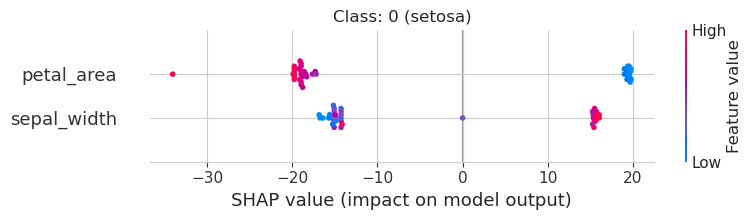

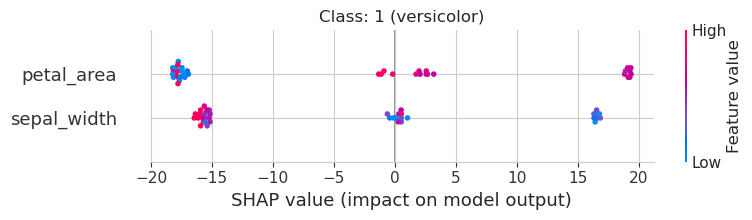

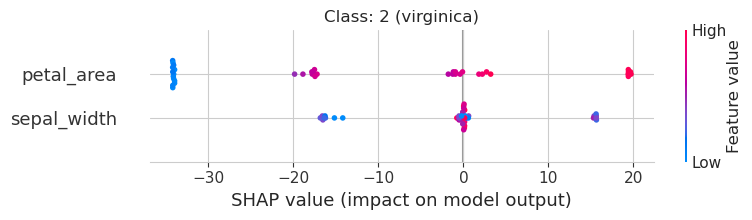

In [279]:
for pp in ['raw', 'eng']:
    for cvQ in [False, True]:

        model_name = model+'_'+pp # full model name

        print("*"*75)
        print(model_name, ", \tCV:", cvQ, "\n")
        print("*"*75)
        
        model_evaluation(model_name, (X_train, X_val, y_train, y_val),
                         n_splits=5, n_repeats=3,
                         perform_cv_randomized=(cvQ, False),
                         verbose=True, plots=True)

        print("\n")

        if cvQ:
            explain_model(model_name, best_cv[model_name]['pipe'], (X_train, X_val, y_train, y_val), tree_idx=0, random_state=0)

        print("\n\n")

In [351]:
model = 'knn'

Pipeline:

In [352]:
# defining the pipeline
pipe[model] = Pipeline(steps=[('box-cox', boxcox_scaler),
                              ('z-scaler', z_scaler),
                              ('model', KNeighborsClassifier())])

Hyperparameters to optimize:

In [353]:
# ?KNeighborsClassifier

In [354]:
# defining the hyperparameter grid
param_grid[model] = {
    'model__n_neighbors': list(range(3, 11)),
    'model__weights': ['uniform', 'distance'],
    'model__algorithm': ['auto', 'ball_tree', 'kd_tree', 'brute'],
    'model__leaf_size': [10*i for i in range(1, 5)],
    'model__p': [1, 2]
    }

Grid:

In [355]:
# putting everything together
grid[model] = GridSearchCV(pipe[model],
                    param_grid=param_grid[model],
                    scoring='f1_macro',
                    cv=5,
                    n_jobs=-1)# 

Fitting the grid-pipeline to the data:

In [356]:
grid[model].fit(X_train, y_train_label)

GridSearchCV(cv=5,
             estimator=Pipeline(steps=[('box-cox',
                                        PowerTransformer(method='box-cox')),
                                       ('z-scaler', StandardScaler()),
                                       ('model', KNeighborsClassifier())]),
             n_jobs=-1,
             param_grid={'model__algorithm': ['auto', 'ball_tree', 'kd_tree',
                                              'brute'],
                         'model__leaf_size': [10, 20, 30, 40],
                         'model__n_neighbors': [3, 4, 5, 6, 7, 8, 9, 10],
                         'model__p': [1, 2],
                         'model__weights': ['uniform', 'distance']},
             scoring='f1_macro')

In [357]:
print(model, "results:\n","."*100)
for score, std, params in zip(grid[model].cv_results_['mean_test_score'], grid[model].cv_results_['std_test_score'], grid[model].cv_results_['params']):
    print(f"mean CV f1-macro score: {score:.4f} +- {std:.4e} -> {params}")

knn results:
 ....................................................................................................
mean CV f1-macro score: 0.9425 +- 4.8655e-02 -> {'model__algorithm': 'auto', 'model__leaf_size': 10, 'model__n_neighbors': 3, 'model__p': 1, 'model__weights': 'uniform'}
mean CV f1-macro score: 0.9425 +- 4.8655e-02 -> {'model__algorithm': 'auto', 'model__leaf_size': 10, 'model__n_neighbors': 3, 'model__p': 1, 'model__weights': 'distance'}
mean CV f1-macro score: 0.9337 +- 4.0766e-02 -> {'model__algorithm': 'auto', 'model__leaf_size': 10, 'model__n_neighbors': 3, 'model__p': 2, 'model__weights': 'uniform'}
mean CV f1-macro score: 0.9337 +- 4.0766e-02 -> {'model__algorithm': 'auto', 'model__leaf_size': 10, 'model__n_neighbors': 3, 'model__p': 2, 'model__weights': 'distance'}
mean CV f1-macro score: 0.9261 +- 2.8898e-02 -> {'model__algorithm': 'auto', 'model__leaf_size': 10, 'model__n_neighbors': 4, 'model__p': 1, 'model__weights': 'uniform'}
mean CV f1-macro score: 0.9336 +-

Finding the best estimator and its properties:

In [358]:
best['pipe'][model] = grid[model].best_estimator_
best['model'][model] = best['pipe'][model].named_steps['model']
best['score'][model] = grid[model].best_score_
best['params'][model] = grid[model].best_params_

print("best f1-macro:", best['score'][model])
print("best params:", best['params'][model])

best f1-macro: 0.9425424672793093
best params: {'model__algorithm': 'auto', 'model__leaf_size': 10, 'model__n_neighbors': 3, 'model__p': 1, 'model__weights': 'uniform'}


Let us compute the F1 scores of the entire dataset in more detail:

In [359]:
y_preds = best['model'][model].predict(X_val_scaled) # compute predictions

for species, f1 in zip(classes, f1_score(y_val_label, y_preds, average=None)):
    print(species+" f1 score:\t", f1) # compute F1 for each class

print("*"*50)

for avg in ['micro', 'macro', 'weighted']:
    print(avg+":", f1_score(y_val_label, y_preds, average=avg)) # compute F1 for each different kind of average

val_score[model] = f1_score(y_val_label, y_preds, average='macro')

setosa f1 score:	 1.0
versicolor f1 score:	 0.9629629629629629
virginica f1 score:	 0.9090909090909091
**************************************************
micro: 0.9666666666666667
macro: 0.957351290684624
weighted: 0.9657687991021324


Let us consider now the permutation importance of the features used, to gain insight into what is being done by the tree:

In [360]:
print(permutation_importance(best['model'][model], X_val_scaled, y_val_label))
feat_import = dict(zip(X_val.columns, permutation_importance(best['model'][model], X_val_scaled, y_val_label, random_state=0)['importances_mean']))
feat_import

{'importances_mean': array([0.        , 0.        , 0.01333333, 0.01333333, 0.01333333,
       0.        , 0.00666667, 0.01333333]), 'importances_std': array([0.        , 0.        , 0.01632993, 0.01632993, 0.01632993,
       0.        , 0.01333333, 0.02666667]), 'importances': array([[0.        , 0.        , 0.        , 0.        , 0.        ],
       [0.        , 0.        , 0.        , 0.        , 0.        ],
       [0.03333333, 0.03333333, 0.        , 0.        , 0.        ],
       [0.03333333, 0.03333333, 0.        , 0.        , 0.        ],
       [0.        , 0.03333333, 0.        , 0.        , 0.03333333],
       [0.        , 0.        , 0.        , 0.        , 0.        ],
       [0.03333333, 0.        , 0.        , 0.        , 0.        ],
       [0.        , 0.06666667, 0.        , 0.        , 0.        ]])}


{'sepal_length': 0.0,
 'sepal_width': 0.006666666666666665,
 'petal_length': 0.01333333333333333,
 'petal_width': 0.01333333333333333,
 'sepal_area': 0.006666666666666665,
 'sepal_elongation': 0.0,
 'petal_area': 0.006666666666666665,
 'petal_elongation': 0.0}

So only three features are really being used:

In [361]:
{key:val for key, val in feat_import.items() if val > 0}

{'sepal_width': 0.006666666666666665,
 'petal_length': 0.01333333333333333,
 'petal_width': 0.01333333333333333,
 'sepal_area': 0.006666666666666665,
 'petal_area': 0.006666666666666665}

Let us now study the SHAP variables

In [362]:
explainer = explainer = shap.KernelExplainer(best['model'][model].predict_proba, X_train_scaled)
shap_values = explainer.shap_values(X_val_scaled)

print(shap_values.shape)

Using 120 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.


  0%|          | 0/30 [00:00<?, ?it/s]

num_full_subsets = 4
np.sum(w_aug) = 8.000000000000002
np.sum(self.kernelWeights) = 0.9999999999999996
phi = array([-0.02340608, -0.02912037, -0.06258598, -0.05832011, -0.0059127 ,
       -0.03874339, -0.06009921, -0.04403439])
np.sum(w_aug) = 8.000000000000002
np.sum(self.kernelWeights) = 0.9999999999999996
phi = array([-0.00287037,  0.02748677, -0.02847222, -0.1132672 ,  0.02185185,
        0.0102381 , -0.07441138, -0.15444444])
np.sum(w_aug) = 8.000000000000002
np.sum(self.kernelWeights) = 0.9999999999999996
phi = array([ 0.02627646,  0.0016336 ,  0.0910582 ,  0.1715873 , -0.01593915,
        0.02850529,  0.13451058,  0.19847884])
num_full_subsets = 4
np.sum(w_aug) = 8.000000000000002
np.sum(self.kernelWeights) = 0.9999999999999996
phi = array([-0.02689153, -0.05863095, -0.05122354, -0.04107804, -0.01833333,
       -0.05939153, -0.0454828 , -0.02119048])
np.sum(w_aug) = 8.000000000000002
np.sum(self.kernelWeights) = 0.9999999999999996
phi = array([-0.00948743, -0.01993056,  0.110671

(30, 8, 3)


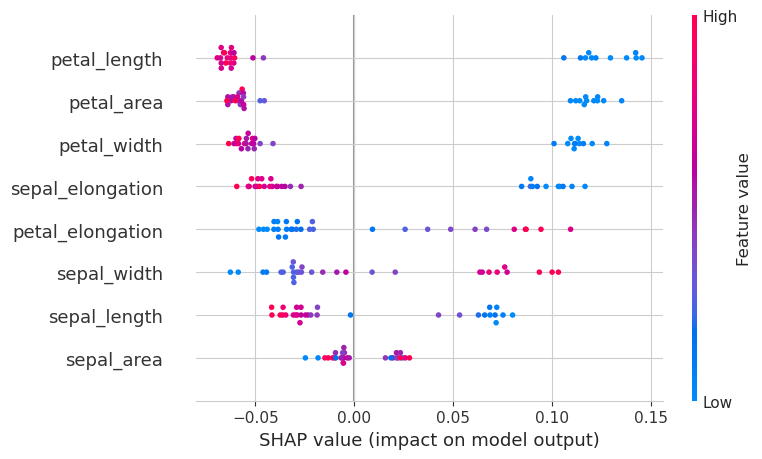

In [363]:
shap.summary_plot(shap_values[:,:,0], X_val, title=classes[0])

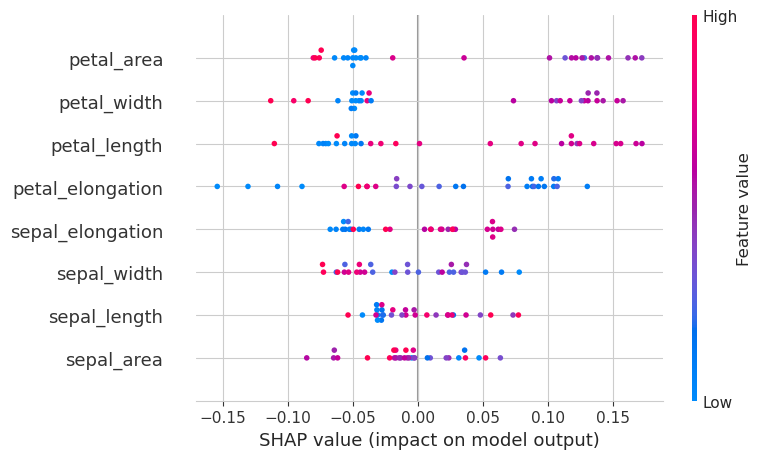

In [364]:
shap.summary_plot(shap_values[:,:,1], X_val, title=classes[1])

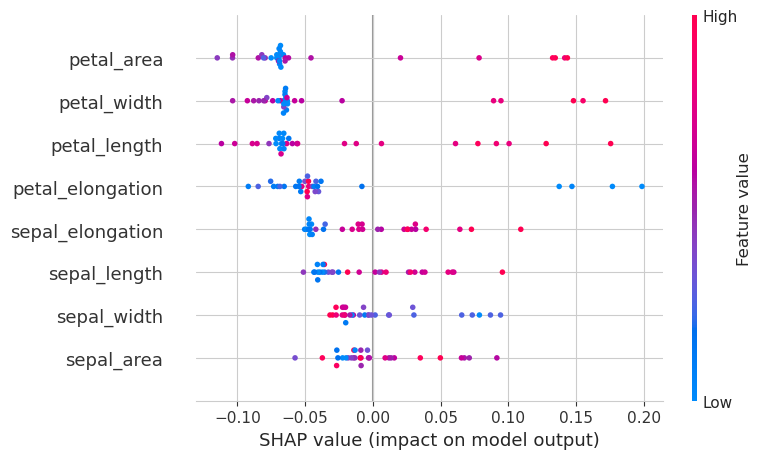

In [365]:
shap.summary_plot(shap_values[:,:,2], X_val, title=classes[2])

### Model 7: `GaussianNB`

In [ ]:
model = 'gnb'

for pp in ['raw', 'eng']:

    model_name = model+'_'+pp # full model name

    preproc_pipe = final_preproc[pp] # preprocessing  pipeline

    pipe[model_name] = Pipeline(steps=[('preprocessor', preproc_pipe),
                                       ('model', GaussianNB())])

    # defining the hyperparameter grid
    if pp == 'raw':
        param_grid[model_name] = {'var_smoothing': np.logspace(0,-9, num=100)}
    else:
        param_grid[model_name] = {'var_smoothing': np.logspace(0,-9, num=100),
                                  'preprocessor__selector__n_features': [None, len(X.columns)],
                                  'preprocessor__selector__corr_threshold': [0.5, 0.7, 0.9]}

In [ ]:
for pp in ['raw', 'eng']:
    for cvQ in [False, True]:

        model_name = model+'_'+pp # full model name

        print("*"*75)
        print(model_name, ", \tCV:", cvQ, "\n")
        print("*"*75)
        
        model_evaluation(model_name, (X_train, X_val, y_train, y_val),
                         n_splits=5, n_repeats=3,
                         perform_cv_randomized=(cvQ, False),
                         verbose=True, plots=True)

        print("\n")

        if cvQ:
            explain_model(model_name, best_cv[model_name]['pipe'], (X_train, X_val, y_train, y_val), tree_idx=0, random_state=0)

        print("\n\n")

### Model 8: `MLPClassifier`

In [ ]:
model = 'mlp'

for pp in ['raw', 'eng']:

    model_name = model+'_'+pp # full model name

    preproc_pipe = final_preproc[pp] # preprocessing  pipeline

    pipe[model_name] = Pipeline(steps=[('preprocessor', preproc_pipe),
                                       ('model', MLPClassifier())])

    # defining the hyperparameter grid
    if pp == 'raw':
        param_grid[model_name] = {'hidden_layer_sizes': np.arange(10, 100, 10),
                                  'alpha': np.arange(0.0001, 0.01, 0.0001)}
    else:
        param_grid[model_name] = {'hidden_layer_sizes': np.arange(10, 100, 10),
                                  'alpha': np.arange(0.0001, 0.01, 0.0001),
                                  'preprocessor__selector__n_features': [None, len(X.columns)],
                                  'preprocessor__selector__corr_threshold': [0.5, 0.7, 0.9]}

In [ ]:
for pp in ['raw', 'eng']:
    for cvQ in [False, True]:

        model_name = model+'_'+pp # full model name

        print("*"*75)
        print(model_name, ", \tCV:", cvQ, "\n")
        print("*"*75)
        
        model_evaluation(model_name, (X_train, X_val, y_train, y_val),
                         n_splits=5, n_repeats=3,
                         perform_cv_randomized=(cvQ, False),
                         verbose=True, plots=True)

        print("\n")

        if cvQ:
            explain_model(model_name, best_cv[model_name]['pipe'], (X_train, X_val, y_train, y_val), tree_idx=0, random_state=0)

        print("\n\n")

### Exploratory: standard validation

By this I mean that we are not using cross-validation, but only the Training and Validation datasets created above.

#### Model 1: `DecisionTreeClassifier`

In [35]:
# ?DecisionTreeClassifier

Begin by defining the `DecisionTreeClassifier` model, with given arguments (in particular, the `max_leaf_nodes` hyperparameter).

In [36]:
def model_dtc(max_leaf_nodes, criterion):
    return DecisionTreeClassifier(random_state=0, max_leaf_nodes=max_leaf_nodes, criterion=criterion)

Now, defining a function to compute the F1 score of the model:

In [37]:
def get_f1score(max_leaf_nodes, criterion, Xydata, avg='macro'):

    X_train, X_val, y_train, y_val = Xydata

    model = model_dtc(max_leaf_nodes, criterion)
    
    model.fit(X_train, y_train)
    y_preds = model.predict(X_val)

    return f1_score(y_val, y_preds, average=avg)

Performing the training and fit for various choices of hyperparameter `max_leaf_nodes`:

In [38]:
crit = 'gini' # splitting criterion
avg = 'macro' # macro average for F1

mln_list = [None] + list(range(2, 11)) # consider a range of values

f1s_list = [get_f1score(mln, crit, (X_train, X_val, y_train, y_val), avg=avg) for mln in mln_list] # computing F1

In [39]:
# showing results
mln_f1s = dict(zip(mln_list, f1s_list))

for key, val in mln_f1s.items():
    print('max_leaf_nodes =', str(key)+', \t f1 =', val)

max_leaf_nodes = None, 	 f1 = 0.957351290684624
max_leaf_nodes = 2, 	 f1 = 0.49333333333333335
max_leaf_nodes = 3, 	 f1 = 0.9095238095238095
max_leaf_nodes = 4, 	 f1 = 0.9095238095238095
max_leaf_nodes = 5, 	 f1 = 1.0
max_leaf_nodes = 6, 	 f1 = 0.957351290684624
max_leaf_nodes = 7, 	 f1 = 0.957351290684624
max_leaf_nodes = 8, 	 f1 = 0.957351290684624
max_leaf_nodes = 9, 	 f1 = 0.957351290684624
max_leaf_nodes = 10, 	 f1 = 0.957351290684624


We have found the best choice of hyperparameter:

In [40]:
best_max_leaf_nodes = max(mln_f1s, key=mln_f1s.get)
best_dtc_model = model_dtc(best_max_leaf_nodes, crit)

print("best max_leaf_nodes =", best_max_leaf_nodes)

best max_leaf_nodes = 5


Let us compute the F1 scores in more detail:

In [41]:
best_dtc_model.fit(X_train, y_train) # fit the model once more
y_preds = best_dtc_model.predict(X_val) # compute predictions

for species, f1 in zip(classes, f1_score(y_val, y_preds, average=None)):
    print(species+" f1 score:\t", f1) # compute F1 for each class

print("*"*50)

for avg in ['micro', 'macro', 'weighted']:
    print(avg+":", f1_score(y_val, y_preds, average=avg)) # compute F1 for each different kind of average

setosa f1 score:	 1.0
versicolor f1 score:	 1.0
virginica f1 score:	 1.0
**************************************************
micro: 1.0
macro: 1.0
weighted: 1.0


Let us consider now the permutation importance of the features used, to gain insight into what is being done by the tree:

In [42]:
print(permutation_importance(best_dtc_model, X_train, y_train))
feat_import = dict(zip(X_val.columns, permutation_importance(best_dtc_model, X_val, y_val, random_state=0)['importances_mean']))
feat_import

{'importances_mean': array([0.        , 0.        , 0.        , 0.47666667, 0.015     ,
       0.        , 0.35333333, 0.        ]), 'importances_std': array([0.        , 0.        , 0.        , 0.03551213, 0.0062361 ,
       0.        , 0.02333333, 0.        ]), 'importances': array([[0.        , 0.        , 0.        , 0.        , 0.        ],
       [0.        , 0.        , 0.        , 0.        , 0.        ],
       [0.        , 0.        , 0.        , 0.        , 0.        ],
       [0.48333333, 0.48333333, 0.45833333, 0.53333333, 0.425     ],
       [0.00833333, 0.01666667, 0.025     , 0.00833333, 0.01666667],
       [0.        , 0.        , 0.        , 0.        , 0.        ],
       [0.375     , 0.375     , 0.36666667, 0.325     , 0.325     ],
       [0.        , 0.        , 0.        , 0.        , 0.        ]])}


{'sepal_length': 0.0,
 'sepal_width': 0.0,
 'petal_length': 0.0,
 'petal_width': 0.5333333333333333,
 'sepal_area': 0.019999999999999997,
 'sepal_elongation': 0.0,
 'petal_area': 0.21333333333333332,
 'petal_elongation': 0.0}

So only three features are really being used:

In [43]:
{key:val for key, val in feat_import.items() if val > 0}

{'petal_width': 0.5333333333333333,
 'sepal_area': 0.019999999999999997,
 'petal_area': 0.21333333333333332}

Let us look at the Decision Tree of our model:

{'setosa': 39, 'versicolor': 37, 'virginica': 44}
--------------------------------------------------
Best DecisionTreeClassifier:



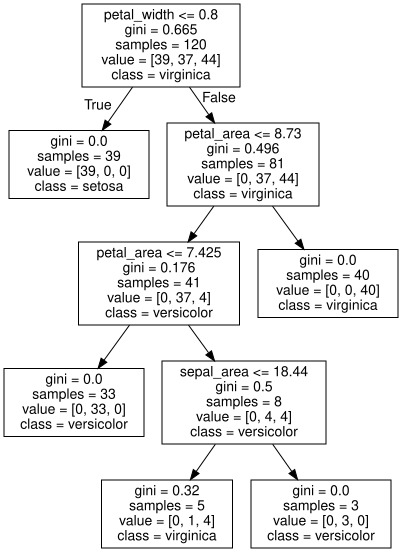

In [44]:
print({species:y_train.value_counts()[species] for species in classes})
print("-"*50)

tree_graph = tree.export_graphviz(best_dtc_model, out_file=None, feature_names=X.columns, class_names=classes)

print("Best DecisionTreeClassifier:\n")
graphviz.Source(tree_graph)

Let us now study the SHAP variables

In [45]:
explainer = shap.TreeExplainer(best_dtc_model)
dtc_shap_values = explainer.shap_values(X_val)

print(dtc_shap_values.shape)

(30, 8, 3)


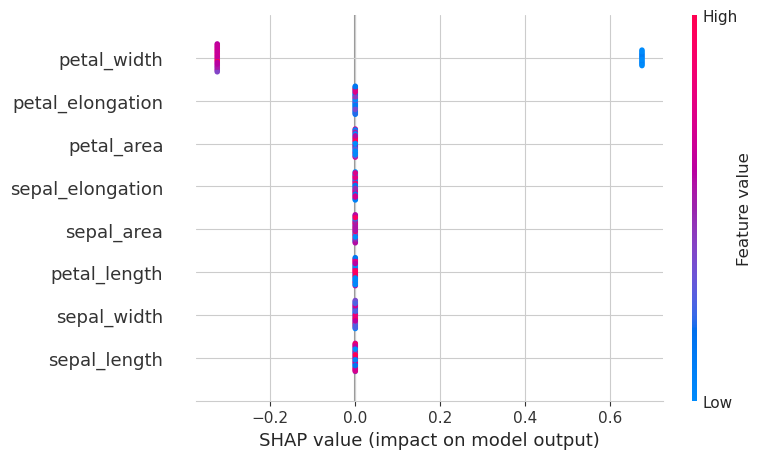

In [46]:
shap.summary_plot(dtc_shap_values[:,:,0], X_val, title=classes[0])

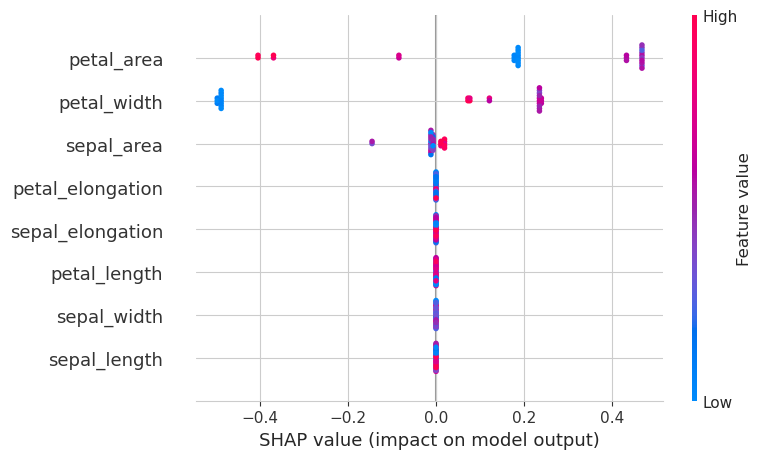

In [47]:
shap.summary_plot(dtc_shap_values[:,:,1], X_val, title=classes[1])

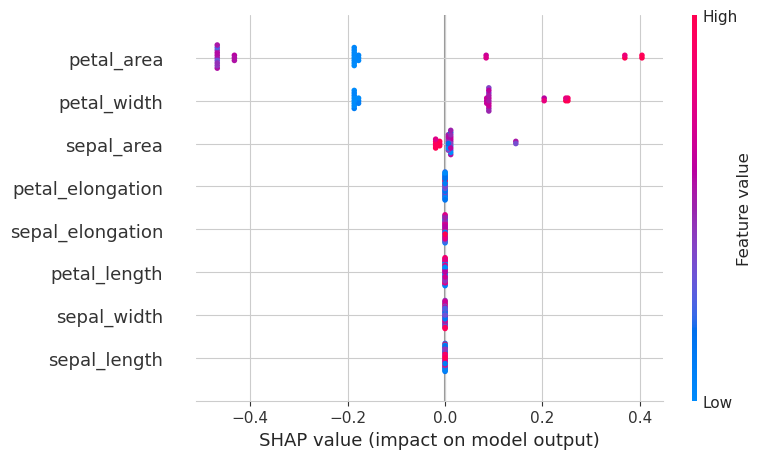

In [48]:
shap.summary_plot(dtc_shap_values[:,:,2], X_val, title=classes[2])

#### Model 2: `RandomForestClassifier`

In [49]:
# ?RandomForestClassifier

Begin by defining the `RandomForestClassifier` model, with given arguments (in particular, the `max_leaf_nodes` hyperparameter).

In [50]:
def model_rfc(max_leaf_nodes, n_estimators=100):
    return RandomForestClassifier(random_state=0, n_estimators=n_estimators, max_leaf_nodes=max_leaf_nodes)

Now, defining a function to compute the F1 score of the model:

In [51]:
def get_f1score(max_leaf_nodes, Xydata, avg='macro', n_estimators=100):

    X_train, X_val, y_train, y_val = Xydata

    model = model_rfc(max_leaf_nodes, n_estimators=n_estimators)
    
    model.fit(X_train, y_train)
    y_preds = model.predict(X_val)

    return f1_score(y_val, y_preds, average=avg)

Performing the training and fit for various choices of hyperparameter `max_leaf_nodes`:

In [52]:
crit = 'gini' # splitting criterion
nest = 100 # the default values of 100 performs very well!
avg = 'macro' # macro average for F1

mln_list = [None] + list(range(2, 11)) # consider a range of values
nest_list = [100*i for i in range(1,4)]

f1s_list = [get_f1score(mln, (X_train, X_val, y_train, y_val), avg=avg, n_estimators=nest) for mln in mln_list] # computing F1

In [53]:
# showing results
mln_f1s = dict(zip(mln_list, f1s_list))

for key, val in mln_f1s.items():
    print('max_leaf_nodes =', str(key)+', \t f1 =', val)

max_leaf_nodes = None, 	 f1 = 1.0
max_leaf_nodes = 2, 	 f1 = 0.9610256410256411
max_leaf_nodes = 3, 	 f1 = 0.957351290684624
max_leaf_nodes = 4, 	 f1 = 0.957351290684624
max_leaf_nodes = 5, 	 f1 = 0.957351290684624
max_leaf_nodes = 6, 	 f1 = 1.0
max_leaf_nodes = 7, 	 f1 = 1.0
max_leaf_nodes = 8, 	 f1 = 1.0
max_leaf_nodes = 9, 	 f1 = 1.0
max_leaf_nodes = 10, 	 f1 = 1.0


We have found the best choice of hyperparameter:

In [54]:
best_max_leaf_nodes = max(mln_f1s, key=mln_f1s.get)
best_rfc_model = model_rfc(best_max_leaf_nodes)

print("best max_leaf_nodes =", best_max_leaf_nodes)

best max_leaf_nodes = None


Let us compute the F1 scores in more detail:

In [55]:
best_rfc_model.fit(X_train, y_train) # fit the model once more
y_preds = best_rfc_model.predict(X_val) # compute predictions

for species, f1 in zip(classes, f1_score(y_val, y_preds, average=None)):
    print(species+" f1 score:\t", f1) # compute F1 for each class

print("*"*50)

for avg in ['micro', 'macro', 'weighted']:
    print(avg+":", f1_score(y_val, y_preds, average=avg)) # compute F1 for each different kind of average

setosa f1 score:	 1.0
versicolor f1 score:	 1.0
virginica f1 score:	 1.0
**************************************************
micro: 1.0
macro: 1.0
weighted: 1.0


Let us consider now the permutation importance of the features used, to gain insight into what is being done by the tree:

In [56]:
print(permutation_importance(best_rfc_model, X_train, y_train))
feat_import = dict(zip(X_val.columns, permutation_importance(best_rfc_model, X_val, y_val, random_state=0)['importances_mean']))
feat_import

{'importances_mean': array([0.        , 0.00666667, 0.01833333, 0.00666667, 0.        ,
       0.015     , 0.02833333, 0.        ]), 'importances_std': array([0.        , 0.00333333, 0.0062361 , 0.00816497, 0.        ,
       0.00333333, 0.01      , 0.        ]), 'importances': array([[0.        , 0.        , 0.        , 0.        , 0.        ],
       [0.        , 0.00833333, 0.00833333, 0.00833333, 0.00833333],
       [0.025     , 0.00833333, 0.025     , 0.01666667, 0.01666667],
       [0.        , 0.01666667, 0.        , 0.        , 0.01666667],
       [0.        , 0.        , 0.        , 0.        , 0.        ],
       [0.01666667, 0.01666667, 0.01666667, 0.00833333, 0.01666667],
       [0.01666667, 0.04166667, 0.03333333, 0.01666667, 0.03333333],
       [0.        , 0.        , 0.        , 0.        , 0.        ]])}


{'sepal_length': 0.0,
 'sepal_width': 0.01333333333333333,
 'petal_length': 0.033333333333333326,
 'petal_width': 0.01333333333333333,
 'sepal_area': 0.0,
 'sepal_elongation': 0.033333333333333326,
 'petal_area': 0.033333333333333326,
 'petal_elongation': 0.0}

Five features are really being used:

In [57]:
{key:val for key, val in feat_import.items() if val > 0}

{'sepal_width': 0.01333333333333333,
 'petal_length': 0.033333333333333326,
 'petal_width': 0.01333333333333333,
 'sepal_elongation': 0.033333333333333326,
 'petal_area': 0.033333333333333326}

Let us look at the Decision Tree of our model:

Example tree from RandomForestClassifier:



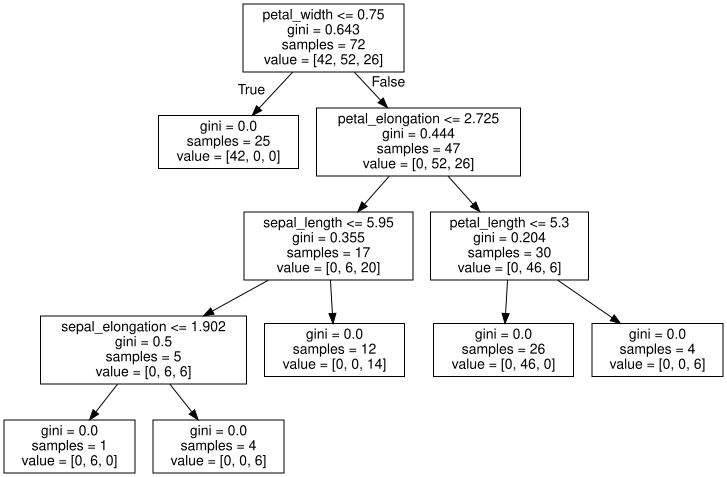

In [58]:
estimator_graph = tree.export_graphviz(best_rfc_model.estimators_[0], out_file=None, feature_names=X.columns)

print("Example tree from RandomForestClassifier:\n")
graphviz.Source(estimator_graph)

Finally, the SHAP variables:

In [59]:
explainer = shap.TreeExplainer(best_rfc_model)
rfc_shap_values = explainer.shap_values(X_val)

print(rfc_shap_values.shape)

(30, 8, 3)


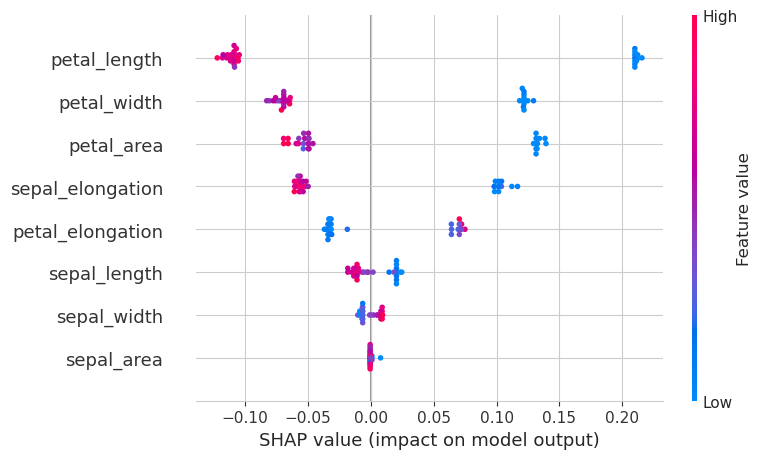

In [60]:
shap.summary_plot(rfc_shap_values[:,:,0], X_val, title=classes[0])

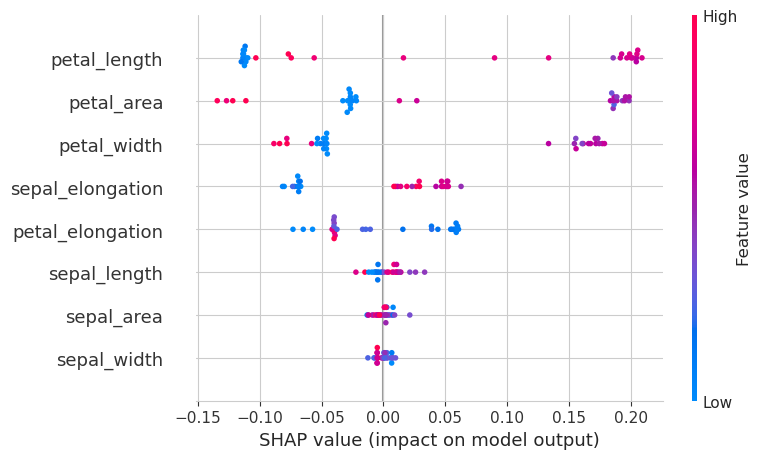

In [61]:
shap.summary_plot(rfc_shap_values[:,:,1], X_val, title=classes[1])

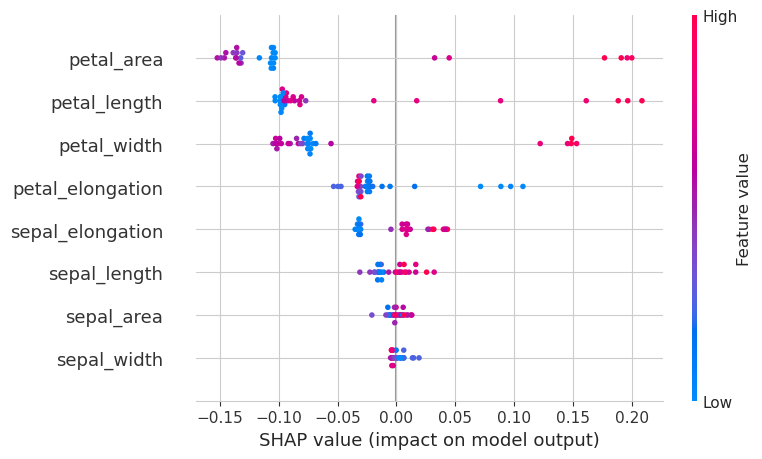

In [62]:
shap.summary_plot(rfc_shap_values[:,:,2], X_val, title=classes[2])

#### Model 3: `XGBClassifier`

In [63]:
# ?XGBClassifier

In [64]:
def model_xgbc(n_estimators=1000, learning_rate=0.05):
    return XGBClassifier(random_state=0, n_estimators=n_estimators, learning_rate=learning_rate)

In [65]:
def get_f1score(Xydata, avg='macro', n_estimators=100, learning_rate=0.05):

    X_train, X_val, y_train, y_val = Xydata

    model = model_xgbc(n_estimators=n_estimators, learning_rate=0.05)
    
    model.fit(X_train, y_train)
    y_preds = model.predict(X_val)

    return f1_score(y_val, y_preds, average=avg)

In [66]:
avg = 'macro' # macro average for F1

nest_list = [100*i for i in range(1,21)]
learn_list = [0.05*i for i in range(1,11)]

f1s_list = [[get_f1score((X_train, X_val, y_train_label, y_val_label), avg=avg, n_estimators=nest, learning_rate=learn) for nest in nest_list] for learn in learn_list] # computing F1

In [67]:
print(f1s_list)
print(max([max(f1s) for f1s in f1s_list]))

[[1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0], [1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0], [1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0], [1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0], [1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0], [1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0], [1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0], [1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0], [1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0], [1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 

All models seem equally good, so let's just use this default:

In [68]:
best_xgbc_model = model_xgbc()

Computing the F1 scores:

In [69]:
best_xgbc_model.fit(X_train, y_train_label) # fit the model once more
y_preds = best_xgbc_model.predict(X_val) # compute predictions

for species, f1 in zip(classes, f1_score(y_val_label, y_preds, average=None)):
    print(species+" f1 score:\t", f1) # compute F1 for each class

print("*"*50)

for avg in ['micro', 'macro', 'weighted']:
    print(avg+":", f1_score(y_val_label, y_preds, average=avg)) # compute F1 for each different kind of average

setosa f1 score:	 1.0
versicolor f1 score:	 1.0
virginica f1 score:	 1.0
**************************************************
micro: 1.0
macro: 1.0
weighted: 1.0


In [70]:
print(permutation_importance(best_xgbc_model, X_train, y_train_label))
feat_import = dict(zip(X_val.columns, permutation_importance(best_xgbc_model, X_val, y_val_label, random_state=0)['importances_mean']))
feat_import

{'importances_mean': array([0.        , 0.        , 0.35833333, 0.        , 0.00333333,
       0.        , 0.325     , 0.        ]), 'importances_std': array([0.        , 0.        , 0.03613247, 0.        , 0.00408248,
       0.        , 0.02173067, 0.        ]), 'importances': array([[0.        , 0.        , 0.        , 0.        , 0.        ],
       [0.        , 0.        , 0.        , 0.        , 0.        ],
       [0.33333333, 0.3       , 0.39166667, 0.39166667, 0.375     ],
       [0.        , 0.        , 0.        , 0.        , 0.        ],
       [0.        , 0.00833333, 0.00833333, 0.        , 0.        ],
       [0.        , 0.        , 0.        , 0.        , 0.        ],
       [0.30833333, 0.325     , 0.31666667, 0.36666667, 0.30833333],
       [0.        , 0.        , 0.        , 0.        , 0.        ]])}


{'sepal_length': 0.0,
 'sepal_width': 0.0,
 'petal_length': 0.5,
 'petal_width': 0.019999999999999997,
 'sepal_area': 0.01333333333333333,
 'sepal_elongation': 0.0,
 'petal_area': 0.18666666666666662,
 'petal_elongation': 0.019999999999999997}

In [71]:
{key:val for key, val in feat_import.items() if val > 0}

{'petal_length': 0.5,
 'petal_width': 0.019999999999999997,
 'sepal_area': 0.01333333333333333,
 'petal_area': 0.18666666666666662,
 'petal_elongation': 0.019999999999999997}

Let us work out the SHAP variables

In [72]:
explainer = shap.TreeExplainer(best_xgbc_model)
xgbc_shap_values = explainer.shap_values(X_val)

print(xgbc_shap_values.shape)

(30, 8, 3)


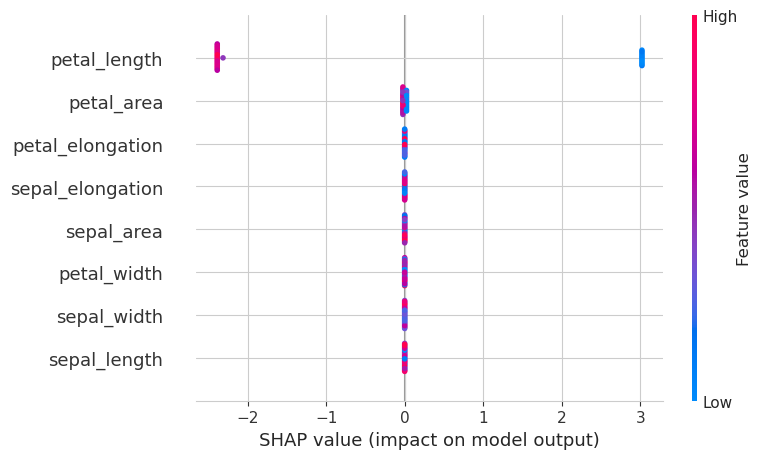

In [73]:
shap.summary_plot(xgbc_shap_values[:,:,0], X_val, title=classes[0])

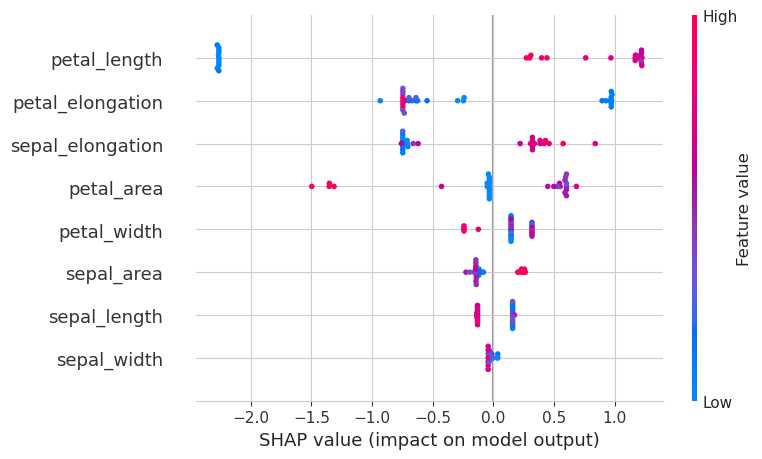

In [74]:
shap.summary_plot(xgbc_shap_values[:,:,1], X_val, title=classes[1])

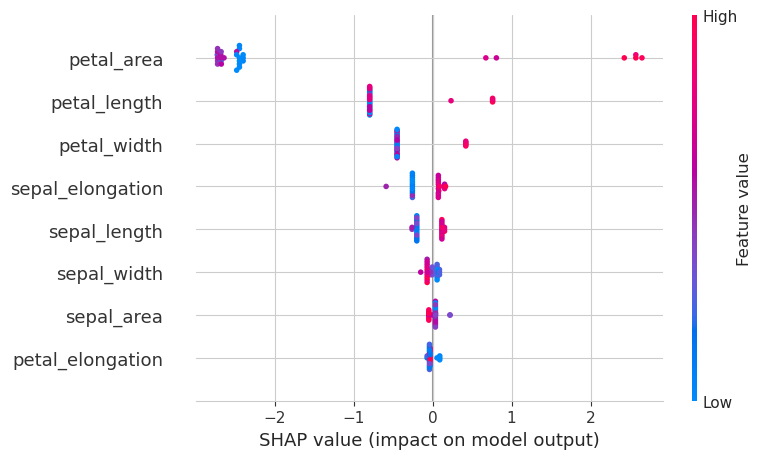

In [75]:
shap.summary_plot(xgbc_shap_values[:,:,2], X_val, title=classes[2])

#### Model 4: `LogisticRegression`

In [76]:
# ?LogisticRegression

In [79]:
def model_log(C=1.):
    return LogisticRegression(random_state=0, C=C, solver='lbfgs')

In [80]:
def get_f1score(Xydata, avg='macro', C=1.):

    X_train, X_val, y_train, y_val = Xydata

    model = model_log(C=C)
    
    model.fit(X_train, y_train)
    y_preds = model.predict(X_val)

    return f1_score(y_val, y_preds, average=avg)

In [81]:
avg = 'macro' # macro average for F1

C_list = [1.*i for i in range(1,11)]

f1s_list = [get_f1score((X_train_scaled, X_val_scaled, y_train_label, y_val_label), avg=avg, C=C_val) for C_val in C_list] # computing F1

In [82]:
# showing results:
C_f1s = dict(zip(C_list, f1s_list))

for key, val in C_f1s.items():
    print('C =', str(key)+', \t f1 =', val)

C = 1.0, 	 f1 = 0.957351290684624
C = 2.0, 	 f1 = 0.957351290684624
C = 3.0, 	 f1 = 1.0
C = 4.0, 	 f1 = 1.0
C = 5.0, 	 f1 = 1.0
C = 6.0, 	 f1 = 1.0
C = 7.0, 	 f1 = 1.0
C = 8.0, 	 f1 = 1.0
C = 9.0, 	 f1 = 1.0
C = 10.0, 	 f1 = 1.0


We have found the best choice of hyperparameter:

In [83]:
best_C = max(C_f1s, key=C_f1s.get)
best_logreg_model = model_log(best_C)

print("best C =", best_C)

best C = 3.0


Let us compute the F1 scores in more detail:

In [84]:
best_logreg_model.fit(X_train_scaled, y_train_label) # fit the model once more
y_preds = best_logreg_model.predict(X_val_scaled) # compute predictions

for species, f1 in zip(classes, f1_score(y_val_label, y_preds, average=None)):
    print(species+" f1 score:\t", f1) # compute F1 for each class

print("*"*50)

for avg in ['micro', 'macro', 'weighted']:
    print(avg+":", f1_score(y_val_label, y_preds, average=avg)) # compute F1 for each different kind of average

setosa f1 score:	 1.0
versicolor f1 score:	 1.0
virginica f1 score:	 1.0
**************************************************
micro: 1.0
macro: 1.0
weighted: 1.0


Let us consider now the permutation importance of the features used, to gain insight into what is being done by the tree:

In [85]:
print(permutation_importance(best_logreg_model, X_train_scaled, y_train_label))
feat_import = dict(zip(X_val.columns, permutation_importance(best_logreg_model, X_val_scaled, y_val_label, random_state=0)['importances_mean']))
feat_import

{'importances_mean': array([ 6.66666667e-03,  2.22044605e-17,  1.61666667e-01,  1.26666667e-01,
       -1.66666667e-03,  5.00000000e-03,  1.31666667e-01,  1.50000000e-02]), 'importances_std': array([0.00333333, 0.01054093, 0.01943651, 0.02068279, 0.00333333,
       0.01      , 0.02603417, 0.0062361 ]), 'importances': array([[ 0.00833333,  0.00833333,  0.00833333,  0.00833333,  0.        ],
       [ 0.01666667, -0.01666667,  0.        ,  0.        ,  0.        ],
       [ 0.16666667,  0.15      ,  0.13333333,  0.16666667,  0.19166667],
       [ 0.14166667,  0.09166667,  0.11666667,  0.15      ,  0.13333333],
       [ 0.        ,  0.        ,  0.        , -0.00833333,  0.        ],
       [ 0.01666667,  0.        ,  0.        , -0.00833333,  0.01666667],
       [ 0.13333333,  0.09166667,  0.11666667,  0.16666667,  0.15      ],
       [ 0.00833333,  0.01666667,  0.025     ,  0.01666667,  0.00833333]])}


{'sepal_length': 0.0,
 'sepal_width': 0.039999999999999994,
 'petal_length': 0.13999999999999996,
 'petal_width': 0.10666666666666665,
 'sepal_area': 0.006666666666666665,
 'sepal_elongation': 0.033333333333333326,
 'petal_area': 0.11999999999999997,
 'petal_elongation': 0.05333333333333332}

Five features are really being used:

In [86]:
{key:val for key, val in feat_import.items() if val > 0}

{'sepal_width': 0.039999999999999994,
 'petal_length': 0.13999999999999996,
 'petal_width': 0.10666666666666665,
 'sepal_area': 0.006666666666666665,
 'sepal_elongation': 0.033333333333333326,
 'petal_area': 0.11999999999999997,
 'petal_elongation': 0.05333333333333332}

Let us work the SHAP values:

In [87]:
explainer = shap.LinearExplainer(best_logreg_model, X_train_scaled)
logreg_shap_values = explainer.shap_values(X_val_scaled)

print(logreg_shap_values.shape)

(30, 8, 3)


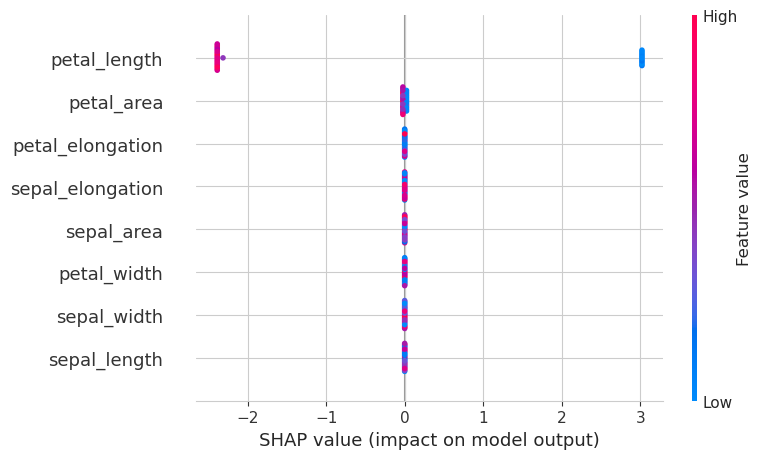

In [88]:
shap.summary_plot(xgbc_shap_values[:,:,0], X_val, title=classes[0], feature_names=X_train.columns)

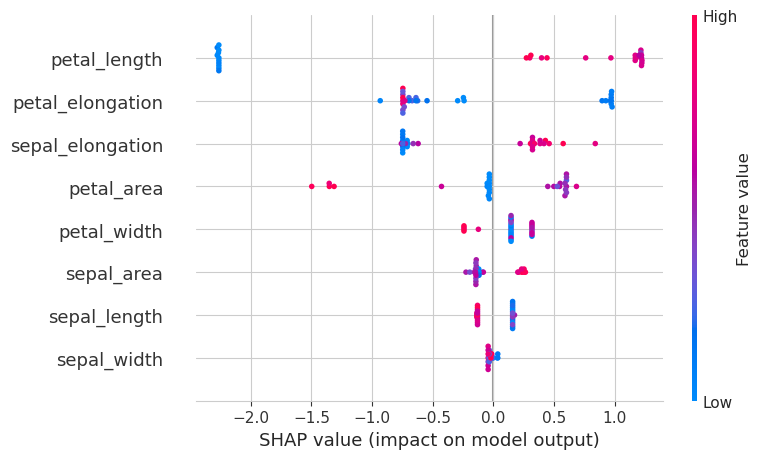

In [89]:
shap.summary_plot(xgbc_shap_values[:,:,1], X_val, title=classes[1], feature_names=X_train.columns)

In [ ]:
shap.summary_plot(xgbc_shap_values[:,:,2], X_val, title=classes[2], feature_names=X_train.columns)

#### Model 5: `KNeighborsClassifier`

In [196]:
# ?KNeighborsClassifier

In [182]:
def model_knn(n_neighbors):
    return KNeighborsClassifier(n_neighbors=n_neighbors, weights='distance')

In [183]:
def get_f1score(Xydata, avg='macro', n_neighbors=3):

    X_train, X_val, y_train, y_val = Xydata

    model = model_knn(n_neighbors=n_neighbors)
    
    model.fit(X_train, y_train)
    y_preds = model.predict(X_val)

    return f1_score(y_val, y_preds, average=avg)

In [184]:
avg = 'macro' # macro average for F1

nn_list = list(range(3, 11))

f1s_list = [get_f1score((X_train_scaled, X_val_scaled, y_train_label, y_val_label), avg=avg, n_neighbors=nn) for nn in nn_list] # computing F1

In [185]:
# showing results:
nn_f1s = dict(zip(nn_list, f1s_list))

for key, val in nn_f1s.items():
    print('n_neighbors =', str(key)+', \t f1 =', val)

n_neighbors = 3, 	 f1 = 0.957351290684624
n_neighbors = 4, 	 f1 = 0.957351290684624
n_neighbors = 5, 	 f1 = 0.957351290684624
n_neighbors = 6, 	 f1 = 0.957351290684624
n_neighbors = 7, 	 f1 = 0.957351290684624
n_neighbors = 8, 	 f1 = 0.957351290684624
n_neighbors = 9, 	 f1 = 0.957351290684624
n_neighbors = 10, 	 f1 = 0.957351290684624


We have found the best choice of hyperparameter:

In [186]:
best_nn = max(nn_f1s, key=nn_f1s.get)
best_knn_model = model_knn(best_nn)

print("best n_neighbors =", best_nn)

best n_neighbors = 3


Let us compute the F1 scores in more detail:

In [187]:
best_knn_model.fit(X_train_scaled, y_train_label) # fit the model once more
y_preds = best_knn_model.predict(X_val_scaled) # compute predictions

for species, f1 in zip(classes, f1_score(y_val_label, y_preds, average=None)):
    print(species+" f1 score:\t", f1) # compute F1 for each class

print("*"*50)

for avg in ['micro', 'macro', 'weighted']:
    print(avg+":", f1_score(y_val_label, y_preds, average=avg)) # compute F1 for each different kind of average

setosa f1 score:	 1.0
versicolor f1 score:	 0.9629629629629629
virginica f1 score:	 0.9090909090909091
**************************************************
micro: 0.9666666666666667
macro: 0.957351290684624
weighted: 0.9657687991021324


Let us consider now the permutation importance of the features used, to gain insight into what is being done by the tree:

In [188]:
print(permutation_importance(best_knn_model, X_train_scaled, y_train_label))
feat_import = dict(zip(X_val.columns, permutation_importance(best_knn_model, X_val_scaled, y_val_label, random_state=0)['importances_mean']))
feat_import

{'importances_mean': array([0.045     , 0.05166667, 0.13666667, 0.125     , 0.03166667,
       0.05833333, 0.13166667, 0.04166667]), 'importances_std': array([0.00849837, 0.02953341, 0.00666667, 0.01394433, 0.01105542,
       0.01666667, 0.01224745, 0.01666667]), 'importances': array([[0.05833333, 0.04166667, 0.03333333, 0.04166667, 0.05      ],
       [0.04166667, 0.10833333, 0.025     , 0.03333333, 0.05      ],
       [0.13333333, 0.14166667, 0.14166667, 0.14166667, 0.125     ],
       [0.10833333, 0.125     , 0.15      , 0.125     , 0.11666667],
       [0.025     , 0.03333333, 0.05      , 0.03333333, 0.01666667],
       [0.03333333, 0.08333333, 0.06666667, 0.05833333, 0.05      ],
       [0.125     , 0.125     , 0.14166667, 0.15      , 0.11666667],
       [0.03333333, 0.06666667, 0.05      , 0.01666667, 0.04166667]])}


{'sepal_length': 0.01333333333333333,
 'sepal_width': 0.019999999999999997,
 'petal_length': 0.059999999999999984,
 'petal_width': 0.059999999999999984,
 'sepal_area': 0.01333333333333333,
 'sepal_elongation': 0.019999999999999997,
 'petal_area': 0.059999999999999984,
 'petal_elongation': 0.06666666666666665}

Five features are really being used:

In [189]:
{key:val for key, val in feat_import.items() if val > 0}

{'sepal_length': 0.01333333333333333,
 'sepal_width': 0.019999999999999997,
 'petal_length': 0.059999999999999984,
 'petal_width': 0.059999999999999984,
 'sepal_area': 0.01333333333333333,
 'sepal_elongation': 0.019999999999999997,
 'petal_area': 0.059999999999999984,
 'petal_elongation': 0.06666666666666665}

Let us work the SHAP values:

In [192]:
explainer = shap.KernelExplainer(best_knn_model.predict_proba, X_train_scaled)
knn_shap_values = explainer.shap_values(X_val_scaled)

print(knn_shap_values.shape)

Using 120 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.


  0%|          | 0/30 [00:00<?, ?it/s]

num_full_subsets = 4
np.sum(w_aug) = 8.000000000000002
np.sum(self.kernelWeights) = 0.9999999999999996
phi = array([-0.01226573, -0.02599379, -0.06618906, -0.07549806, -0.00057193,
       -0.03207309, -0.07241917, -0.03998916])
np.sum(w_aug) = 8.000000000000002
np.sum(self.kernelWeights) = 0.9999999999999996
phi = array([-0.0014408 ,  0.00836014, -0.00849366, -0.07057111,  0.00857433,
       -0.01148337, -0.05149848, -0.18178039])
np.sum(w_aug) = 8.000000000000002
np.sum(self.kernelWeights) = 0.9999999999999996
phi = array([ 0.01370653,  0.01763365,  0.07468273,  0.14606917, -0.0080024 ,
        0.04355646,  0.12391765,  0.22176954])
num_full_subsets = 4
np.sum(w_aug) = 8.000000000000002
np.sum(self.kernelWeights) = 0.9999999999999996
phi = array([-0.02480676, -0.06756519, -0.04546709, -0.03220542, -0.00495468,
       -0.09425915, -0.03693817, -0.01880354])
np.sum(w_aug) = 8.000000000000002
np.sum(self.kernelWeights) = 0.9999999999999996
phi = array([ 0.01894032, -0.00993345,  0.090360

(30, 8, 3)


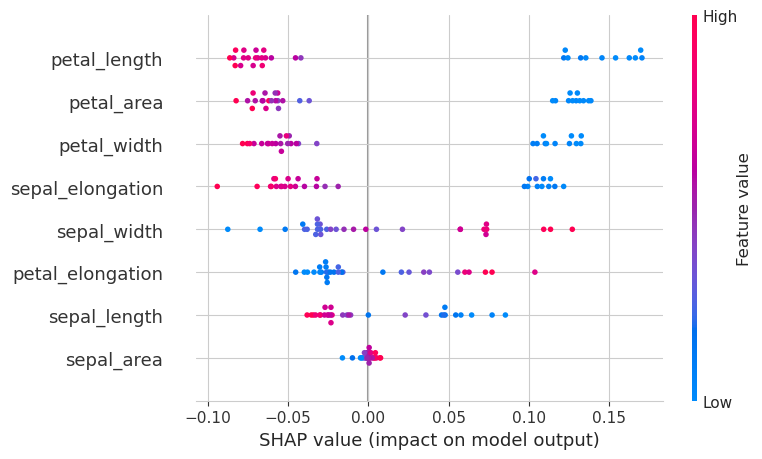

In [193]:
shap.summary_plot(knn_shap_values[:,:,0], X_val, title=classes[0], feature_names=X_train.columns)

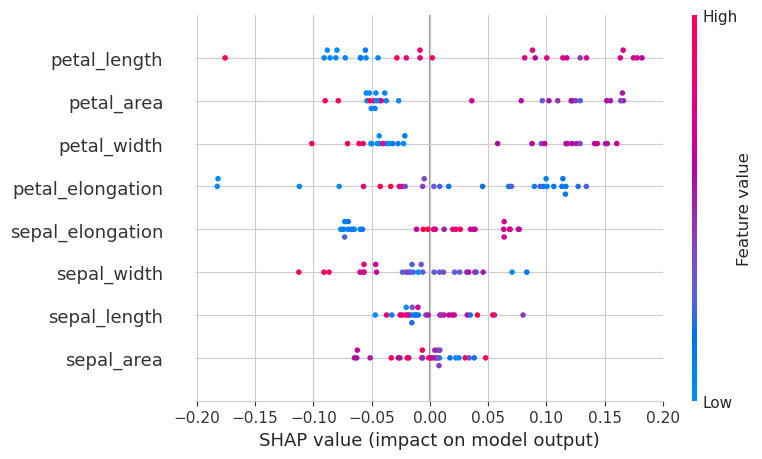

In [194]:
shap.summary_plot(knn_shap_values[:,:,1], X_val, title=classes[1], feature_names=X_train.columns)

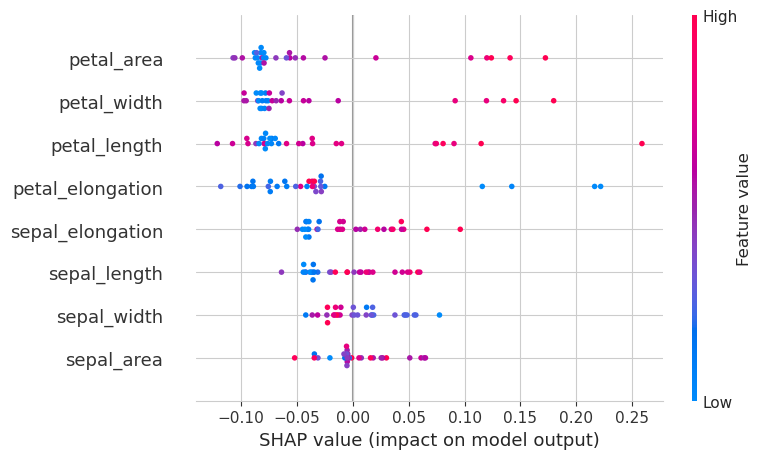

In [195]:
shap.summary_plot(knn_shap_values[:,:,2], X_val, title=classes[2], feature_names=X_train.columns)

#### Model 6: `SVC`

In [226]:
# ?SVC

In [214]:
def model_svc(C=1.):
    return SVC(C=C, kernel='rbf', probability=True, random_state=0)

In [215]:
def get_f1score(Xydata, avg='macro', C=1.):

    X_train, X_val, y_train, y_val = Xydata

    model = model_svc(C=C)
    
    model.fit(X_train, y_train)
    y_preds = model.predict(X_val)

    return f1_score(y_val, y_preds, average=avg)

In [216]:
avg = 'macro' # macro average for F1

C_list = [0.5*i for i in range(1, 21)]

f1s_list = [get_f1score((X_train_scaled, X_val_scaled, y_train_label, y_val_label), avg=avg, C=c_val) for c_val in C_list] # computing F1

In [217]:
# showing results:
C_f1s = dict(zip(C_list, f1s_list))

for key, val in C_f1s.items():
    print('C =', str(key)+', \t f1 =', val)

C = 0.5, 	 f1 = 0.957351290684624
C = 1.0, 	 f1 = 0.957351290684624
C = 1.5, 	 f1 = 0.957351290684624
C = 2.0, 	 f1 = 0.957351290684624
C = 2.5, 	 f1 = 0.957351290684624
C = 3.0, 	 f1 = 0.957351290684624
C = 3.5, 	 f1 = 0.957351290684624
C = 4.0, 	 f1 = 0.957351290684624
C = 4.5, 	 f1 = 0.957351290684624
C = 5.0, 	 f1 = 0.957351290684624
C = 5.5, 	 f1 = 0.957351290684624
C = 6.0, 	 f1 = 0.957351290684624
C = 6.5, 	 f1 = 0.957351290684624
C = 7.0, 	 f1 = 0.957351290684624
C = 7.5, 	 f1 = 0.957351290684624
C = 8.0, 	 f1 = 0.957351290684624
C = 8.5, 	 f1 = 0.957351290684624
C = 9.0, 	 f1 = 0.957351290684624
C = 9.5, 	 f1 = 0.957351290684624
C = 10.0, 	 f1 = 0.957351290684624


We have found the best choice of hyperparameter:

In [218]:
best_C = max(C_f1s, key=C_f1s.get)
best_svc_model = model_svc(best_C)

print("best C =", best_C)

best C = 0.5


Let us compute the F1 scores in more detail:

In [219]:
best_svc_model.fit(X_train_scaled, y_train_label) # fit the model once more
y_preds = best_knn_model.predict(X_val_scaled) # compute predictions

for species, f1 in zip(classes, f1_score(y_val_label, y_preds, average=None)):
    print(species+" f1 score:\t", f1) # compute F1 for each class

print("*"*50)

for avg in ['micro', 'macro', 'weighted']:
    print(avg+":", f1_score(y_val_label, y_preds, average=avg)) # compute F1 for each different kind of average

setosa f1 score:	 1.0
versicolor f1 score:	 0.9629629629629629
virginica f1 score:	 0.9090909090909091
**************************************************
micro: 0.9666666666666667
macro: 0.957351290684624
weighted: 0.9657687991021324


Let us consider now the permutation importance of the features used, to gain insight into what is being done by the tree:

In [220]:
print(permutation_importance(best_svc_model, X_train_scaled, y_train_label))
feat_import = dict(zip(X_val.columns, permutation_importance(best_svc_model, X_val_scaled, y_val_label, random_state=0)['importances_mean']))
feat_import

{'importances_mean': array([-4.44089210e-17, -5.00000000e-03,  1.05000000e-01,  1.08333333e-01,
       -3.33333333e-03, -1.66666667e-03,  1.11666667e-01,  4.83333333e-02]), 'importances_std': array([0.00745356, 0.00666667, 0.02333333, 0.02415229, 0.00666667,
       0.00816497, 0.02392117, 0.01105542]), 'importances': array([[ 0.00833333, -0.00833333,  0.00833333, -0.00833333,  0.        ],
       [ 0.        , -0.00833333,  0.        , -0.01666667,  0.        ],
       [ 0.08333333,  0.09166667,  0.1       ,  0.1       ,  0.15      ],
       [ 0.1       ,  0.10833333,  0.075     ,  0.10833333,  0.15      ],
       [ 0.        , -0.00833333, -0.00833333, -0.00833333,  0.00833333],
       [ 0.        ,  0.00833333,  0.        , -0.01666667,  0.        ],
       [ 0.09166667,  0.10833333,  0.08333333,  0.125     ,  0.15      ],
       [ 0.03333333,  0.04166667,  0.05      ,  0.05      ,  0.06666667]])}


{'sepal_length': 0.0,
 'sepal_width': 0.01333333333333333,
 'petal_length': 0.059999999999999984,
 'petal_width': 0.046666666666666655,
 'sepal_area': 0.0,
 'sepal_elongation': 0.01333333333333333,
 'petal_area': 0.046666666666666655,
 'petal_elongation': 0.05333333333333332}

Five features are really being used:

In [221]:
{key:val for key, val in feat_import.items() if val > 0}

{'sepal_width': 0.01333333333333333,
 'petal_length': 0.059999999999999984,
 'petal_width': 0.046666666666666655,
 'sepal_elongation': 0.01333333333333333,
 'petal_area': 0.046666666666666655,
 'petal_elongation': 0.05333333333333332}

Let us work the SHAP values:

In [222]:
explainer = shap.KernelExplainer(best_svc_model.predict_proba, X_train_scaled)
knn_shap_values = explainer.shap_values(X_val_scaled)

print(knn_shap_values.shape)

Using 120 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.


  0%|          | 0/30 [00:00<?, ?it/s]

num_full_subsets = 4
np.sum(w_aug) = 8.000000000000002
np.sum(self.kernelWeights) = 0.9999999999999996
phi = array([-0.01509485, -0.02309669, -0.05761933, -0.07010251, -0.00077192,
       -0.03235288, -0.06696963, -0.03435762])
np.sum(w_aug) = 8.000000000000002
np.sum(self.kernelWeights) = 0.9999999999999996
phi = array([ 0.01216105,  0.00174563, -0.01488923, -0.08491637, -0.00581886,
        0.01576644, -0.05682993, -0.1613051 ])
np.sum(w_aug) = 8.000000000000002
np.sum(self.kernelWeights) = 0.9999999999999996
phi = array([0.0029338 , 0.02135106, 0.07250855, 0.15501888, 0.00659077,
       0.01658644, 0.12379955, 0.19566272])
num_full_subsets = 4
np.sum(w_aug) = 8.000000000000002
np.sum(self.kernelWeights) = 0.9999999999999996
phi = array([-0.02321688, -0.07221902, -0.03771983, -0.02451349, -0.01157898,
       -0.09516883, -0.02939739, -0.00718227])
np.sum(w_aug) = 8.000000000000002
np.sum(self.kernelWeights) = 0.9999999999999996
phi = array([0.03654216, 0.06947452, 0.09961728, 0.11343

(30, 8, 3)


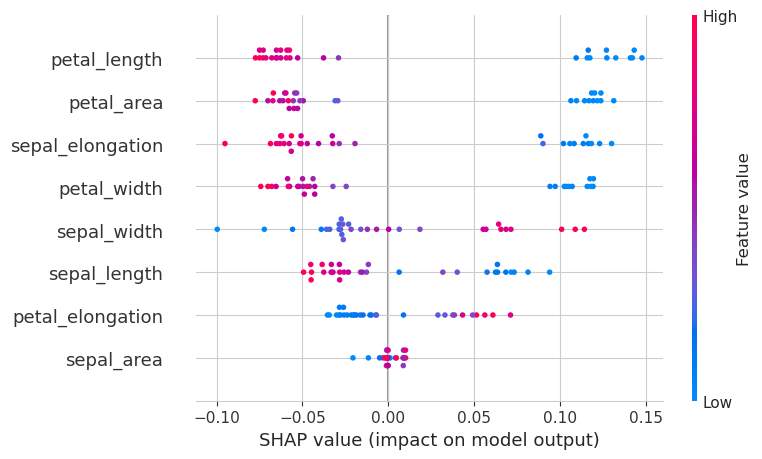

In [223]:
shap.summary_plot(knn_shap_values[:,:,0], X_val, title=classes[0], feature_names=X_train.columns)

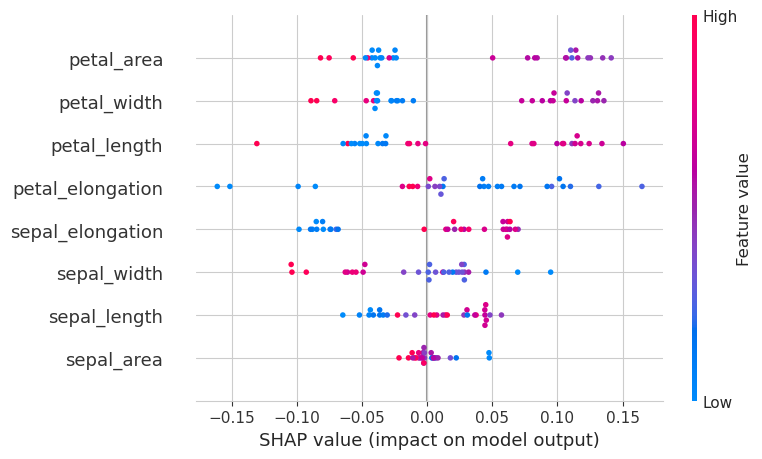

In [224]:
shap.summary_plot(knn_shap_values[:,:,1], X_val, title=classes[1], feature_names=X_train.columns)

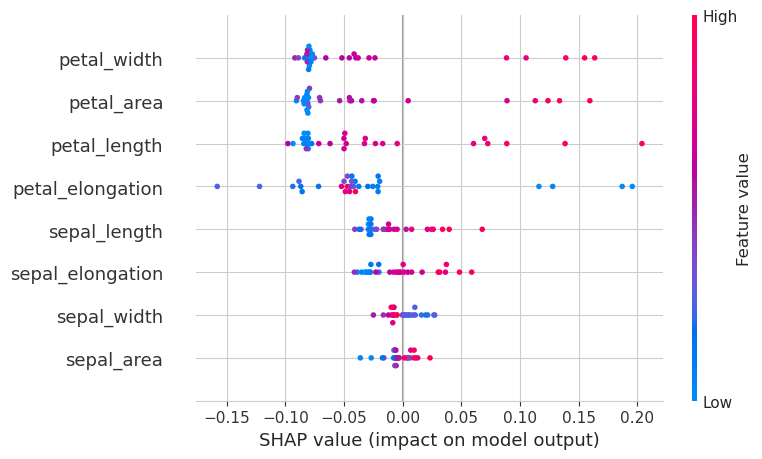

In [225]:
shap.summary_plot(knn_shap_values[:,:,2], X_val, title=classes[2], feature_names=X_train.columns)

## 7. Exporting Best Model

In [395]:
import pickle

In [377]:
models = ['dtc', 'rfc', 'xbgc', 'logreg', 'knn', 'svc']

Let us review the best scores:

In [390]:
val_score

{'dtc': 1.0,
 'rfc': 1.0,
 'xgbc': 1.0,
 'logreg': 0.957351290684624,
 'knn': 0.957351290684624,
 'svc': 0.957351290684624}

It is evident that `dtc`, `rfc`, and `xgbc` performed the best. Which one to pick? Well, let's look at their mean CV test scores, and their standard deviations:

In [397]:
stds = {}
for model in ['dtc', 'rfc', 'xgbc']:
    print(model)
    idx_largest_score = grid[model].cv_results_['mean_test_score'].argmax()
    print("found best score?", grid[model].cv_results_['mean_test_score'][idx_largest_score] == best['score'][model])
    print("best score:", best['score'][model], "+-", grid[model].cv_results_['std_test_score'][idx_largest_score], "\n")

    stds[model] = grid[model].cv_results_['std_test_score'][idx_largest_score]

dtc
found best score? True
best score: 0.9500731403672582 +- 0.030405697137195813 

rfc
found best score? True
best score: 0.9422953625894802 +- 0.032881601436071654 

xgbc
found best score? True
best score: 0.9415462424285955 +- 0.019098092242766804 



Since their best mean CV scores are all within each others standard deviations, they are all functionally equivalent in the CV. Thus, what matters is precisely the standard deviation, which is evidence of their stability. Evidently, the one that is the most stable (smallest standard deviation) is `xgbc`. So we will pick that one.

In [399]:
overall_best_model = min(stds, key=stds.get)
print(overall_best_model)

xgbc


In [400]:
best['model'][overall_best_model]

XGBClassifier(base_score=None, booster=None, callbacks=None,
              colsample_bylevel=None, colsample_bynode=None,
              colsample_bytree=None, device=None, early_stopping_rounds=None,
              enable_categorical=False, eval_metric=None, feature_types=None,
              feature_weights=None, gamma=None, grow_policy=None,
              importance_type=None, interaction_constraints=None,
              learning_rate=0.03, max_bin=None, max_cat_threshold=None,
              max_cat_to_onehot=None, max_delta_step=None, max_depth=None,
              max_leaves=None, min_child_weight=None, missing=nan,
              monotone_constraints=None, multi_strategy=None, n_estimators=1700,
              n_jobs=None, num_parallel_tree=None, ...)

To save it, we pickle it:

In [ ]:
model_path = "./models/"+overall_best_model+".pkl"

In [406]:
# with open(model_path, "wb") as f:
#     pickle.dump(best['model'][overall_best_model], f)

To load the model, run the cell below:

In [409]:
# with open(model_path, "rb") as f:
#     my_best_model = pickle.load(f)

# my_best_model